In [1]:
import time
import torch
import json
import warnings
import torchvision
import os
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import torchvision.models as models

from pathlib import Path
from tqdm import tqdm
from PIL import Image
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, precision_recall_fscore_support
from torch.utils.data import Dataset, DataLoader
from torchvision.models import EfficientNet
from utils.loss_functions import tkd_kdloss
from utils.loss_functions import tkd_kdloss, DD_loss, AD_loss, RKDDistanceLoss, RKDAngleLoss
from torch.optim import lr_scheduler

# Suppress all warnings
warnings.filterwarnings("ignore")

In [2]:
# Hyperparameters / Inputs
teacher_learning_rate = 0.001 # 0.096779
student_learning_rate = teacher_learning_rate
teacher_epochs = 200
student_epochs = teacher_epochs
teacher_patience = 2
student_patience = 10
temperature = 4.0
alpha = 0.9
momentum = 0.9
batch_size = 64
num_workers = 4
weight_decay = 1e-5
epsilon = 0.05
margin = 0.01
num_classes = 16
base_save_dir = "Test_Dir2"

# list of lambda values to loop through for grid search
teacher_lambda_factor_list = [0]
student_lambda_factor_list = [180,160,140,120,100,80,60,40,20,0]

In [3]:
# labels used including for plotting
class_labels = [0, 1, 3, 4, 6, 7, 11, 15, 17, 18, 19, 20, 22, 25, 27, 28, 30, 31, 33, 35, 36, 37, 39, 43, 44, 50, 51, 54, 57, 58]
class_labels_new = torch.tensor([i for i in range(len(class_labels))])
class_names_new = [f"Class {label}" for label in range(num_classes)]


In [4]:
# set device to cuda if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [5]:
file_path = './WIDER/Annotations/wider_attribute_trainval.json'

with open(file_path, 'r') as file:
    # Load the JSON data from the file
    data = json.load(file)

class_idx = data['scene_id_map']

In [6]:
new_label_mapping = {
    0: "Team_Sports",
    1: "Celebration",
    2: "Parade",
    3: "Waiter_Or_Waitress",
    4: "Individual_Sports",
    5: "Surgeons",
    6: "Spa",
    7: "Law_Enforcement",
    8: "Business",
    9: "Dresses",
    10: "Water_Activities",
    11: "Picnic",
    12: "Rescue",
    13: "Cheering",
    14: "Performance_And_Entertainment",
    15: "Family"
}

# Ensure that all 16 new classes are covered
# If some classes are not explicitly mentioned in new_label_mapping, add them
for i in range(num_classes):
    if i not in new_label_mapping:
        new_label_mapping[i] = "Additional Category {}".format(i)

class_idx = new_label_mapping

In [7]:
class DataSet(Dataset):
    def __init__(self, ann_files, augs, img_size, dataset):

        # Create a mapping from old labels to new labels
        self.label_mapping = {old_label: new_label for new_label, old_label in enumerate(sorted(class_labels))}

        self.new_label_mapping = {
            0: 2,  # Parade
            1: 8,  # Business
            2: 7,  # Law Enforcement
            3: 14,  # Performance and Entertainment
            4: 1,  # Celebration
            5: 13,  # Cheering
            6: 8,  # Business
            7: 8,  # Business
            8: 1,  # Celebration
            9: 14,  # Performance and Entertainment
            10: 15, # Family
            11: 15, # Family
            12: 11, # Picnic
            13: 7, # Law Enforcement
            14: 6, # Spa
            15: 13, # Cheering
            16: 5, # Surgeons
            17: 3, # Waiter or Waitress
            18: 4, # Individual Sports
            19: 0, # Team Sports
            20: 0, # Team Sports
            21: 0, # Team Sports
            22: 4, # Individual Sports
            23: 10, # Water Activities
            24: 4, # Individual Sports
            25: 1, # Celebration
            26: 9, # Dresses
            27: 12, # Rescue
            28: 10,# Water Activities
            29: 0  # Team Sports
        }

        self.dataset = dataset
        self.ann_files = ann_files
        self.augment = self.augs_function(augs, img_size)
        # Initialize transformations directly
        self.transform = transforms.Compose(
            [
                transforms.ToTensor(),
                transforms.Normalize(mean=[0, 0, 0], std=[1, 1, 1])
            ] 
        )
        if self.dataset == "wider":
            self.transform = transforms.Compose(
                [
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])                ] 
            )        

        self.anns = []
        self.load_anns()
        print(self.augment)

    def augs_function(self, augs, img_size):            
        t = []
        if 'randomflip' in augs:
            t.append(transforms.RandomHorizontalFlip())
        if 'ColorJitter' in augs:
            t.append(transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0))
        if 'resizedcrop' in augs:
            t.append(transforms.RandomResizedCrop(img_size, scale=(0.7, 1.0)))
        if 'RandAugment' in augs:
            t.append(transforms.RandAugment())

        t.append(transforms.Resize((img_size, img_size)))

        return transforms.Compose(t)
    
    def load_anns(self):
        self.anns = []
        for ann_file in self.ann_files:
            json_data = json.load(open(ann_file, "r"))
            self.anns += json_data

    def __len__(self):
        return len(self.anns)

    def __getitem__(self, idx):
        # Make sure the index is within bounds
        idx = idx % len(self)
        ann = self.anns[idx]
        
        try:
            # Attempt to open the image file
            img = Image.open(f'WIDER/Image/{ann["file_name"]}').convert("RGB")

            # If this is the wider dataset, proceed with specific processing
            # x, y, w, h = ann['bbox']
            # img_area = img.crop([x, y, x+w, y+h])
            img_area = self.augment(img)
            img_area = self.transform(img_area)
            attributes_list = [target['attribute'] for target in ann['targets']]
            num_people = len(attributes_list)
            attributes_distribution = [max(sum(attribute), 0)/num_people for attribute in zip(*attributes_list)]
            # Extract label from image path
            img_path = f'WIDER/Image/{ann["file_name"]}'
            label = self.extract_label(img_path)  # You might need to implement this method
            
            return {
                "label": label,
                "target": torch.tensor([attributes_distribution[0]], dtype=torch.float32),
                "img": img_area
            }
            
        except Exception as e:
            # If any error occurs during the processing of an image, log the error and the index
            print(f"Error processing image at index {idx}: {e}")
            # Instead of returning None, raise the exception
            raise

    def extract_label(self, img_path):
        original_label = None
    
        if "WIDER/Image/train" in img_path:
            label_str = img_path.split("WIDER/Image/train/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
        elif "WIDER/Image/test" in img_path:
            label_str = img_path.split("WIDER/Image/test/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
        elif "WIDER/Image/val" in img_path:  # Handle validation images
            label_str = img_path.split("WIDER/Image/val/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
    
        if original_label is not None:
            remapped_label = self.label_mapping[original_label]
            new_label_mapping = self.new_label_mapping[remapped_label]
            return new_label_mapping
        else:
            raise ValueError(f"Label could not be extracted from path: {img_path}")


In [8]:
train_file = ['data/wider/trainval_wider.json']
test_file = ['data/wider/test_wider.json']


In [9]:
def custom_collate(batch):
    # Filter out any None items in the batch
    batch = [item for item in batch if item is not None]
    # If after filtering the batch is empty, handle this case by either returning an empty tensor or raising an exception
    if len(batch) == 0:
        raise ValueError("Batch is empty after filtering out None items.")
    return torch.utils.data.dataloader.default_collate(batch)


In [10]:
# train_dataset = DataSet(train_file, augs = ['RandAugment'], img_size = 226, dataset = 'wider')
train_dataset = DataSet(train_file, augs = [], img_size = 226, dataset = 'wider')
test_dataset = DataSet(test_file, augs = [], img_size = 226, dataset = 'wider')

trainloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, 
                         num_workers=num_workers, collate_fn=custom_collate)
testloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, collate_fn=custom_collate)


Compose(
    Resize(size=(226, 226), interpolation=bilinear, max_size=None, antialias=warn)
)
Compose(
    Resize(size=(226, 226), interpolation=bilinear, max_size=None, antialias=warn)
)


In [11]:
def one_hot_encode(labels, num_classes):
    return np.eye(num_classes)[labels]

def calculate_recall_multiclass(conf_matrix):
    recalls = np.diag(conf_matrix) / np.sum(conf_matrix, axis=1)
    recalls[np.isnan(recalls)] = 0
    return recalls

def evaluate_model_with_gender_multiclass(pred, label, gender, num_classes):
    predictions = pred.cpu()
    true_labels = label.cpu()
    gender = gender.cpu()

    # Identify male and female indices based on the gender threshold
    male_indices = np.where(gender >= 0.5)[0]
    female_indices = np.where(gender < 0.5)[0]

    # Convert labels to one-hot encoding
    one_hot_labels = one_hot_encode(true_labels, num_classes=num_classes)
    one_hot_preds = one_hot_encode(predictions, num_classes=num_classes)

    # Initialize recall arrays
    male_recall = np.zeros(num_classes)
    female_recall = np.zeros(num_classes)

    # Extract predictions and labels for male and female indices
    male_predictions = np.argmax(one_hot_preds[male_indices], axis=1)
    female_predictions = np.argmax(one_hot_preds[female_indices], axis=1)
    male_labels = np.argmax(one_hot_labels[male_indices], axis=1)
    female_labels = np.argmax(one_hot_labels[female_indices], axis=1)

    # Check if the class labels are within the expected range
    assert (0 <= male_predictions.min() < num_classes) and (0 <= male_predictions.max() < num_classes), "Invalid class indices in male predictions"
    assert (0 <= female_predictions.min() < num_classes) and (0 <= female_predictions.max() < num_classes), "Invalid class indices in female predictions"
    assert (0 <= male_labels.min() < num_classes) and (0 <= male_labels.max() < num_classes), "Invalid class indices in male labels"
    assert (0 <= female_labels.min() < num_classes) and (0 <= female_labels.max() < num_classes), "Invalid class indices in female labels"

    # Calculate confusion matrices for each gender
    male_conf_matrix = confusion_matrix(male_labels, male_predictions, labels=np.arange(num_classes))
    female_conf_matrix = confusion_matrix(female_labels, female_predictions, labels=np.arange(num_classes))

    # Calculate recall for each class and gender
    male_recall[:len(male_conf_matrix)] = calculate_recall_multiclass(male_conf_matrix)
    female_recall[:len(female_conf_matrix)] = calculate_recall_multiclass(female_conf_matrix)

    return male_recall - female_recall, male_conf_matrix, female_conf_matrix


In [12]:
class Critic(nn.Module):
    def __init__(self, input_size, hidden_size=256):
        super(Critic, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, 1)  # Outputting a single value for bias

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = torch.sigmoid(self.fc2(x))
        return x
        

In [13]:
def train_teacher(teacher, teacher_optimizer, teacher_loss_fn, patience=teacher_patience, 
                  epochs=teacher_epochs, device=device, base_save_dir=base_save_dir):
    
    train_accuracies = []
    train_disparities = []
    train_mean_non_zero_abs_disparities = []
    train_losses = []
    train_main_losses = []
    val_accuracies = []
    val_disparities = []
    val_mean_non_zero_abs_disparities = []
    val_losses = []
    val_main_losses = []
    
    patience_counter = 0 
    best_val_accuracy = 0
    best_val_loss = float('inf')
    best_val_mean_abs_disparity = 0
    teacher_best_model_state = None

    # Create a subdirectory for the current lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lambda_factor}')
    os.makedirs(lambda_dir, exist_ok=True)

    print(f'Training Teacher with Lambda Value of {lambda_factor}')
    
    # Training and Validation Loop
    for epoch in range(epochs):
        # Initialize metrics for each epoch
        epoch_train_disparities = []
        epoch_train_losses = []
        epoch_train_accuracies = []
        epoch_val_disparities = []
        epoch_val_losses = []
        epoch_val_accuracies = []
    
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))
        total_correct = 0
        total_samples = 0
        total_val_loss = 0.0
        num_batches = 0
        
        # Training
        for batch_data in tqdm(trainloader, desc=f'Epoch {epoch+1}/{epochs}, Training'):
            # Load data to device
            teacher.train()
            teacher.to(device)
            images = batch_data["img"].to(device)
            labels = batch_data["label"].to(device)
            gender_scores = batch_data["target"].to(device)
    
            teacher_optimizer.zero_grad()            
            # Forward pass through actor
            teacher_output = teacher(images)
    
            main_loss = teacher_loss_fn(teacher_output, labels)
            class_predictions = torch.argmax(teacher_output, dim=1)

            main_loss.backward()
            teacher_optimizer.step()
    
            # Calculate and accumulate metrics
            accuracy = (class_predictions == labels).float().mean().item()
            epoch_train_accuracies.append(accuracy)
    
            total_samples += labels.size(0)
            total_correct += (class_predictions == labels).sum().item()
            num_batches += 1
            recall_diff = evaluate_model_with_gender_multiclass(class_predictions, labels, gender_scores, num_classes=num_classes)
            confusion_male += recall_diff[1]
            confusion_female += recall_diff[2]
            bias = np.mean(recall_diff[0])
            epoch_train_disparities.append(bias)        
            # Record the losses
            epoch_train_losses.append(main_loss.item())
    
        confusion_male /= num_batches
        confusion_female /= num_batches
    
        # Calculate training metrics for the epoch
        train_epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
        train_non_zero_abs_values = np.abs(train_epoch_disparity[train_epoch_disparity != 0])
        
        # Store average training metrics for the epoch
        train_accuracy = np.mean(epoch_train_accuracies)
        train_disparity = np.mean(epoch_train_disparities)
        train_mean_non_zero_abs_disparity = np.mean(train_non_zero_abs_values)
        train_main_loss = np.mean([x for x in epoch_train_losses])
        train_accuracies.append(train_accuracy)
        train_disparities.append(train_disparity)
        train_mean_non_zero_abs_disparities.append(train_mean_non_zero_abs_disparity)
        train_main_losses.append(train_main_loss)

        # Validation Phase
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))
        total_correct = 0
        total_samples = 0
        num_batches = 0
        
        teacher.eval()
        with torch.no_grad():
            for batch_data in tqdm(testloader, desc=f'Epoch {epoch+1}/{epochs}, Validation'):
                # Load data to device
                images = batch_data["img"].to(device)
                labels = batch_data["label"].to(device)
                gender_scores = batch_data["target"].to(device)
        
                # Forward pass
                teacher_output = teacher(images)
                class_predictions = torch.argmax(teacher_output, dim=1)
        
                # Calculate and accumulate validation metrics
                accuracy = (class_predictions == labels).float().mean().item()
    
                # Compute bias
                num_batches += 1
                recall_diff = evaluate_model_with_gender_multiclass(class_predictions, labels, gender_scores, num_classes=num_classes)
                confusion_male += recall_diff[1]
                confusion_female += recall_diff[2]
                
                # Calculate validation losses (similar to training losses)
                batch_bias = np.mean(recall_diff[0])
                val_main_loss = teacher_loss_fn(teacher_output, labels)
            
                epoch_val_accuracies.append(accuracy)
                epoch_val_losses.append(val_main_loss.item())
                
            confusion_male /= num_batches
            confusion_female /= num_batches
    
            val_epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
            val_non_zero_abs_values = np.abs(val_epoch_disparity[val_epoch_disparity != 0])
    
            # Store average training metrics for the epoch
            val_accuracy = np.mean(epoch_val_accuracies)
            val_disparity = np.mean(epoch_val_disparities)
            val_mean_non_zero_abs_disparity = np.mean(val_non_zero_abs_values)
            val_main_loss = np.mean([x for x in epoch_val_losses])

        
            val_accuracies.append(val_accuracy)
            val_disparities.append(val_disparity)
            val_mean_non_zero_abs_disparities.append(val_mean_non_zero_abs_disparity)
            val_main_losses.append(val_main_loss)


            # Check if current validation combined loss is lower than the best combined loss
        if val_main_loss < best_val_loss:
            best_val_loss = val_main_loss
            best_val_accuracy = val_accuracy
            best_val_mean_non_zero_abs_disparity = val_mean_non_zero_abs_disparity
        
            # Create a mapping of class recall disparities
            class_recall_mapping = {class_name: val_epoch_disparity[int(class_label)] for class_label, class_name in class_idx.items()}
        
            teacher_best_model_state = {
                'epoch': epoch,
                'teacher_state_dict': teacher.state_dict(),
                'best_val_loss': best_val_loss,
                'best_val_accuracy': best_val_accuracy,
                'best_val_mean_abs_disparity': best_val_mean_non_zero_abs_disparity,
                'class_recall_mapping': class_recall_mapping
            }
            save_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lambda_factor}.pth')
            torch.save(teacher_best_model_state, save_path)
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break

        print("\n" + "="*50)
        print(f"TEACHER - Lambda {lambda_factor} - Epoch {epoch + 1} Metrics:")
        print("-"*50)
        print(f"TRAINING Accuracy: {train_accuracy:.6f}, VALIDATION Accuracy: {val_accuracy:.4f}")
        print(f"TRAINING Disparity: {train_mean_non_zero_abs_disparity:.6f}, VALIDATION Disparity: {val_mean_non_zero_abs_disparity:.4f}")
        print(f"TRAINING Main Loss: {train_main_loss:.6f}, VALIDATION Main Loss: {val_main_loss:.4f}")
        print("-"*50 + "\n")
        # Print disparities by class label
        for class_label, recall_diff in class_recall_mapping.items():
            print(f"Class {class_label}: Val Disparity = {recall_diff}")
        print("="*50 + "\n")
      
        # Plotting
        plt.figure(figsize=(15, 10))
        
        # Plot Training and Validation Accuracy
        plt.subplot(2, 2, 1)
        plt.plot(train_accuracies, label='Training Accuracy')
        plt.plot(val_accuracies, label='Validation Accuracy')
        plt.title('Teacher Training and Validation Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        
        # Plot Training and Validation Disparity
        plt.subplot(2, 2, 2)
        plt.plot(train_mean_non_zero_abs_disparities, label='Training Mean Absolute Disparity')
        plt.plot(val_mean_non_zero_abs_disparities, label='Validation Mean Absolute Disparity')
        plt.title('Teacher Training and Validation Mean Absolute Disparity')
        plt.xlabel('Epoch')
        plt.ylabel('Mean Absolute Disparity')
        plt.legend()
        
        # Plot Training Loss Components, Including Combined Loss
        plt.subplot(2, 2, 3)
        plt.plot(train_main_losses, label='Training Main Loss')
        plt.title('Teacher Training Loss Components')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
    
        # Plot Validation Loss Components, Including Combined Loss
        plt.subplot(2, 2, 4)
        plt.plot(val_main_losses, label='Validation Main Loss')
        plt.title('Teacher Validation Loss Components')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
            
        plt.tight_layout()
        plt.show()

    best_epoch = teacher_best_model_state['epoch'] + 1 if teacher_best_model_state else epochs
    print(f"Finished Training TEACHER with lambda value of {lambda_factor}. Best epoch number: {best_epoch}")

    return teacher_best_model_state

In [14]:
def train_student(student, teacher, student_optimizer, student_loss_fn, critic, critic_optimizer, critic_loss_fn,
                  lambda_factor, temperature, alpha, epsilon=epsilon, margin=margin, patience=student_patience, 
                  epochs=student_epochs, device=device, base_save_dir=base_save_dir,
                  student_scheduler=None, critic_scheduler=None):

    
    train_accuracies = []
    train_disparities = []
    train_mean_non_zero_abs_disparities = []
    train_losses = []
    train_main_losses = []
    train_critic_losses = []
    train_kd_losses = []
    val_accuracies = []
    val_disparities = []
    val_mean_non_zero_abs_disparities = []
    val_losses = []
    val_main_losses = []
    val_critic_losses = []
    val_kd_losses = []
    
    patience_counter = 0 
    best_val_accuracy = 0
    best_val_loss = float('inf')
    best_val_mean_abs_disparity = 0
    student_best_model_state = None

    teacher.eval()
    teacher.to(device)

    student.to(device)
    critic.to(device)
    
    # Create a subdirectory for the current lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lambda_factor}')
    os.makedirs(lambda_dir, exist_ok=True)

    print(f'Training Student with Lambda Value of {lambda_factor}')
    
    # Training and Validation Loop
    for epoch in range(epochs):
        # Initialize metrics for each epoch
        epoch_train_disparities = []
        epoch_train_losses = []
        epoch_train_accuracies = []
        epoch_val_disparities = []
        epoch_val_losses = []
        epoch_val_accuracies = []
    
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))
        total_correct = 0
        total_samples = 0
        total_val_loss = 0.0
        num_batches = 0

        # Training
        student.train()
        for batch_data in tqdm(trainloader, desc=f'Epoch {epoch+1}/{epochs}, Training'):
            # Load data to device
            images = batch_data["img"].to(device)
            labels = batch_data["label"].to(device)
            gender_scores = batch_data["target"].to(device)
            
            # Forward pass through student
            student_output = student(images)
            class_predictions = torch.argmax(student_output, dim=1)
            
            # Compute bias
            total_samples += labels.size(0)
            total_correct += (class_predictions == labels).sum().item()
            num_batches += 1
            recall_diff = evaluate_model_with_gender_multiclass(class_predictions, labels, gender_scores, num_classes=num_classes)
            confusion_male += recall_diff[1]
            confusion_female += recall_diff[2]
            bias = np.mean(recall_diff[0])
            bias_mean = torch.tensor([bias], device=device, dtype=torch.float32)

            critic_optimizer.zero_grad()
            
            for param in critic.parameters():
                param.requires_grad = True
            for param in student.parameters():
                param.requires_grad = False
                
            critic.train()
            student.eval()
            
            critic_output = critic(student_output)
            critic_loss = critic_loss_fn(critic_output, bias_mean)
            critic_loss.backward(retain_graph=True)
    
            critic_optimizer.step()
    
            for param in critic.parameters():
                param.requires_grad = False
            for param in student.parameters():
                param.requires_grad = True
                
            student.train()
            critic.eval()
    
            student_optimizer.zero_grad()
    
            critic_output = critic(student_output)
            main_loss = student_loss_fn(student_output, labels)

            with torch.no_grad():
                teacher_output = teacher(images)


            distance_loss = RKDDistanceLoss()(student_output, teacher_output)
            angle_loss = RKDAngleLoss()(student_output, teacher_output)
            kd_loss = main_loss + 0.1 * (distance_loss + angle_loss)
            
            
            combined_loss = (kd_loss) * max(1, lambda_factor * (abs(critic_output[0][0]) - epsilon + margin) + 1) 
    
            combined_loss.backward()
            student_optimizer.step()
    
            # Calculate and accumulate metrics
            accuracy = (class_predictions == labels).float().mean().item()
            epoch_train_accuracies.append(accuracy)
            epoch_train_disparities.append(bias)
        
            # Record the losses
            epoch_train_losses.append((combined_loss.item(), main_loss.item(), critic_loss.item(), kd_loss.item()))
    
        confusion_male /= num_batches
        confusion_female /= num_batches
    
        # Calculate training metrics for the epoch
        train_epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
        train_non_zero_abs_values = np.abs(train_epoch_disparity[train_epoch_disparity != 0])
        
        # Store average training metrics for the epoch
        train_accuracy = np.mean(epoch_train_accuracies)
        train_disparity = np.mean(epoch_train_disparities)
        train_mean_non_zero_abs_disparity = np.mean(train_non_zero_abs_values)
        train_combined_loss = np.mean([x[0] for x in epoch_train_losses])
        train_main_loss = np.mean([x[1] for x in epoch_train_losses])
        train_critic_loss = np.mean([x[2] for x in epoch_train_losses])
        train_kd_loss = np.mean([x[3] for x in epoch_train_losses])

        train_accuracies.append(train_accuracy)
        train_disparities.append(train_disparity)
        train_mean_non_zero_abs_disparities.append(train_mean_non_zero_abs_disparity)
        train_losses.append(train_combined_loss)
        train_main_losses.append(train_main_loss)
        train_critic_losses.append(train_critic_loss)
        train_kd_losses.append(train_kd_loss)

        # Validation Phase
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))
        total_correct = 0
        total_samples = 0
        num_batches = 0
        
        student.eval()
        with torch.no_grad():
            for batch_data in tqdm(testloader, desc=f'Epoch {epoch+1}/{epochs}, Validation'):
                # Load data to device
                images = batch_data["img"].to(device)
                labels = batch_data["label"].to(device)
                gender_scores = batch_data["target"].to(device)
        
                # Forward pass
                student_output = student(images)
                val_critic_output = critic(student_output)
                class_predictions = torch.argmax(student_output, dim=1)
                teacher_output = teacher(images)
                
                # Calculate and accumulate validation metrics
                accuracy = (class_predictions == labels).float().mean().item()
    
                # Compute bias
                num_batches += 1
                recall_diff = evaluate_model_with_gender_multiclass(class_predictions, labels, gender_scores, num_classes=num_classes)
                confusion_male += recall_diff[1]
                confusion_female += recall_diff[2]
                
                # Calculate validation losses (similar to training losses)
                batch_bias = np.mean(recall_diff[0])
                mean_batch_bias = torch.tensor([batch_bias], device=device, dtype=torch.float32)
                val_main_loss = student_loss_fn(student_output, labels)
                val_critic_loss = critic_loss_fn(val_critic_output, mean_batch_bias)
                val_distance_loss = RKDDistanceLoss()(student_output, teacher_output)
                val_angle_loss = RKDAngleLoss()(student_output, teacher_output) 
                val_kd_loss = val_main_loss + 0.1 * (val_distance_loss + val_angle_loss)
                val_combined_loss = (val_kd_loss) * max(1, lambda_factor * (abs(val_critic_output[0][0]) - epsilon + margin) + 1)
        
                
                # val_combined_loss = (alpha * val_kd_loss + (1 - alpha) * val_main_loss) * max(1, lambda_factor * (abs(val_critic_output[0][0]) - epsilon + margin) + 1)
                val_combined_loss = alpha * val_kd_loss + (1 - alpha) * max(1, lambda_factor * (abs(val_critic_output[0][0]) - epsilon + margin) + 1) * val_main_loss
                # val_combined_loss = max(1, lambda_factor * (abs(val_critic_output[0][0]) - epsilon + margin) + 1) * val_main_loss

                epoch_val_accuracies.append(accuracy)
                epoch_val_losses.append((val_combined_loss.item(), val_main_loss.item(), val_critic_loss.item(), val_kd_loss.item()))
                
            confusion_male /= num_batches
            confusion_female /= num_batches
    
            val_epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
            val_non_zero_abs_values = np.abs(val_epoch_disparity[val_epoch_disparity != 0])
    
            # Store average training metrics for the epoch
            val_accuracy = np.mean(epoch_val_accuracies)
            val_disparity = np.mean(epoch_val_disparities)
            val_mean_non_zero_abs_disparity = np.mean(val_non_zero_abs_values)
            val_combined_loss = np.mean([x[0] for x in epoch_val_losses])
            val_main_loss = np.mean([x[1] for x in epoch_val_losses])
            val_critic_loss = np.mean([x[2] for x in epoch_val_losses])
            val_kd_loss = np.mean([x[3] for x in epoch_val_losses])

            val_accuracies.append(val_accuracy)
            val_disparities.append(val_disparity)
            val_mean_non_zero_abs_disparities.append(val_mean_non_zero_abs_disparity)
            val_losses.append(val_combined_loss)
            val_main_losses.append(val_main_loss)
            val_critic_losses.append(val_critic_loss)
            val_kd_losses.append(val_kd_loss)

            critic_scheduler.step(val_critic_loss)
            student_scheduler.step(val_main_loss)
        
            # Check if current validation combined loss is lower than the best combined loss
        if val_combined_loss < best_val_loss:
            best_val_loss = val_combined_loss
            best_val_accuracy = val_accuracy
            best_val_mean_non_zero_abs_disparity = val_mean_non_zero_abs_disparity
        
            # Create a mapping of class recall disparities
            class_recall_mapping = {class_name: val_epoch_disparity[int(class_label)] for class_label, class_name in class_idx.items()}
        
            student_best_model_state = {
                'epoch': epoch,
                'student_state_dict': student.state_dict(),
                'critic_state_dict': critic.state_dict(),
                'best_val_loss': best_val_loss,
                'best_val_accuracy': best_val_accuracy,
                'best_val_mean_abs_disparity': best_val_mean_non_zero_abs_disparity,
                'class_recall_mapping': class_recall_mapping
            }
            save_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lambda_factor}.pth')
            torch.save(student_best_model_state, save_path)
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break

        print("\n" + "="*50)
        print(f"STUDENT - Lambda {lambda_factor} - Epoch {epoch + 1} Metrics:")
        print("-"*50)
        print(f"TRAINING Accuracy: {train_accuracy:.6f}, VALIDATION Accuracy: {val_accuracy:.4f}")
        print(f"TRAINING Disparity: {train_mean_non_zero_abs_disparity:.6f}, VALIDATION Disparity: {val_mean_non_zero_abs_disparity:.4f}")
        print(f"TRAINING Combined Loss: {train_combined_loss:.6f}, VALIDATION Combined Loss: {val_combined_loss:.4f}")
        print("-"*50 + "\n")
        # Print disparities by class label
        for class_label, recall_diff in class_recall_mapping.items():
            print(f"Class {class_label}: Val Disparity = {recall_diff}")
        print("="*50 + "\n")
      
        # Plotting
        plt.figure(figsize=(15, 10))
        
        # Plot Training and Validation Accuracy
        plt.subplot(2, 2, 1)
        plt.plot(train_accuracies, label='Training Accuracy')
        plt.plot(val_accuracies, label='Validation Accuracy')
        plt.title('Student Training and Validation Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        
        # Plot Training and Validation Disparity
        plt.subplot(2, 2, 2)
        plt.plot(train_mean_non_zero_abs_disparities, label='Training Mean Absolute Disparity')
        plt.plot(val_mean_non_zero_abs_disparities, label='Validation Mean Absolute Disparity')
        plt.title('Student Training and Validation Mean Absolute Disparity')
        plt.xlabel('Epoch')
        plt.ylabel('Mean Absolute Disparity')
        plt.legend()
        
        # Plot Training Loss Components, Including Combined Loss
        plt.subplot(2, 2, 3)
        plt.plot(train_losses, label='Training Combined Loss')
        plt.plot(train_main_losses, label='Training Main Loss')
        plt.plot(train_critic_losses, label='Training Critic Loss')
        plt.plot(train_kd_losses, label='Training KD Loss')
        plt.title('Student Training Loss Components')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
    
        # Plot Validation Loss Components, Including Combined Loss
        plt.subplot(2, 2, 4)
        plt.plot(val_losses, label='Validation Combined Loss')
        plt.plot(val_main_losses, label='Validation Main Loss')
        plt.plot(val_critic_losses, label='Validation Critic Loss')
        plt.plot(val_kd_losses, label='Validation KD Loss')
        plt.title('Student Validation Loss Components')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
            
        plt.tight_layout()
        plt.show()

    best_epoch = student_best_model_state['epoch'] + 1 if student_best_model_state else epochs
    print(f"Finished Training STUDENT with lambda value of {lambda_factor}. Best epoch number: {best_epoch}")

    return student_best_model_state

In [15]:
# # TEACHER
# # Create dict to store best model states
# teacher_model_states_best = {}

# # Loop through the lambda_factor_list
# for lambda_factor in teacher_lambda_factor_list:
#     # Load EfficientNet B3 model for Teacher
#     teacher = models.efficientnet_b3(pretrained=True)
    
#     # Determine the number of output features from the feature extractor part of EfficientNet B3
#     num_ftrs = teacher.classifier[1].in_features
    
#     # Modify the classifier layer of the EfficientNet model to match your number of classes
#     teacher.classifier[1] = nn.Linear(num_ftrs, num_classes)
    
#     # Redefine your main model optimizer if needed
#     teacher_optimizer = optim.Adam(teacher.parameters(), lr=teacher_learning_rate)
#     teacher_loss_fn = nn.CrossEntropyLoss()

#     # Train the model
#     best_model_state = train_teacher(teacher, teacher_optimizer, teacher_loss_fn,
#                                    teacher_patience, teacher_epochs, device, base_save_dir=base_save_dir)
#     teacher_model_states_best[lambda_factor] = best_model_state

# # Save the collective best model states to a file
# teacher_collective_save_path = os.path.join(base_save_dir, 'teacher_model_states_best.pth')
# torch.save(teacher_model_states_best, teacher_collective_save_path)


Training Student with Lambda Value of 180


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 180 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.180613, VALIDATION Accuracy: 0.0903
TRAINING Disparity: 0.011600, VALIDATION Disparity: 0.0462
TRAINING Combined Loss: 38.339940, VALIDATION Combined Loss: 5.6764
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.040672622175512374
Class Celebration: Val Disparity = 0.01485748938750757
Class Parade: Val Disparity = -0.011560693641618497
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = -0.06228512910540561
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = -0.2340425531914894
Class Law_Enforcement: Val Disparity = 0.0
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = -0.028834355828220873
Class Water_Activities: Val Disparity = -0.007123473541383988
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = -0.012684124386252042
Cl

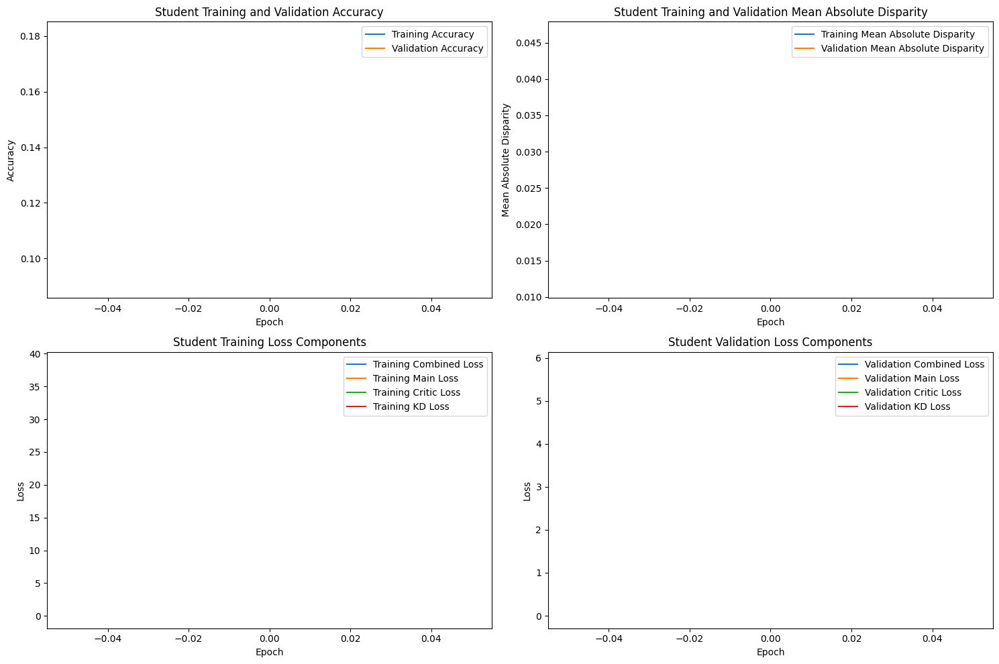

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.135513, VALIDATION Accuracy: 0.1224
TRAINING Disparity: 0.032141, VALIDATION Disparity: 0.0332
TRAINING Combined Loss: 7.008536, VALIDATION Combined Loss: 5.5811
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.031178840427395382
Class Celebration: Val Disparity = 0.008742672326662648
Class Parade: Val Disparity = -0.005780346820809248
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.003035622851291054
Class Surgeons: Val Disparity = -0.09090909090909091
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.0
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = -0.024539877300613494
Class Water_Activities: Val Disparity = 0.06931252826775217
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.01670886075949367
Class Cheering: Val Disparity = 0.0
Clas

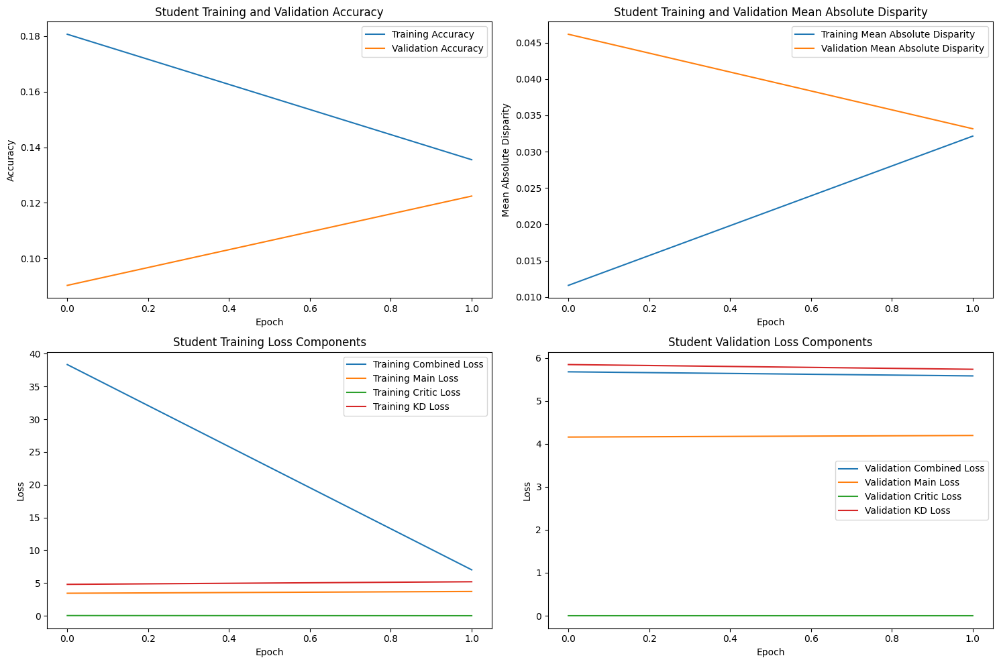

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 180 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.145216, VALIDATION Accuracy: 0.1707
TRAINING Disparity: 0.023443, VALIDATION Disparity: 0.0365
TRAINING Combined Loss: 4.699903, VALIDATION Combined Loss: 4.0327
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.03790506218251888
Class Celebration: Val Disparity = -0.07625833838690119
Class Parade: Val Disparity = 0.005663572137560566
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.015726720795845216
Class Surgeons: Val Disparity = 0.08573540280857356
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.0
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.054601226993865076
Class Water_Activities: Val Disparity = 0.004296698326549053
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = -0.010638297872340425
Class 

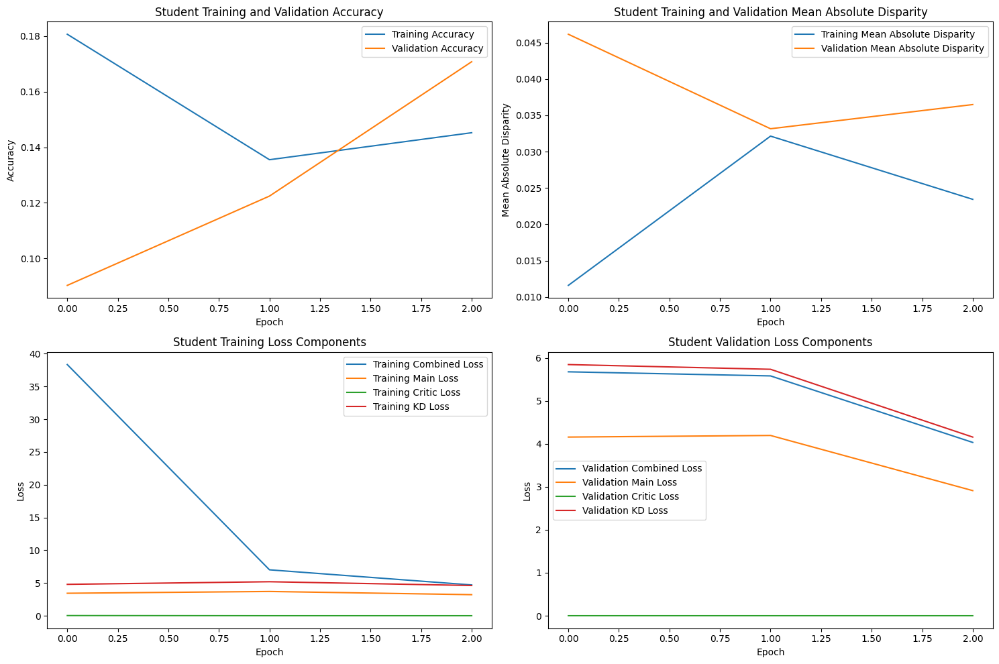

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 180 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.158777, VALIDATION Accuracy: 0.1767
TRAINING Disparity: 0.035706, VALIDATION Disparity: 0.0437
TRAINING Combined Loss: 4.384920, VALIDATION Combined Loss: 3.7836
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.034647048519880874
Class Celebration: Val Disparity = -0.0024257125530625645
Class Parade: Val Disparity = -0.03906113154668067
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.023443786116597178
Class Surgeons: Val Disparity = -0.06060606060606061
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.0
Class Business: Val Disparity = -0.01300085251491901
Class Dresses: Val Disparity = 0.0466257668711656
Class Water_Activities: Val Disparity = 0.10719131614654
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.00961538461

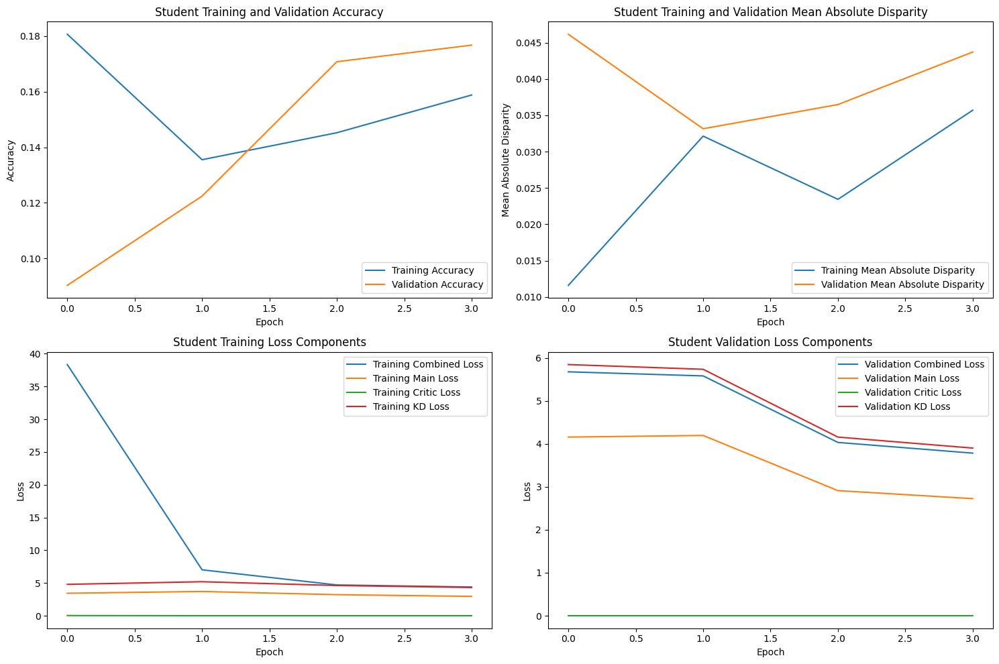

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 180 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.194001, VALIDATION Accuracy: 0.2156
TRAINING Disparity: 0.025190, VALIDATION Disparity: 0.0458
TRAINING Combined Loss: 3.784940, VALIDATION Combined Loss: 3.4170
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.01511064401237805
Class Celebration: Val Disparity = -0.0324944410753992
Class Parade: Val Disparity = 0.014304898697962282
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = -0.04023114622192965
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = -0.0022090454598302518
Class Business: Val Disparity = -0.03367433930093776
Class Dresses: Val Disparity = 0.11411042944785274
Class Water_Activities: Val Disparity = 0.0871777476255089
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Pe

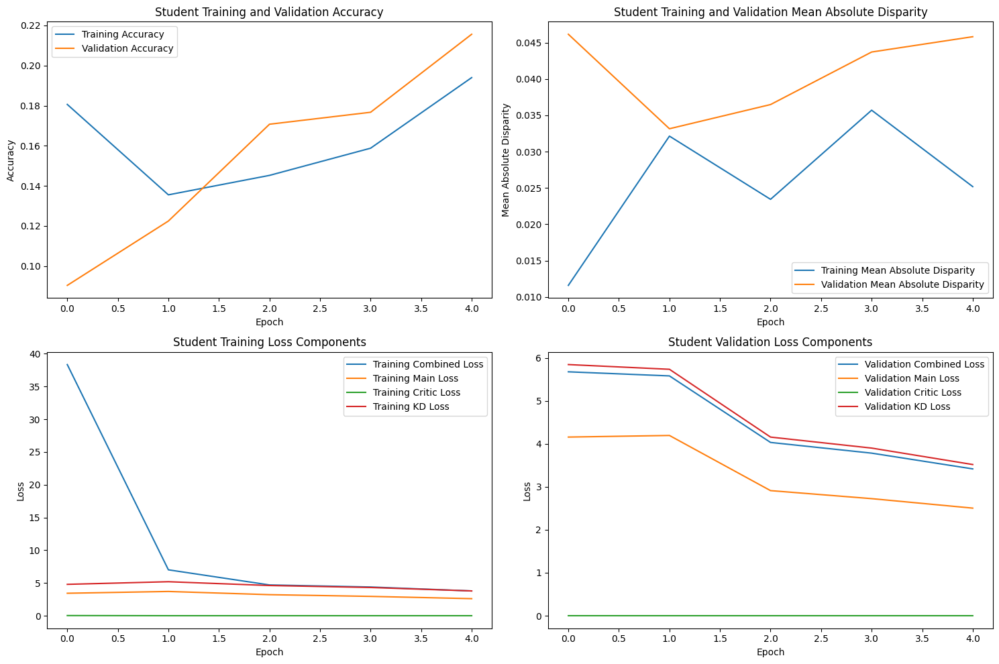

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.221451, VALIDATION Accuracy: 0.2352
TRAINING Disparity: 0.015881, VALIDATION Disparity: 0.0458
TRAINING Combined Loss: 3.568981, VALIDATION Combined Loss: 3.2902
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.016231680971565354
Class Celebration: Val Disparity = -0.030624620982413614
Class Parade: Val Disparity = -0.0002335493664973043
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.027905785970302105
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.08289733751889314
Class Business: Val Disparity = -0.021739130434782608
Class Dresses: Val Disparity = -0.010429447852760731
Class Water_Activities: Val Disparity = 0.12483039348710989
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Cl

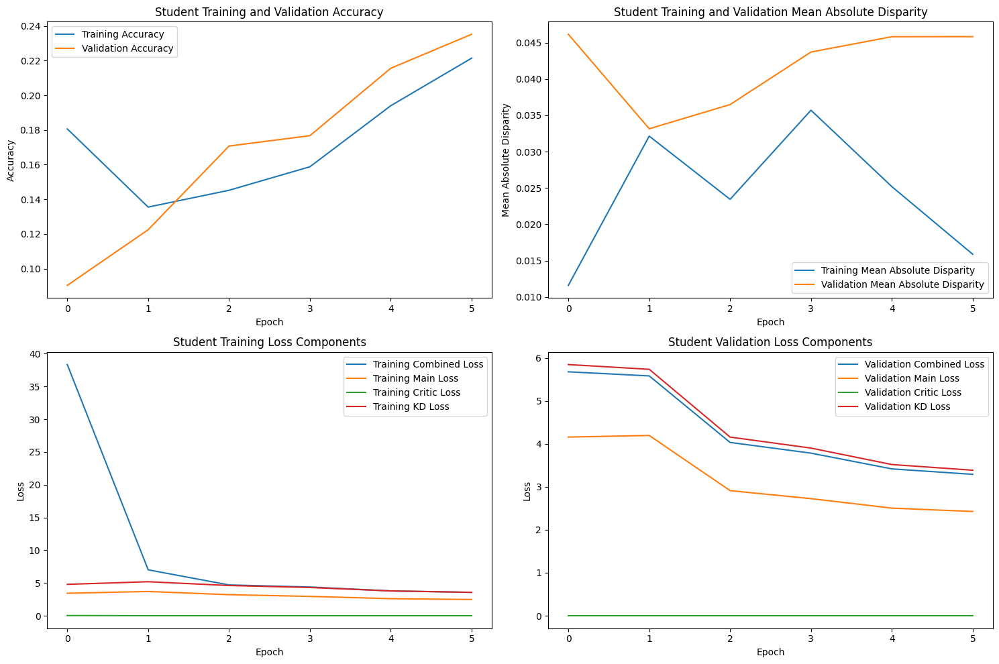

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 180 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.242785, VALIDATION Accuracy: 0.2452
TRAINING Disparity: 0.029065, VALIDATION Disparity: 0.0316
TRAINING Combined Loss: 3.455940, VALIDATION Combined Loss: 3.2096
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.000969229870964039
Class Celebration: Val Disparity = -0.002728926622195288
Class Parade: Val Disparity = 0.014071349331464866
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = -0.008485114475897892
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.08557144518079293
Class Business: Val Disparity = -0.021739130434782608
Class Dresses: Val Disparity = -0.014723926380368069
Class Water_Activities: Val Disparity = 0.11126187245590224
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Cla

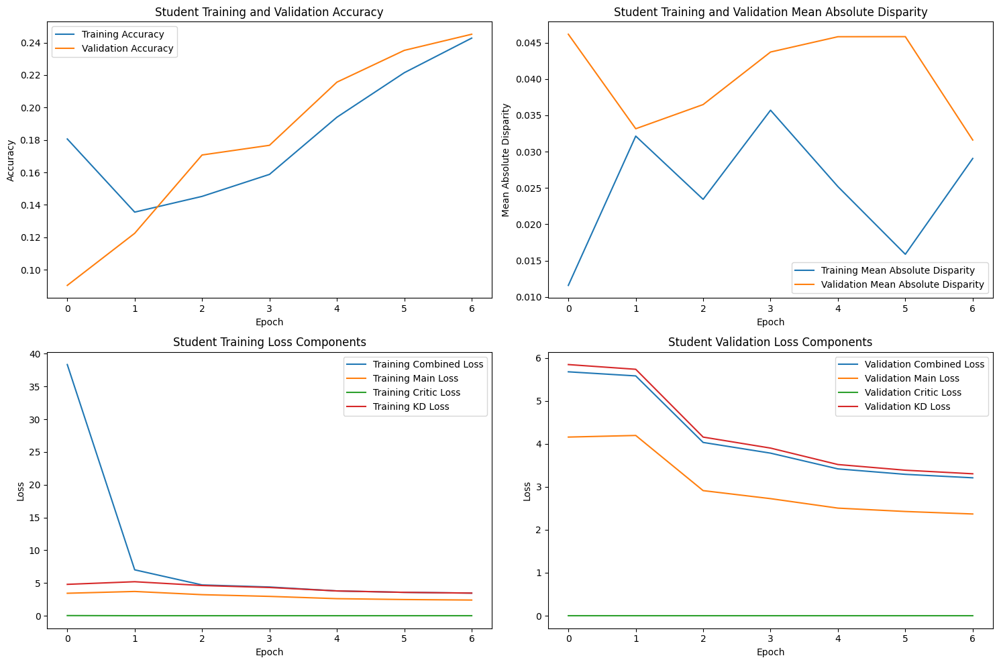

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 8 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.260880, VALIDATION Accuracy: 0.2616
TRAINING Disparity: 0.022260, VALIDATION Disparity: 0.0425
TRAINING Combined Loss: 3.379864, VALIDATION Combined Loss: 3.1413
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.014631867811058519
Class Celebration: Val Disparity = -0.01101677784515867
Class Parade: Val Disparity = 0.03281368599287671
Class Waiter_Or_Waitress: Val Disparity = -0.01020408163265306
Class Individual_Sports: Val Disparity = 0.009180016092458498
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.15649343099639576
Class Business: Val Disparity = -0.021739130434782605
Class Dresses: Val Disparity = 0.003680981595092031
Class Water_Activities: Val Disparity = 0.11194029850746262
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Dispa

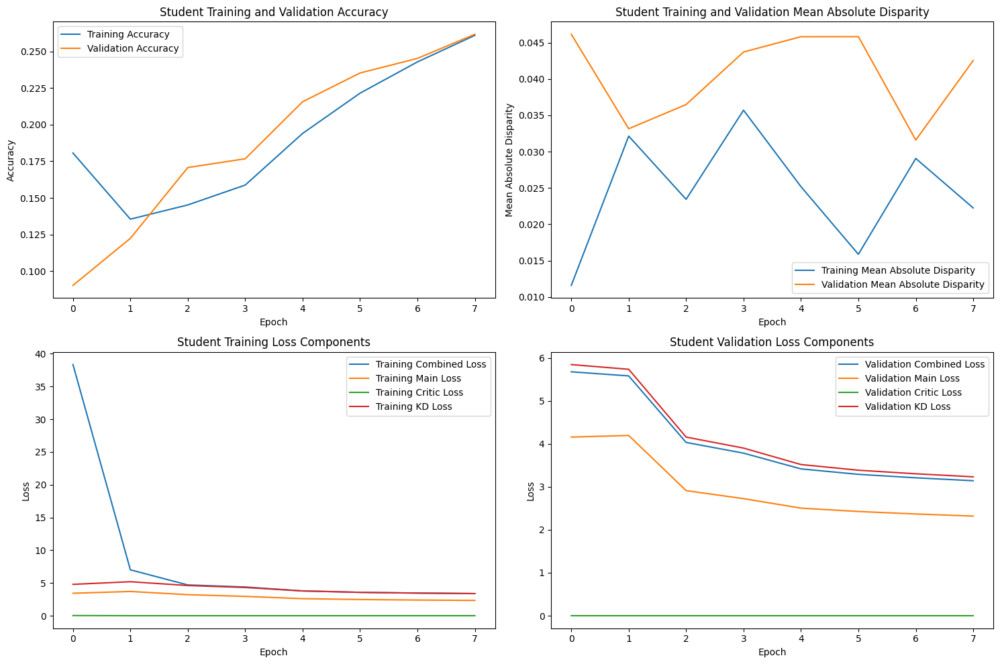

Epoch 9/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.81it/s]



STUDENT - Lambda 180 - Epoch 9 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.278106, VALIDATION Accuracy: 0.2744
TRAINING Disparity: 0.025739, VALIDATION Disparity: 0.0598
TRAINING Combined Loss: 3.311283, VALIDATION Combined Loss: 3.0813
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.014608512874408786
Class Celebration: Val Disparity = -0.0144026682838084
Class Parade: Val Disparity = 0.06737899223448357
Class Waiter_Or_Waitress: Val Disparity = -0.01020408163265306
Class Individual_Sports: Val Disparity = 0.0524833589349718
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.18265317986280666
Class Business: Val Disparity = -0.011935208866155157
Class Dresses: Val Disparity = -0.17607361963190188
Class Water_Activities: Val Disparity = 0.07496607869742211
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.02
Class Cheering: Val Dispari

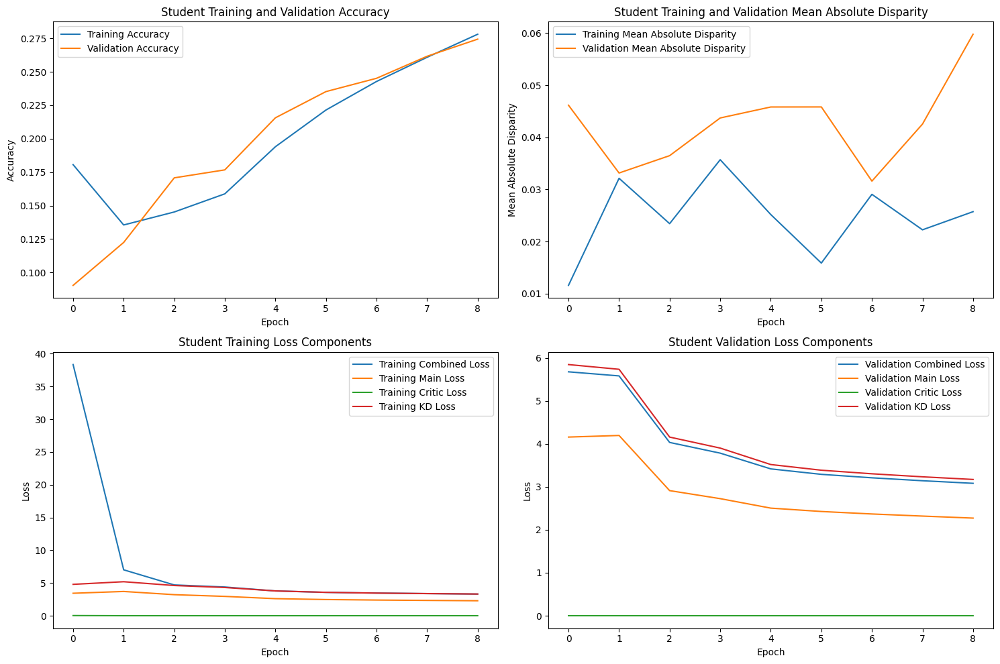

Epoch 10/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 180 - Epoch 10 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.289834, VALIDATION Accuracy: 0.2909
TRAINING Disparity: 0.041291, VALIDATION Disparity: 0.0869
TRAINING Combined Loss: 3.235898, VALIDATION Combined Loss: 3.0138
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07499270158229687
Class Celebration: Val Disparity = 0.03173640590256718
Class Parade: Val Disparity = 0.08898230863548784
Class Waiter_Or_Waitress: Val Disparity = 0.00784929356357928
Class Individual_Sports: Val Disparity = 0.07373271889400917
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.2039297756074875
Class Business: Val Disparity = -0.03260869565217391
Class Dresses: Val Disparity = -0.2699386503067485
Class Water_Activities: Val Disparity = 0.07564450474898243
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.02
Class Cheering: Val Disparity 

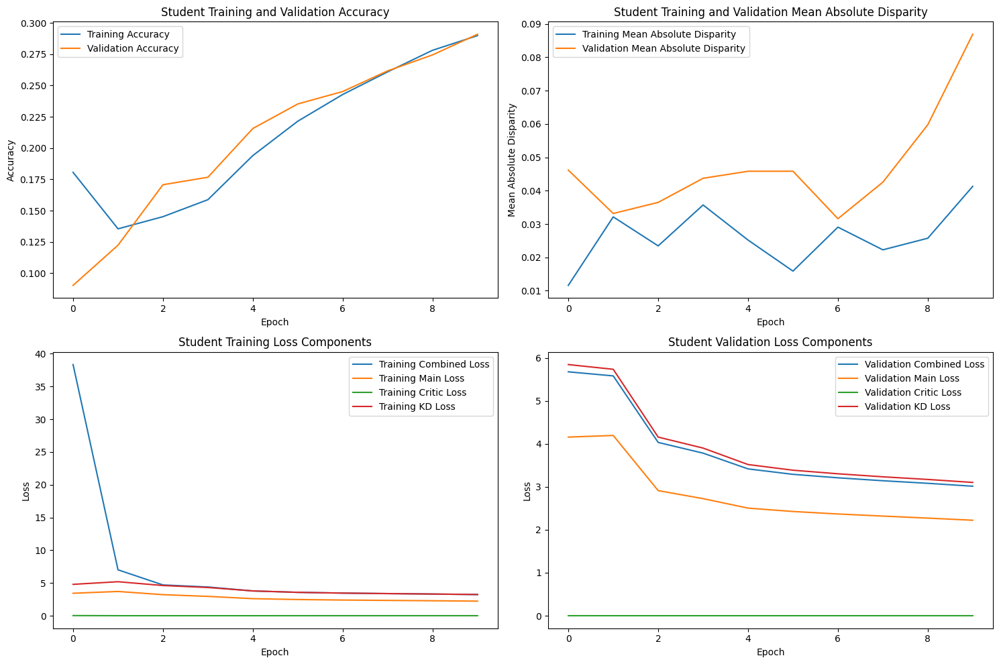

Epoch 11/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 11 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.306308, VALIDATION Accuracy: 0.3065
TRAINING Disparity: 0.037937, VALIDATION Disparity: 0.0835
TRAINING Combined Loss: 3.173388, VALIDATION Combined Loss: 2.9450
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06023238161966504
Class Celebration: Val Disparity = 0.022437841115827806
Class Parade: Val Disparity = 0.08174227827407021
Class Waiter_Or_Waitress: Val Disparity = -0.06593406593406594
Class Individual_Sports: Val Disparity = 0.08144978421476112
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.1618416463201953
Class Business: Val Disparity = -0.02387041773231032
Class Dresses: Val Disparity = -0.14539877300613502
Class Water_Activities: Val Disparity = 0.09102216191768431
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.02
Class Cheering: Val Dispari

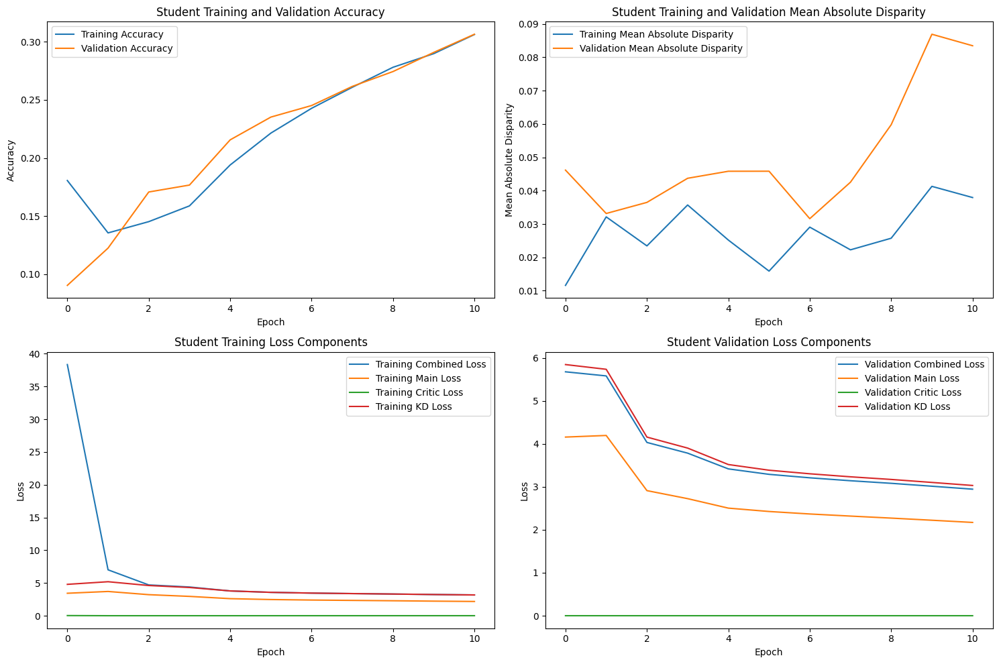

Epoch 12/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 180 - Epoch 12 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.327643, VALIDATION Accuracy: 0.3210
TRAINING Disparity: 0.036827, VALIDATION Disparity: 0.0819
TRAINING Combined Loss: 3.102826, VALIDATION Combined Loss: 2.8885
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06579085654230166
Class Celebration: Val Disparity = 0.018546593895290064
Class Parade: Val Disparity = 0.10328720733345015
Class Waiter_Or_Waitress: Val Disparity = -0.014913657770800642
Class Individual_Sports: Val Disparity = 0.11593884865774262
Class Surgeons: Val Disparity = -0.030303030303030304
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.16939890710382516
Class Business: Val Disparity = 0.0034100596760443247
Class Dresses: Val Disparity = -0.2699386503067485
Class Water_Activities: Val Disparity = 0.05359565807327005
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.02
Class C

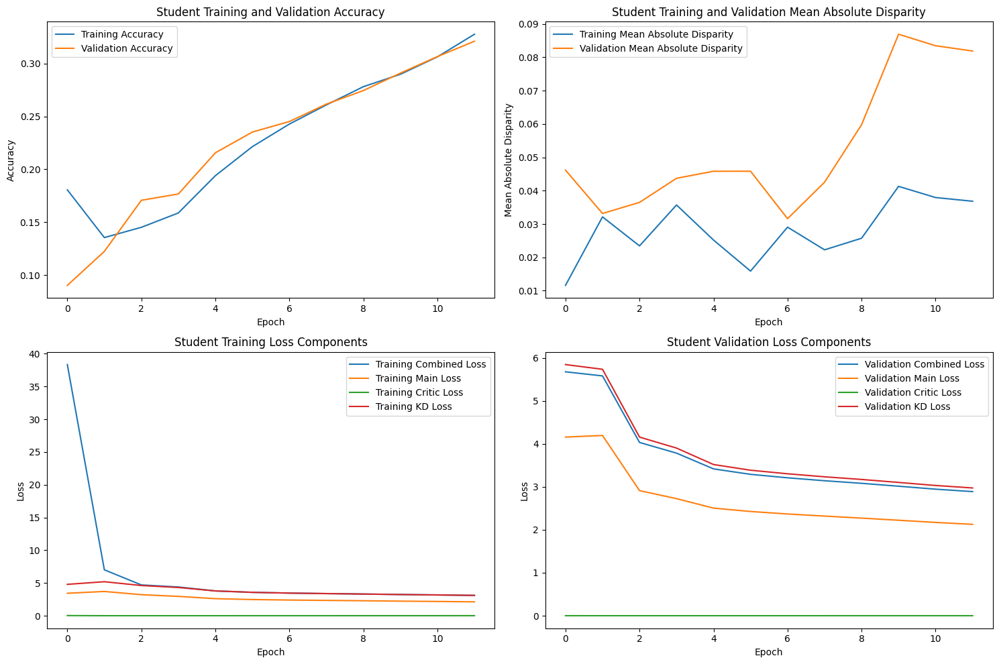

Epoch 13/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 180 - Epoch 13 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.342728, VALIDATION Accuracy: 0.3295
TRAINING Disparity: 0.040167, VALIDATION Disparity: 0.0985
TRAINING Combined Loss: 3.038513, VALIDATION Combined Loss: 2.8360
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.08655339522391547
Class Celebration: Val Disparity = 0.02107337780473012
Class Parade: Val Disparity = 0.13948735914053834
Class Waiter_Or_Waitress: Val Disparity = -0.014913657770800642
Class Individual_Sports: Val Disparity = 0.12449711067222591
Class Surgeons: Val Disparity = -0.030303030303030304
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.2114870363911173
Class Business: Val Disparity = -0.009590792838874679
Class Dresses: Val Disparity = -0.3128834355828221
Class Water_Activities: Val Disparity = 0.08344640434192685
Class Picnic: Val Disparity = 0.1111111111111111
Class Rescue: Val Disparity = 

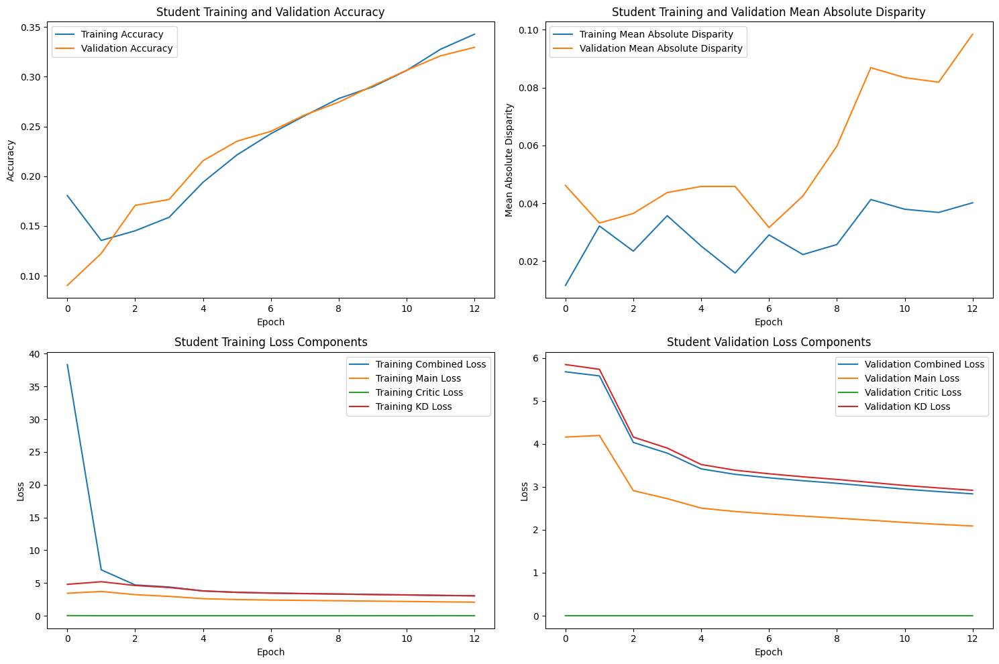

Epoch 14/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 180 - Epoch 14 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.364506, VALIDATION Accuracy: 0.3509
TRAINING Disparity: 0.039057, VALIDATION Disparity: 0.0979
TRAINING Combined Loss: 2.965747, VALIDATION Combined Loss: 2.7830
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05479068138027676
Class Celebration: Val Disparity = 0.042197291287648986
Class Parade: Val Disparity = 0.0961055643136568
Class Waiter_Or_Waitress: Val Disparity = -0.06828885400313972
Class Individual_Sports: Val Disparity = 0.02549191719698629
Class Surgeons: Val Disparity = -0.06060606060606061
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.158353679804674
Class Business: Val Disparity = 0.018755328218243814
Class Dresses: Val Disparity = -0.3171779141104295
Class Water_Activities: Val Disparity = 0.07632293080054275
Class Picnic: Val Disparity = 0.3137254901960784
Class Rescue: Val Disparity = -0.0

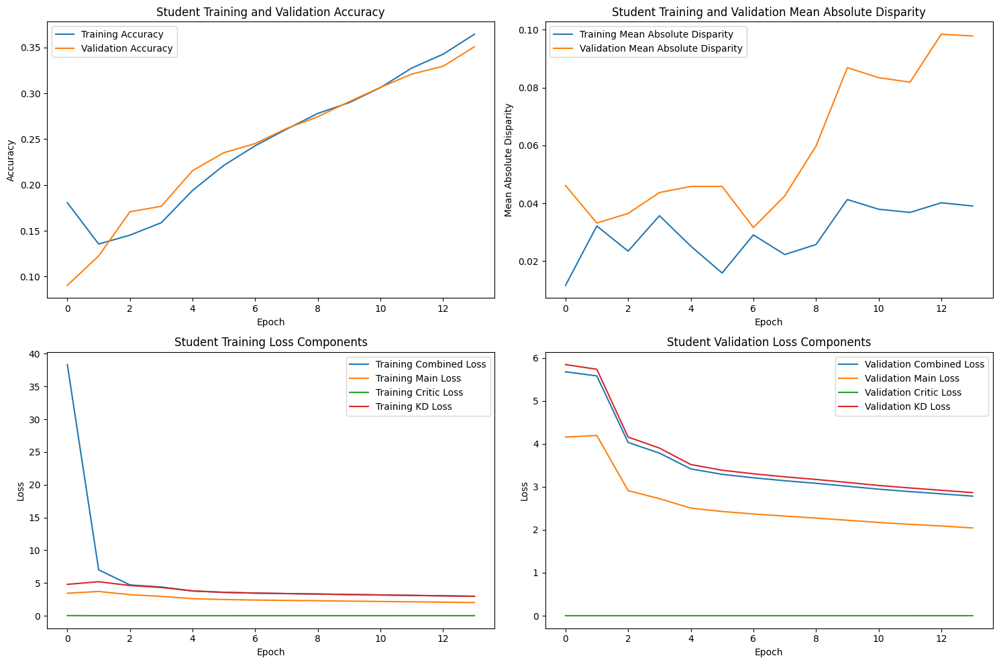

Epoch 15/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 180 - Epoch 15 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.374614, VALIDATION Accuracy: 0.3670
TRAINING Disparity: 0.050612, VALIDATION Disparity: 0.1103
TRAINING Combined Loss: 2.907433, VALIDATION Combined Loss: 2.7245
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06231097098149119
Class Celebration: Val Disparity = 0.037800687285223344
Class Parade: Val Disparity = 0.08022420739183739
Class Waiter_Or_Waitress: Val Disparity = -0.17817896389324955
Class Individual_Sports: Val Disparity = 0.04067003145344156
Class Surgeons: Val Disparity = -0.0665188470066519
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.23148471108010701
Class Business: Val Disparity = 0.02429667519181586
Class Dresses: Val Disparity = -0.21104294478527613
Class Water_Activities: Val Disparity = 0.08457711442786076
Class Picnic: Val Disparity = 0.2549019607843137
Class Rescue: Val Disparity = -0

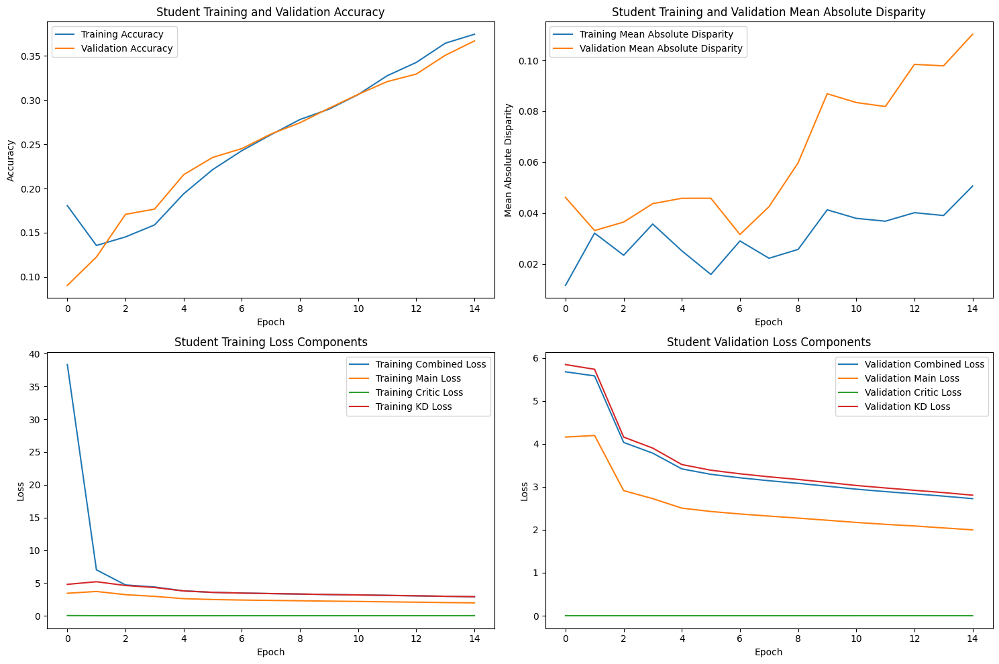

Epoch 16/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.75it/s]



STUDENT - Lambda 180 - Epoch 16 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.398380, VALIDATION Accuracy: 0.3821
TRAINING Disparity: 0.043617, VALIDATION Disparity: 0.1063
TRAINING Combined Loss: 2.838309, VALIDATION Combined Loss: 2.6708
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.03279033105622697
Class Celebration: Val Disparity = 0.004851425106124907
Class Parade: Val Disparity = 0.05278215682839954
Class Waiter_Or_Waitress: Val Disparity = -0.14992150706436425
Class Individual_Sports: Val Disparity = 0.03543998244459079
Class Surgeons: Val Disparity = -0.11456023651145601
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.28822229973258917
Class Business: Val Disparity = 0.030903665814151743
Class Dresses: Val Disparity = -0.31104294478527605
Class Water_Activities: Val Disparity = 0.08457711442786064
Class Picnic: Val Disparity = 0.19607843137254902
Class Rescue: Val Disparity =

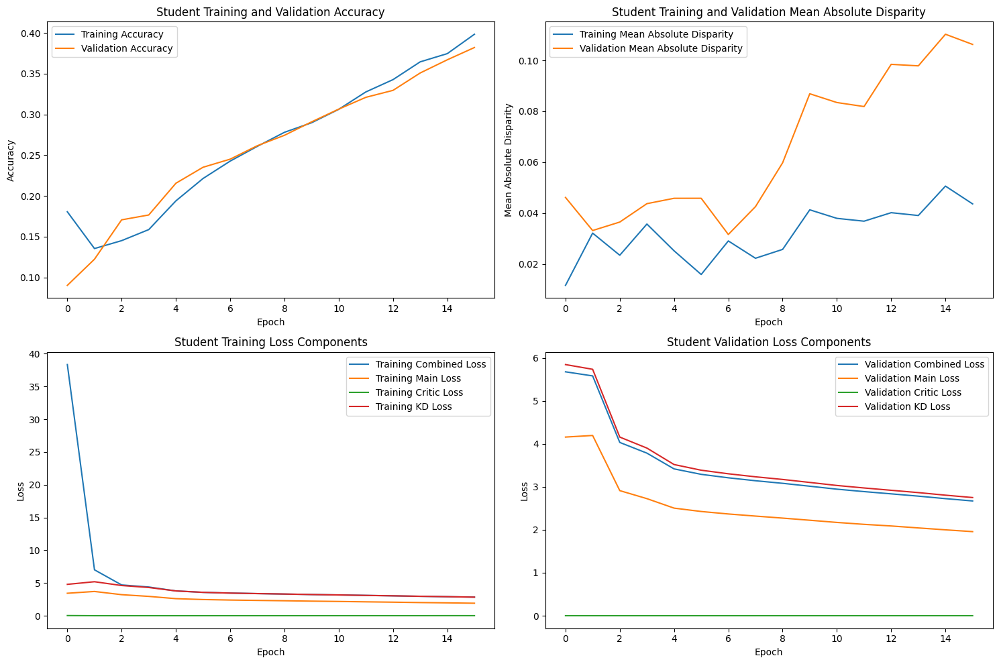

Epoch 17/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.74it/s]



STUDENT - Lambda 180 - Epoch 17 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.409394, VALIDATION Accuracy: 0.3932
TRAINING Disparity: 0.060749, VALIDATION Disparity: 0.1013
TRAINING Combined Loss: 2.771477, VALIDATION Combined Loss: 2.6099
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.04575232089682957
Class Celebration: Val Disparity = -0.0044471396806145536
Class Parade: Val Disparity = 0.06866351375021884
Class Waiter_Or_Waitress: Val Disparity = -0.16012558869701732
Class Individual_Sports: Val Disparity = 0.05087411308609463
Class Surgeons: Val Disparity = -0.09016999260901697
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.22264852924078604
Class Business: Val Disparity = 0.061381074168797956
Class Dresses: Val Disparity = -0.360122699386503
Class Water_Activities: Val Disparity = 0.06965174129353247
Class Picnic: Val Disparity = 0.1372549019607843
Class Rescue: Val Disparity = 

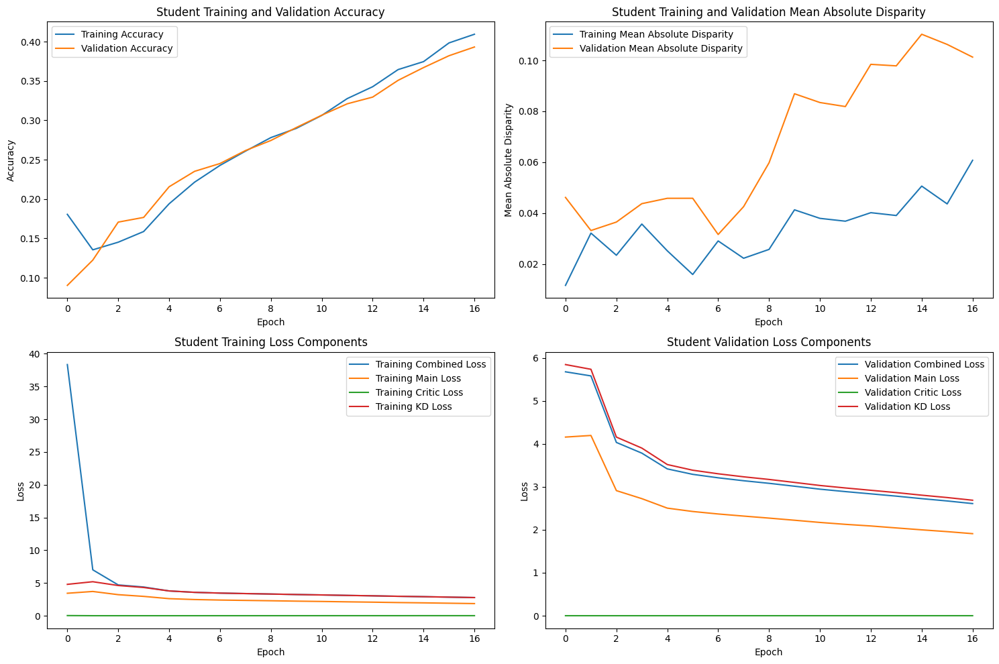

Epoch 18/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 180 - Epoch 18 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.432022, VALIDATION Accuracy: 0.4134
TRAINING Disparity: 0.060476, VALIDATION Disparity: 0.1144
TRAINING Combined Loss: 2.703595, VALIDATION Combined Loss: 2.5576
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.04351024697845507
Class Celebration: Val Disparity = -0.02794623003840707
Class Parade: Val Disparity = 0.10176913645121727
Class Waiter_Or_Waitress: Val Disparity = -0.27001569858712715
Class Individual_Sports: Val Disparity = 0.015031819179284645
Class Surgeons: Val Disparity = -0.10790835181079086
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.2581095221485874
Class Business: Val Disparity = 0.058184143222506396
Class Dresses: Val Disparity = -0.3355828220858895
Class Water_Activities: Val Disparity = 0.047150610583446384
Class Picnic: Val Disparity = 0.1372549019607843
Class Rescue: Val Disparity = 

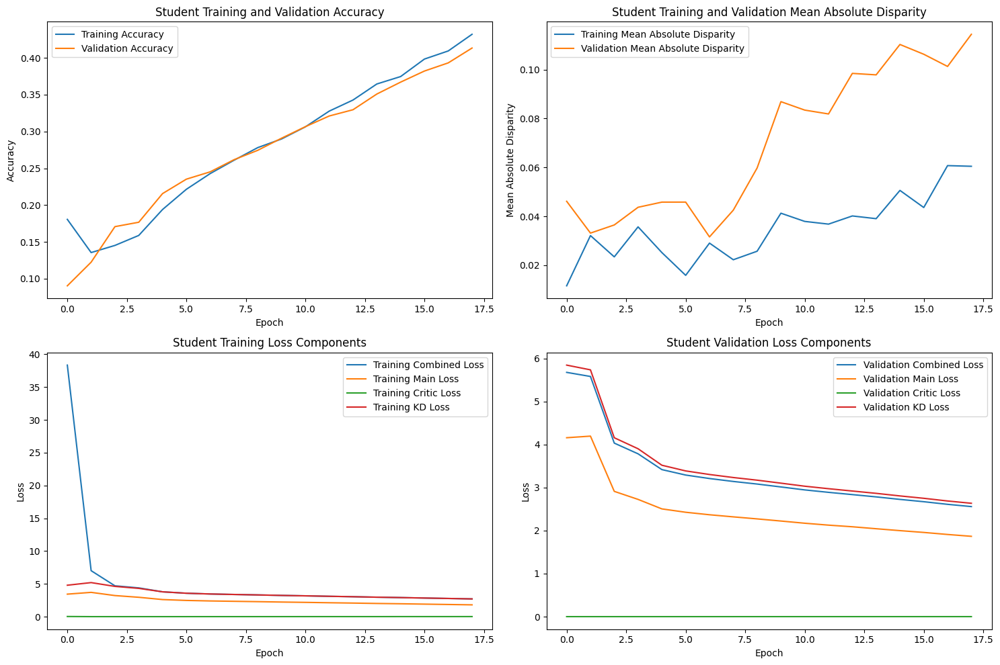

Epoch 19/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 19 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.455748, VALIDATION Accuracy: 0.4295
TRAINING Disparity: 0.060728, VALIDATION Disparity: 0.1172
TRAINING Combined Loss: 2.636402, VALIDATION Combined Loss: 2.5067
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.03043148245460381
Class Celebration: Val Disparity = 0.032898726500909636
Class Parade: Val Disparity = 0.11484790097506864
Class Waiter_Or_Waitress: Val Disparity = -0.2158555729984301
Class Individual_Sports: Val Disparity = 0.010898983249213678
Class Surgeons: Val Disparity = -0.004434589800443478
Class Spa: Val Disparity = -0.02127659574468085
Class Law_Enforcement: Val Disparity = 0.23950703406580637
Class Business: Val Disparity = 0.07672634271099743
Class Dresses: Val Disparity = -0.4460122699386504
Class Water_Activities: Val Disparity = 0.01684758028041622
Class Picnic: Val Disparity = 0.22875816993464052
Class Rescue:

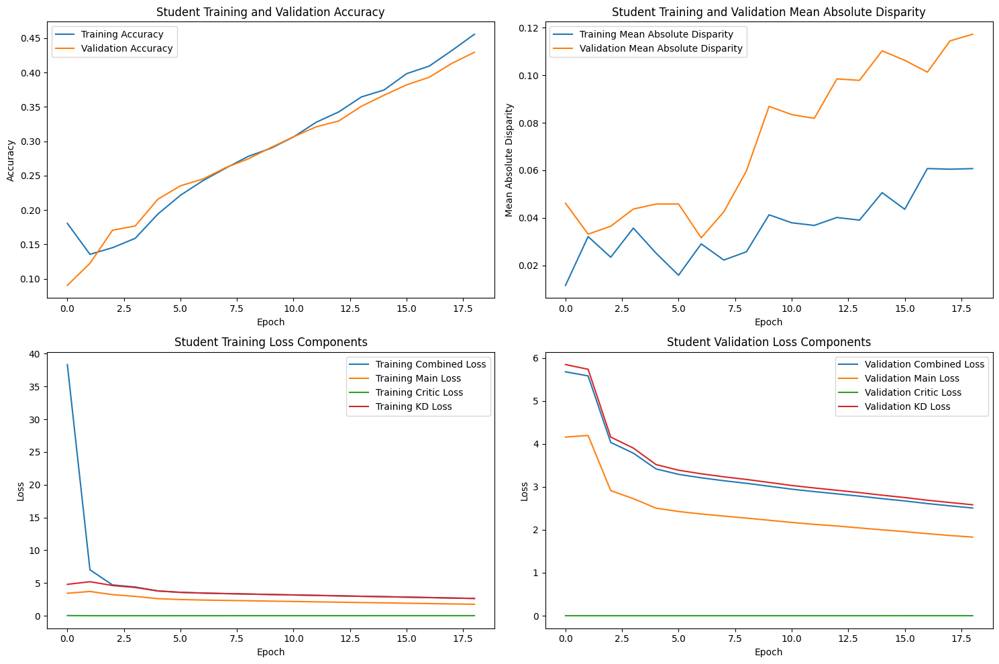

Epoch 20/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.74it/s]



STUDENT - Lambda 180 - Epoch 20 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.469232, VALIDATION Accuracy: 0.4415
TRAINING Disparity: 0.065957, VALIDATION Disparity: 0.1214
TRAINING Combined Loss: 2.557623, VALIDATION Combined Loss: 2.4454
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.0772931628422957
Class Celebration: Val Disparity = 0.002476248231251199
Class Parade: Val Disparity = 0.09166812635020727
Class Waiter_Or_Waitress: Val Disparity = -0.3076923076923077
Class Individual_Sports: Val Disparity = -0.025491917196986402
Class Surgeons: Val Disparity = -0.028824833702882524
Class Spa: Val Disparity = -0.0425531914893617
Class Law_Enforcement: Val Disparity = 0.2045111033600745
Class Business: Val Disparity = 0.09633418584825237
Class Dresses: Val Disparity = -0.48282208588957065
Class Water_Activities: Val Disparity = 0.05404794210764363
Class Picnic: Val Disparity = 0.16993464052287582
Class Rescue: 

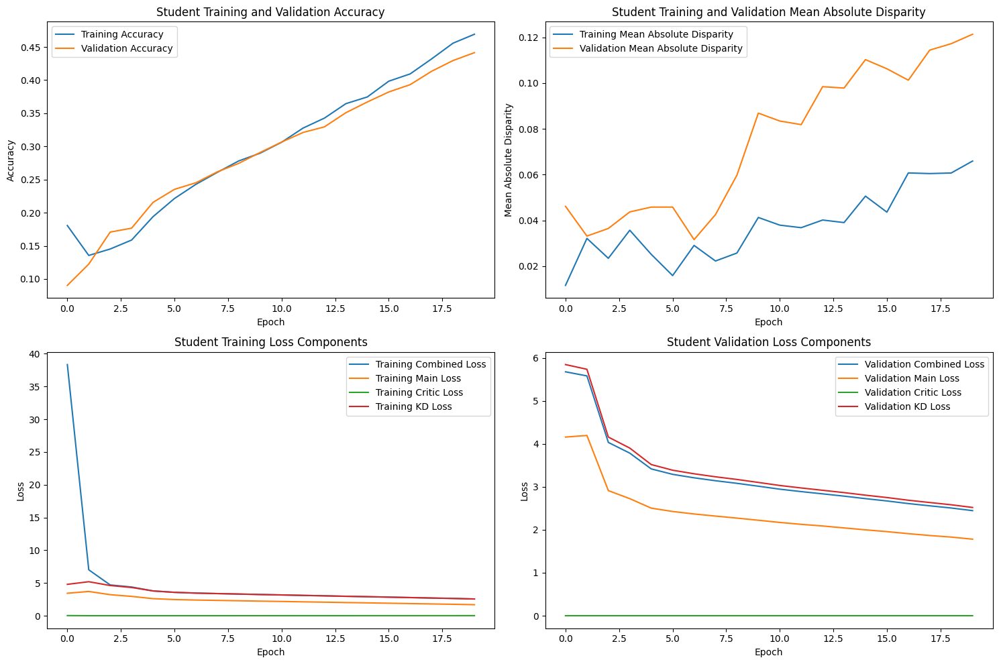

Epoch 21/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 180 - Epoch 21 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.484414, VALIDATION Accuracy: 0.4523
TRAINING Disparity: 0.068285, VALIDATION Disparity: 0.1140
TRAINING Combined Loss: 2.488953, VALIDATION Combined Loss: 2.4059
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06405091376189642
Class Celebration: Val Disparity = 0.01228016979987867
Class Parade: Val Disparity = 0.08869037192736617
Class Waiter_Or_Waitress: Val Disparity = -0.27158555729984296
Class Individual_Sports: Val Disparity = -0.04754590008046222
Class Surgeons: Val Disparity = -0.010347376201034764
Class Spa: Val Disparity = -0.0425531914893617
Class Law_Enforcement: Val Disparity = 0.22311359144285553
Class Business: Val Disparity = 0.09100596760443308
Class Dresses: Val Disparity = -0.47055214723926375
Class Water_Activities: Val Disparity = 0.031999095431931246
Class Picnic: Val Disparity = 0.15032679738562088
Class Rescue

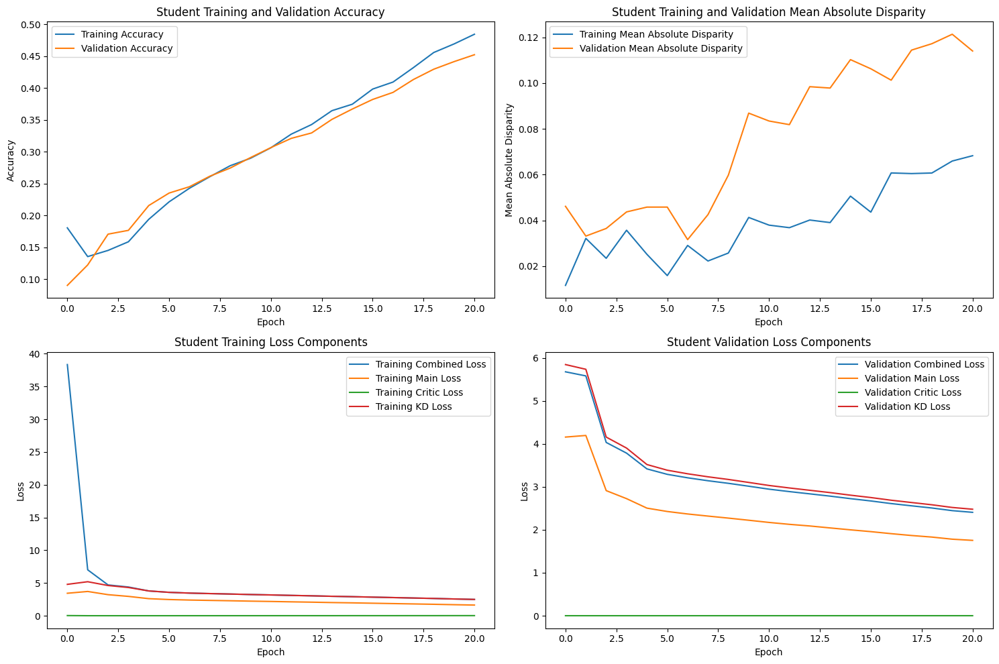

Epoch 22/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 22 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.508044, VALIDATION Accuracy: 0.4639
TRAINING Disparity: 0.075413, VALIDATION Disparity: 0.1104
TRAINING Combined Loss: 2.411816, VALIDATION Combined Loss: 2.3625
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.024931394873591417
Class Celebration: Val Disparity = 0.01516070345664039
Class Parade: Val Disparity = 0.01231972908273482
Class Waiter_Or_Waitress: Val Disparity = -0.23626373626373626
Class Individual_Sports: Val Disparity = -0.08009655475093269
Class Surgeons: Val Disparity = -0.04065040650406504
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.23508894314614587
Class Business: Val Disparity = 0.05306905370843995
Class Dresses: Val Disparity = -0.538036809815951
Class Water_Activities: Val Disparity = 0.002600633197648139
Class Picnic: Val Disparity = 0.16993464052287582
Class Rescue: Val Disparity = 

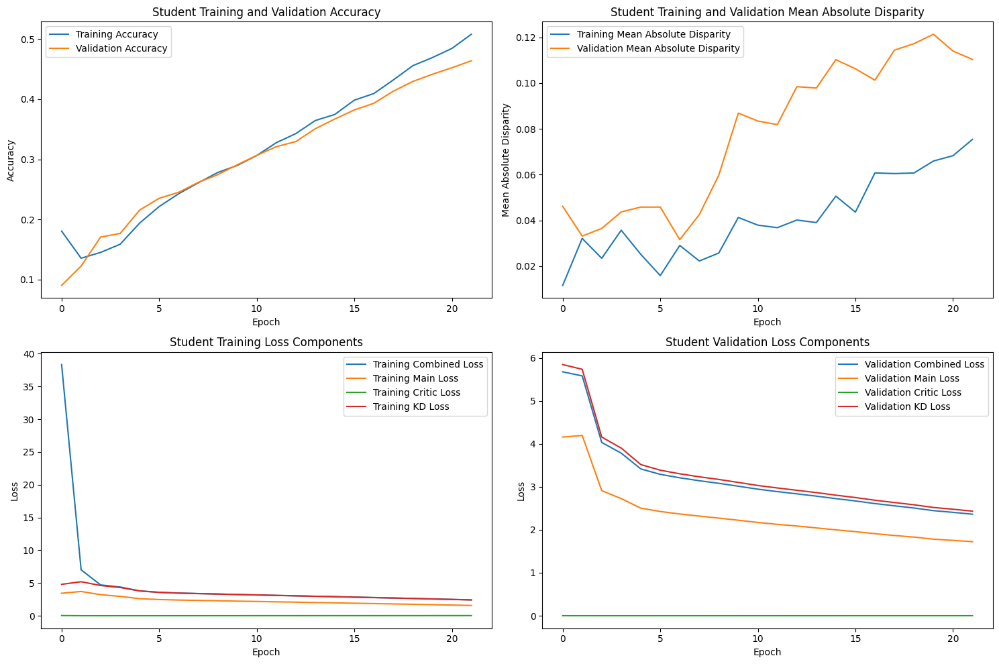

Epoch 23/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.85it/s]



STUDENT - Lambda 180 - Epoch 23 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.529186, VALIDATION Accuracy: 0.4699
TRAINING Disparity: 0.098071, VALIDATION Disparity: 0.1178
TRAINING Combined Loss: 2.332418, VALIDATION Combined Loss: 2.3221
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.014550125532784453
Class Celebration: Val Disparity = 0.019557307459066087
Class Parade: Val Disparity = 0.015122321480702916
Class Waiter_Or_Waitress: Val Disparity = -0.16169544740973302
Class Individual_Sports: Val Disparity = -0.07044107965766955
Class Surgeons: Val Disparity = -0.02217294900221728
Class Spa: Val Disparity = -0.0425531914893617
Class Law_Enforcement: Val Disparity = 0.24880827810719686
Class Business: Val Disparity = 0.03346121057118501
Class Dresses: Val Disparity = -0.5889570552147239
Class Water_Activities: Val Disparity = 0.02510176390773411
Class Picnic: Val Disparity = 0.26143790849673204
Class Rescue

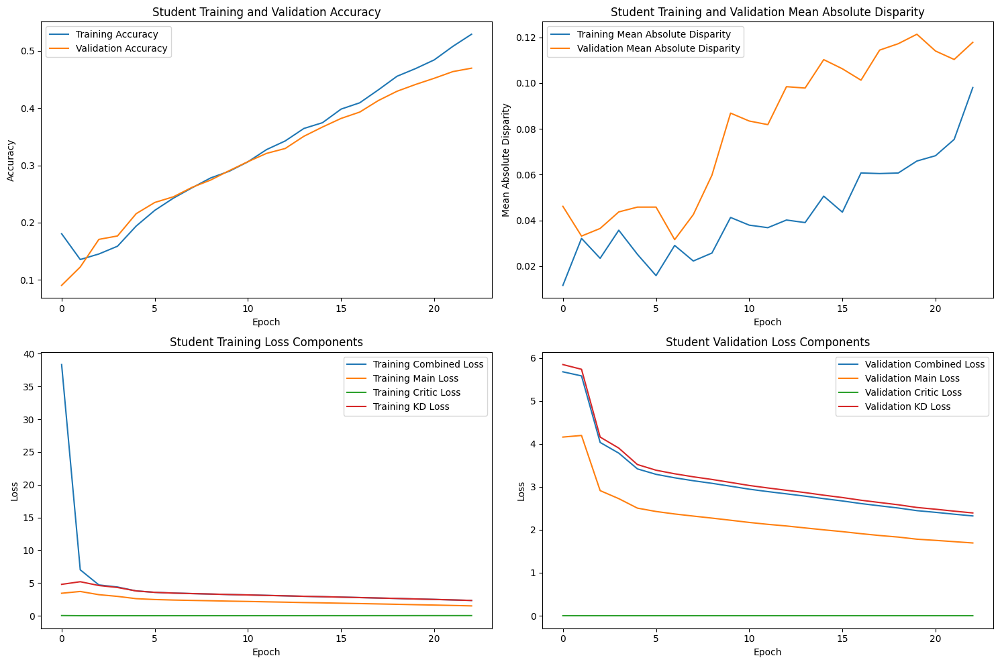

Epoch 24/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.81it/s]



STUDENT - Lambda 180 - Epoch 24 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.550058, VALIDATION Accuracy: 0.4827
TRAINING Disparity: 0.085720, VALIDATION Disparity: 0.1185
TRAINING Combined Loss: 2.257397, VALIDATION Combined Loss: 2.2867
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07263385298067382
Class Celebration: Val Disparity = -0.025065696381645408
Class Parade: Val Disparity = 0.06276639224616098
Class Waiter_Or_Waitress: Val Disparity = -0.23312401883830464
Class Individual_Sports: Val Disparity = -0.060236998025016475
Class Surgeons: Val Disparity = -0.02217294900221728
Class Spa: Val Disparity = -0.021276595744680847
Class Law_Enforcement: Val Disparity = 0.2590396465527264
Class Business: Val Disparity = 0.027919863597613004
Class Dresses: Val Disparity = -0.6177914110429448
Class Water_Activities: Val Disparity = -0.00497512437810943
Class Picnic: Val Disparity = 0.15032679738562088
Class Res

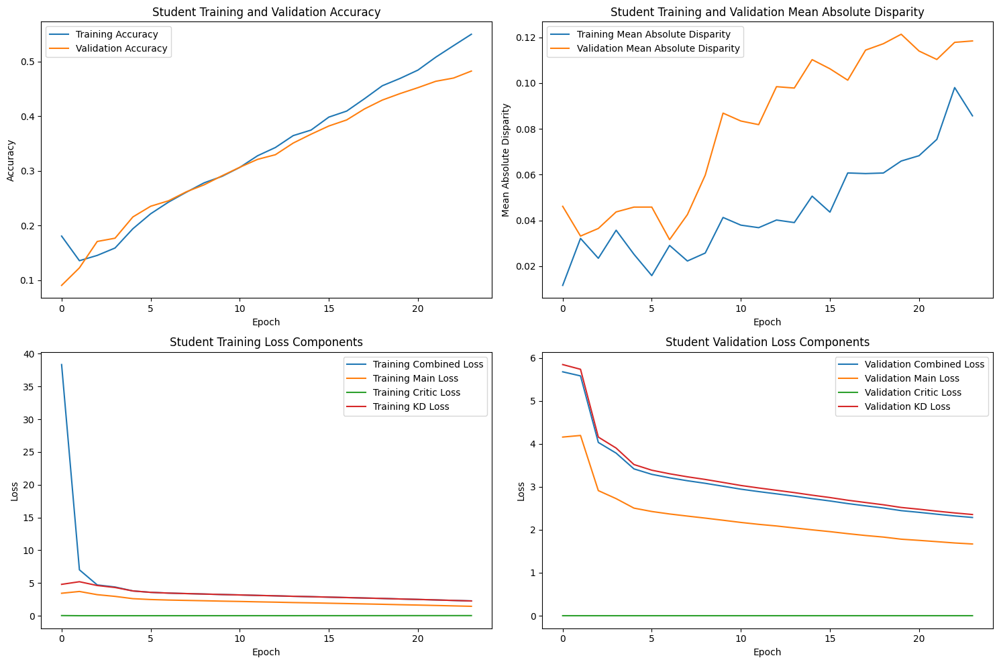

Epoch 25/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 180 - Epoch 25 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.567149, VALIDATION Accuracy: 0.4949
TRAINING Disparity: 0.108325, VALIDATION Disparity: 0.1209
TRAINING Combined Loss: 2.178350, VALIDATION Combined Loss: 2.2567
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.052992351258247306
Class Celebration: Val Disparity = -0.06124924196482717
Class Parade: Val Disparity = 0.044024055584749144
Class Waiter_Or_Waitress: Val Disparity = -0.2456828885400314
Class Individual_Sports: Val Disparity = -0.09304366908053541
Class Surgeons: Val Disparity = -0.028085735402808565
Class Spa: Val Disparity = -0.0425531914893617
Class Law_Enforcement: Val Disparity = 0.22799674456458546
Class Business: Val Disparity = 0.01598465473145788
Class Dresses: Val Disparity = -0.5503067484662576
Class Water_Activities: Val Disparity = 0.07010402532790583
Class Picnic: Val Disparity = 0.21568627450980388
Class Rescue

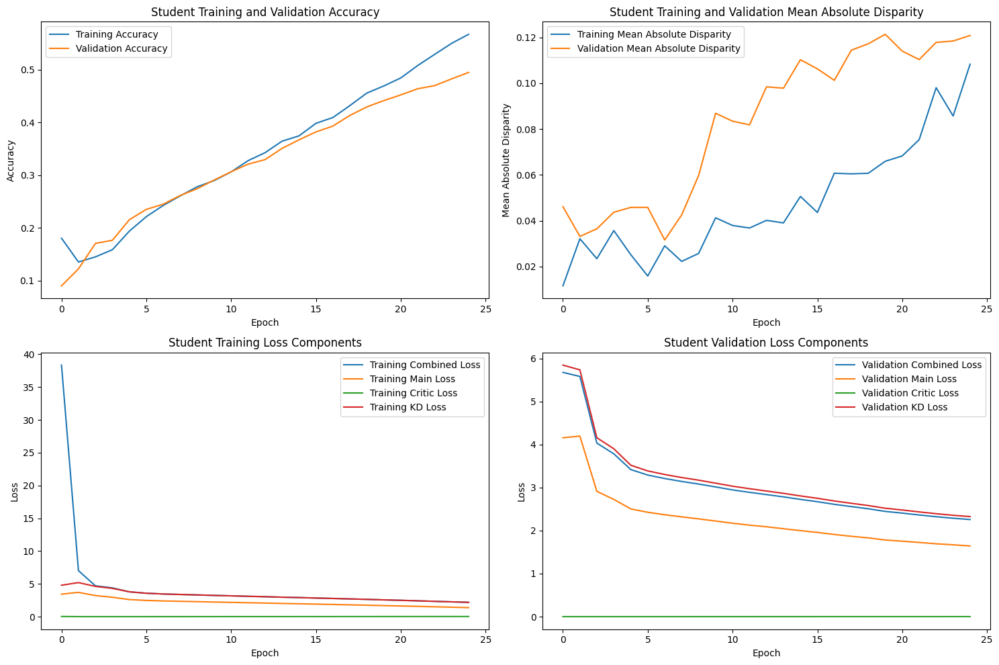

Epoch 26/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 26 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.591377, VALIDATION Accuracy: 0.4994
TRAINING Disparity: 0.080793, VALIDATION Disparity: 0.1235
TRAINING Combined Loss: 2.097248, VALIDATION Combined Loss: 2.2334
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.02723185613359025
Class Celebration: Val Disparity = -0.040276935516474655
Class Parade: Val Disparity = 0.06854673906697023
Class Waiter_Or_Waitress: Val Disparity = -0.2762951334379905
Class Individual_Sports: Val Disparity = -0.10573476702508966
Class Surgeons: Val Disparity = -0.05838876570583884
Class Spa: Val Disparity = -0.08510638297872339
Class Law_Enforcement: Val Disparity = 0.22578769910475527
Class Business: Val Disparity = 0.032395566922421126
Class Dresses: Val Disparity = -0.6257668711656443
Class Water_Activities: Val Disparity = 0.017752148349163277
Class Picnic: Val Disparity = -0.05882352941176472
Class Resc

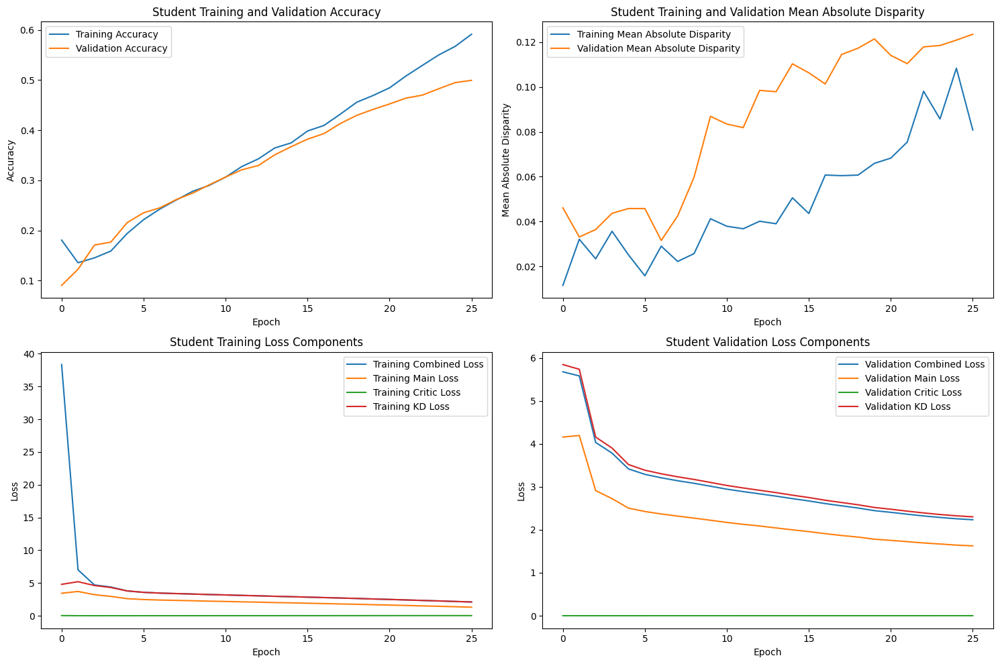

Epoch 27/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 27 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.618711, VALIDATION Accuracy: 0.5077
TRAINING Disparity: 0.099710, VALIDATION Disparity: 0.1191
TRAINING Combined Loss: 2.012067, VALIDATION Combined Loss: 2.2601
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.02723185613359025
Class Celebration: Val Disparity = -0.040276935516474655
Class Parade: Val Disparity = 0.06854673906697023
Class Waiter_Or_Waitress: Val Disparity = -0.2762951334379905
Class Individual_Sports: Val Disparity = -0.10573476702508966
Class Surgeons: Val Disparity = -0.05838876570583884
Class Spa: Val Disparity = -0.08510638297872339
Class Law_Enforcement: Val Disparity = 0.22578769910475527
Class Business: Val Disparity = 0.032395566922421126
Class Dresses: Val Disparity = -0.6257668711656443
Class Water_Activities: Val Disparity = 0.017752148349163277
Class Picnic: Val Disparity = -0.05882352941176472
Class Resc

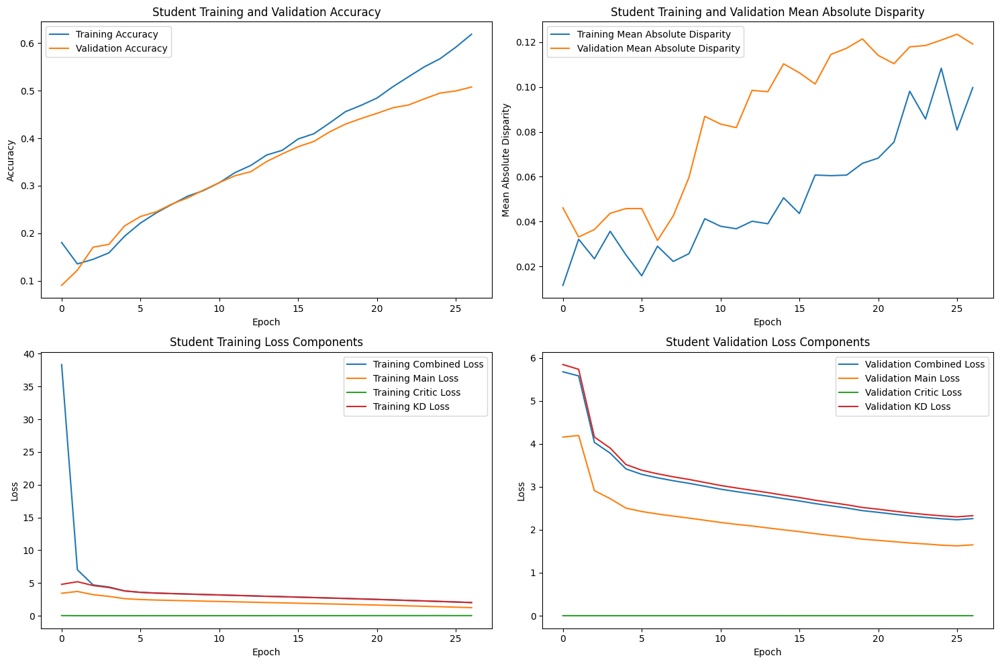

Epoch 28/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 180 - Epoch 28 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.639718, VALIDATION Accuracy: 0.5060
TRAINING Disparity: 0.102527, VALIDATION Disparity: 0.1294
TRAINING Combined Loss: 1.909195, VALIDATION Combined Loss: 2.2018
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.017189233374204527
Class Celebration: Val Disparity = 0.003992318576915288
Class Parade: Val Disparity = 0.08436970864716542
Class Waiter_Or_Waitress: Val Disparity = -0.2864992150706437
Class Individual_Sports: Val Disparity = -0.0500329163923634
Class Surgeons: Val Disparity = -0.03991130820399108
Class Spa: Val Disparity = 0.20567375886524822
Class Law_Enforcement: Val Disparity = 0.23997209626787586
Class Business: Val Disparity = 0.02046035805626606
Class Dresses: Val Disparity = -0.7055214723926381
Class Water_Activities: Val Disparity = 0.03267752148349168
Class Picnic: Val Disparity = 0.05882352941176472
Class Rescue: V

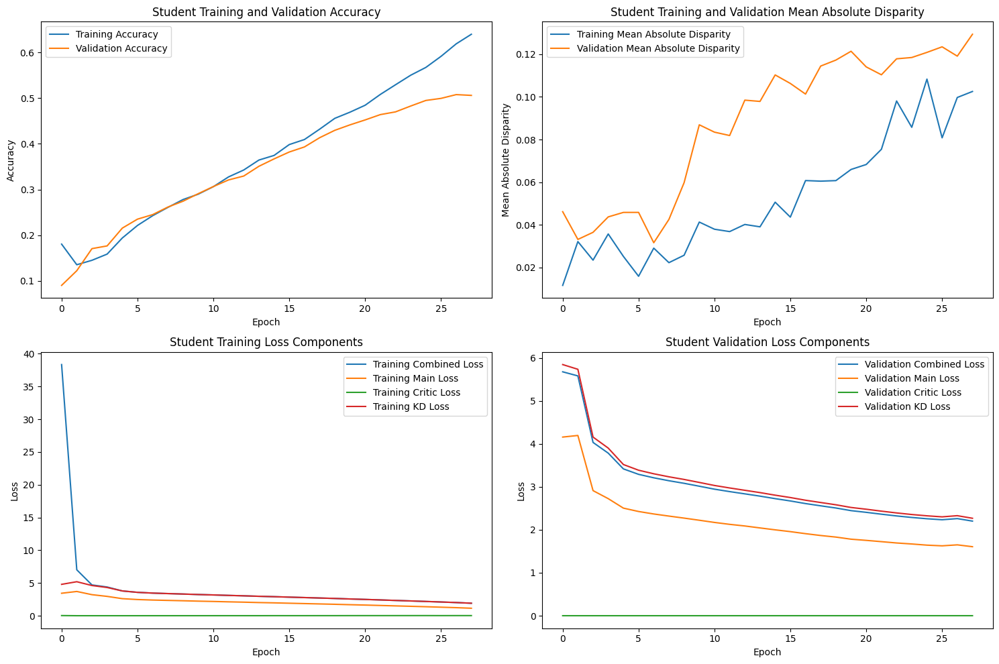

Epoch 29/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.81it/s]



STUDENT - Lambda 180 - Epoch 29 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.661960, VALIDATION Accuracy: 0.5136
TRAINING Disparity: 0.107248, VALIDATION Disparity: 0.1288
TRAINING Combined Loss: 1.830987, VALIDATION Combined Loss: 2.2050
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.017189233374204527
Class Celebration: Val Disparity = 0.003992318576915288
Class Parade: Val Disparity = 0.08436970864716542
Class Waiter_Or_Waitress: Val Disparity = -0.2864992150706437
Class Individual_Sports: Val Disparity = -0.0500329163923634
Class Surgeons: Val Disparity = -0.03991130820399108
Class Spa: Val Disparity = 0.20567375886524822
Class Law_Enforcement: Val Disparity = 0.23997209626787586
Class Business: Val Disparity = 0.02046035805626606
Class Dresses: Val Disparity = -0.7055214723926381
Class Water_Activities: Val Disparity = 0.03267752148349168
Class Picnic: Val Disparity = 0.05882352941176472
Class Rescue: V

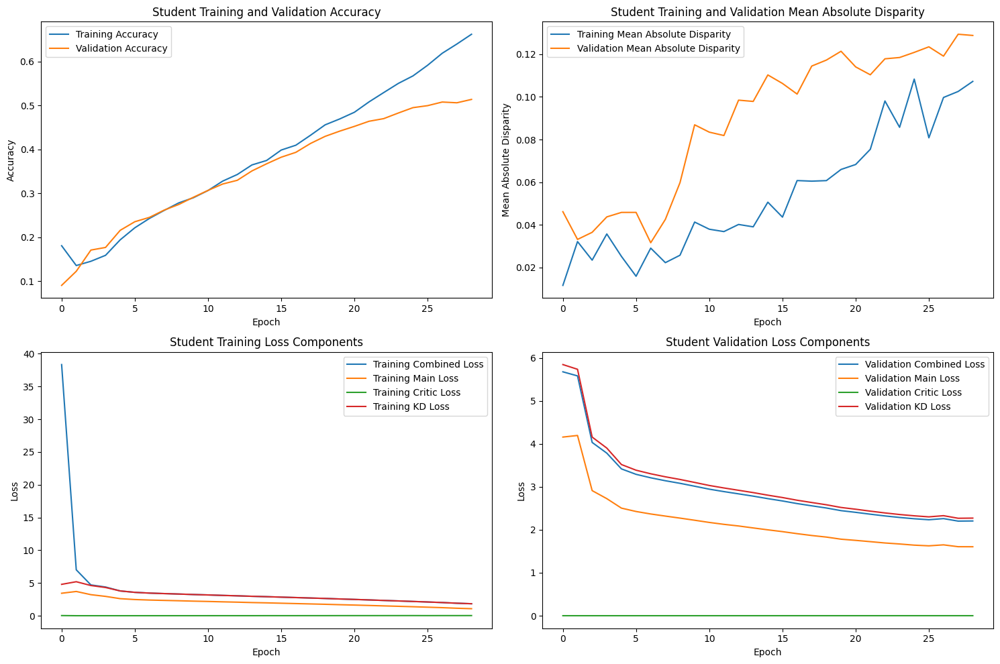

Epoch 30/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 180 - Epoch 30 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.688792, VALIDATION Accuracy: 0.5159
TRAINING Disparity: 0.123359, VALIDATION Disparity: 0.1255
TRAINING Combined Loss: 1.738137, VALIDATION Combined Loss: 2.2106
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.017189233374204527
Class Celebration: Val Disparity = 0.003992318576915288
Class Parade: Val Disparity = 0.08436970864716542
Class Waiter_Or_Waitress: Val Disparity = -0.2864992150706437
Class Individual_Sports: Val Disparity = -0.0500329163923634
Class Surgeons: Val Disparity = -0.03991130820399108
Class Spa: Val Disparity = 0.20567375886524822
Class Law_Enforcement: Val Disparity = 0.23997209626787586
Class Business: Val Disparity = 0.02046035805626606
Class Dresses: Val Disparity = -0.7055214723926381
Class Water_Activities: Val Disparity = 0.03267752148349168
Class Picnic: Val Disparity = 0.05882352941176472
Class Rescue: V

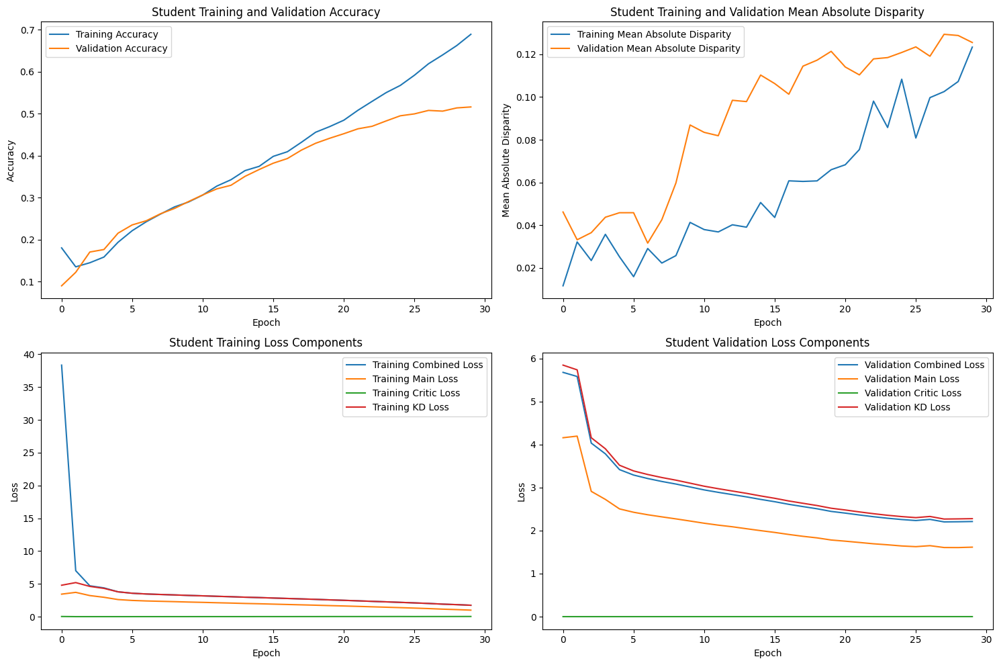

Epoch 31/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.73it/s]



STUDENT - Lambda 180 - Epoch 31 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.720042, VALIDATION Accuracy: 0.5261
TRAINING Disparity: 0.093731, VALIDATION Disparity: 0.1155
TRAINING Combined Loss: 1.644507, VALIDATION Combined Loss: 2.2154
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.017189233374204527
Class Celebration: Val Disparity = 0.003992318576915288
Class Parade: Val Disparity = 0.08436970864716542
Class Waiter_Or_Waitress: Val Disparity = -0.2864992150706437
Class Individual_Sports: Val Disparity = -0.0500329163923634
Class Surgeons: Val Disparity = -0.03991130820399108
Class Spa: Val Disparity = 0.20567375886524822
Class Law_Enforcement: Val Disparity = 0.23997209626787586
Class Business: Val Disparity = 0.02046035805626606
Class Dresses: Val Disparity = -0.7055214723926381
Class Water_Activities: Val Disparity = 0.03267752148349168
Class Picnic: Val Disparity = 0.05882352941176472
Class Rescue: V

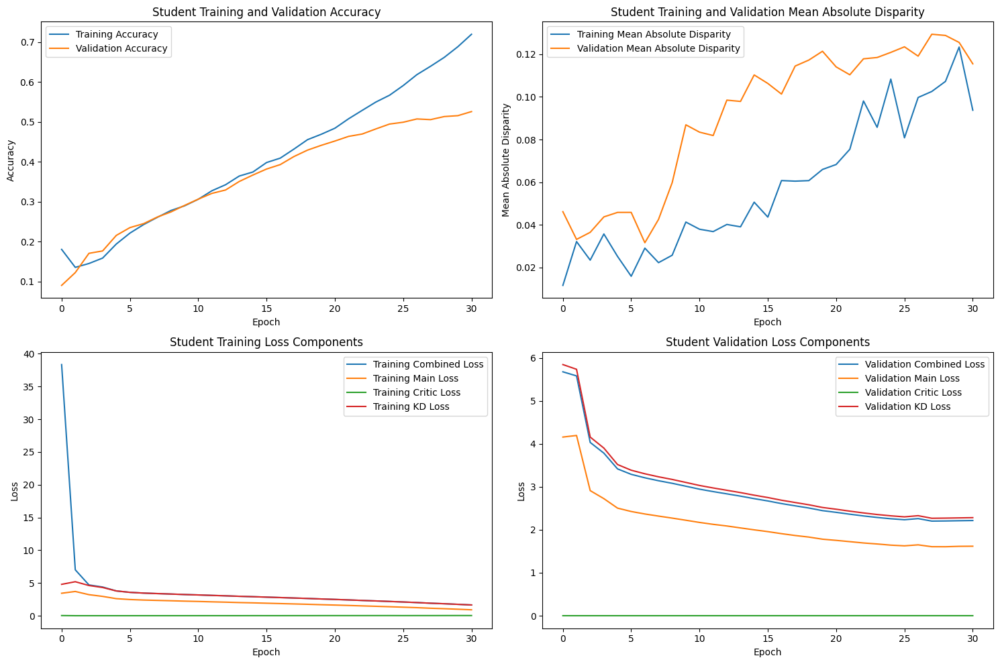

Epoch 32/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 32 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.750810, VALIDATION Accuracy: 0.5298
TRAINING Disparity: 0.092090, VALIDATION Disparity: 0.1258
TRAINING Combined Loss: 1.542555, VALIDATION Combined Loss: 2.2237
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.017189233374204527
Class Celebration: Val Disparity = 0.003992318576915288
Class Parade: Val Disparity = 0.08436970864716542
Class Waiter_Or_Waitress: Val Disparity = -0.2864992150706437
Class Individual_Sports: Val Disparity = -0.0500329163923634
Class Surgeons: Val Disparity = -0.03991130820399108
Class Spa: Val Disparity = 0.20567375886524822
Class Law_Enforcement: Val Disparity = 0.23997209626787586
Class Business: Val Disparity = 0.02046035805626606
Class Dresses: Val Disparity = -0.7055214723926381
Class Water_Activities: Val Disparity = 0.03267752148349168
Class Picnic: Val Disparity = 0.05882352941176472
Class Rescue: V

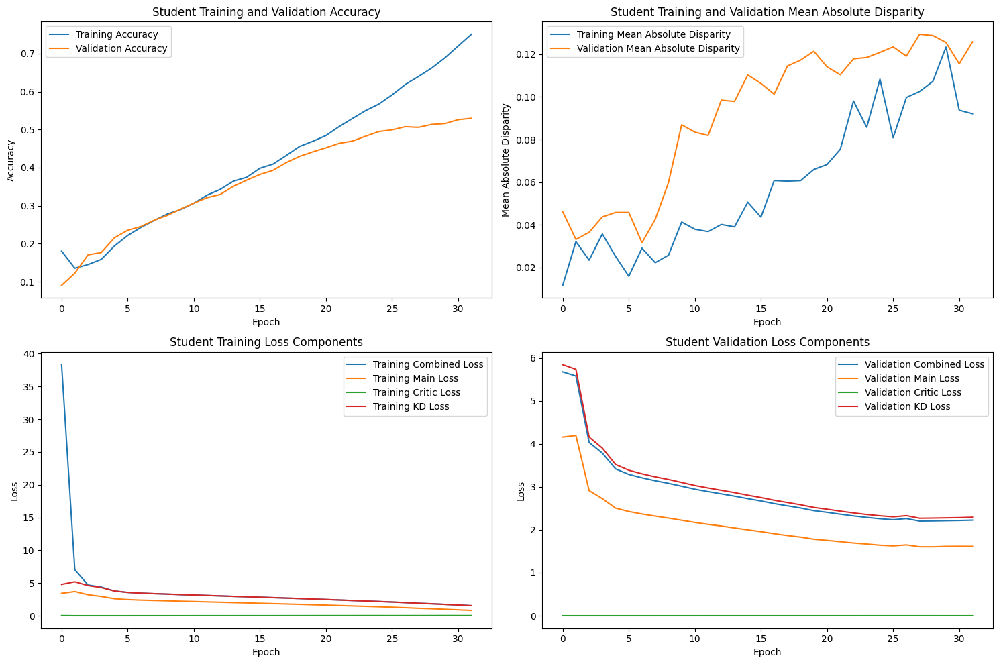

Epoch 33/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.72it/s]



STUDENT - Lambda 180 - Epoch 33 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.775135, VALIDATION Accuracy: 0.5244
TRAINING Disparity: 0.133341, VALIDATION Disparity: 0.1068
TRAINING Combined Loss: 1.470590, VALIDATION Combined Loss: 2.2215
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.017189233374204527
Class Celebration: Val Disparity = 0.003992318576915288
Class Parade: Val Disparity = 0.08436970864716542
Class Waiter_Or_Waitress: Val Disparity = -0.2864992150706437
Class Individual_Sports: Val Disparity = -0.0500329163923634
Class Surgeons: Val Disparity = -0.03991130820399108
Class Spa: Val Disparity = 0.20567375886524822
Class Law_Enforcement: Val Disparity = 0.23997209626787586
Class Business: Val Disparity = 0.02046035805626606
Class Dresses: Val Disparity = -0.7055214723926381
Class Water_Activities: Val Disparity = 0.03267752148349168
Class Picnic: Val Disparity = 0.05882352941176472
Class Rescue: V

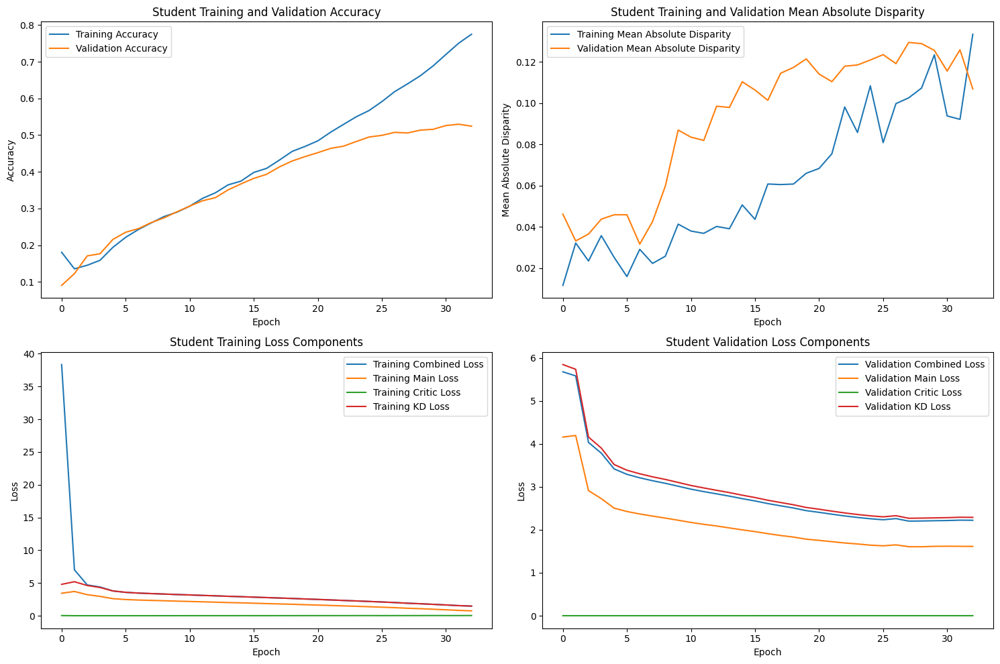

Epoch 34/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 34 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.806211, VALIDATION Accuracy: 0.5182
TRAINING Disparity: 0.082126, VALIDATION Disparity: 0.1227
TRAINING Combined Loss: 1.373044, VALIDATION Combined Loss: 2.3181
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.017189233374204527
Class Celebration: Val Disparity = 0.003992318576915288
Class Parade: Val Disparity = 0.08436970864716542
Class Waiter_Or_Waitress: Val Disparity = -0.2864992150706437
Class Individual_Sports: Val Disparity = -0.0500329163923634
Class Surgeons: Val Disparity = -0.03991130820399108
Class Spa: Val Disparity = 0.20567375886524822
Class Law_Enforcement: Val Disparity = 0.23997209626787586
Class Business: Val Disparity = 0.02046035805626606
Class Dresses: Val Disparity = -0.7055214723926381
Class Water_Activities: Val Disparity = 0.03267752148349168
Class Picnic: Val Disparity = 0.05882352941176472
Class Rescue: V

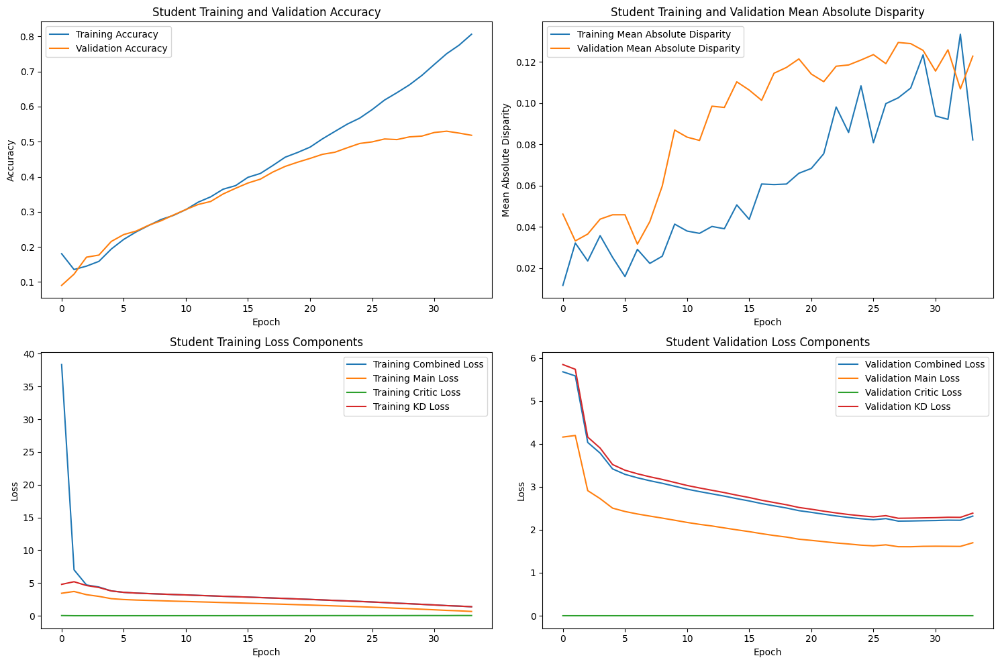

Epoch 35/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 35 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.828839, VALIDATION Accuracy: 0.5253
TRAINING Disparity: 0.068884, VALIDATION Disparity: 0.1352
TRAINING Combined Loss: 1.292737, VALIDATION Combined Loss: 2.2919
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.017189233374204527
Class Celebration: Val Disparity = 0.003992318576915288
Class Parade: Val Disparity = 0.08436970864716542
Class Waiter_Or_Waitress: Val Disparity = -0.2864992150706437
Class Individual_Sports: Val Disparity = -0.0500329163923634
Class Surgeons: Val Disparity = -0.03991130820399108
Class Spa: Val Disparity = 0.20567375886524822
Class Law_Enforcement: Val Disparity = 0.23997209626787586
Class Business: Val Disparity = 0.02046035805626606
Class Dresses: Val Disparity = -0.7055214723926381
Class Water_Activities: Val Disparity = 0.03267752148349168
Class Picnic: Val Disparity = 0.05882352941176472
Class Rescue: V

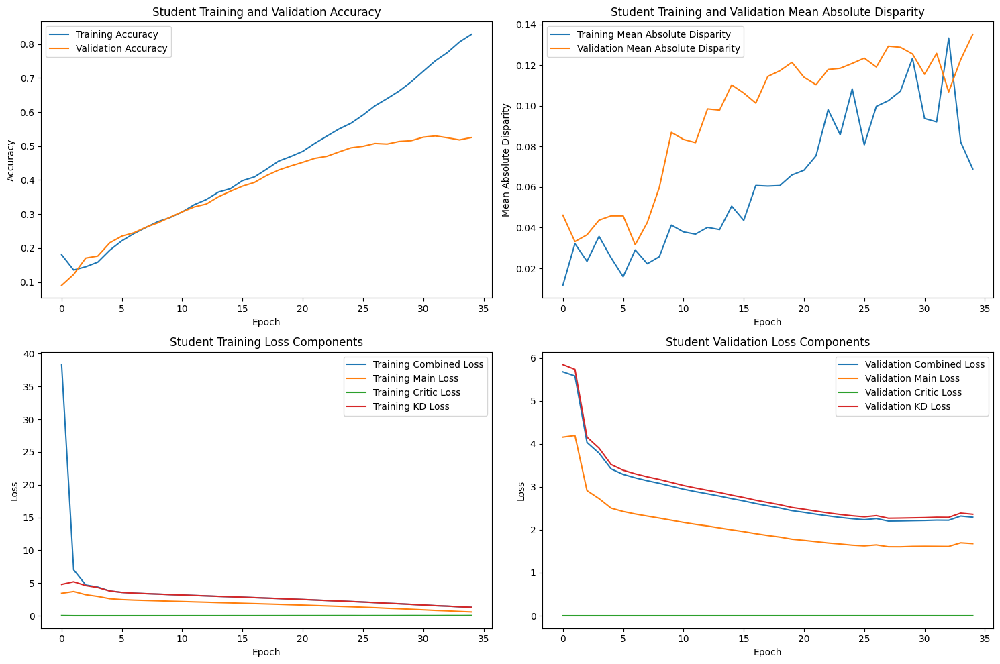

Epoch 36/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 36 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.878993, VALIDATION Accuracy: 0.5372
TRAINING Disparity: 0.060576, VALIDATION Disparity: 0.1210
TRAINING Combined Loss: 1.139513, VALIDATION Combined Loss: 2.2203
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.017189233374204527
Class Celebration: Val Disparity = 0.003992318576915288
Class Parade: Val Disparity = 0.08436970864716542
Class Waiter_Or_Waitress: Val Disparity = -0.2864992150706437
Class Individual_Sports: Val Disparity = -0.0500329163923634
Class Surgeons: Val Disparity = -0.03991130820399108
Class Spa: Val Disparity = 0.20567375886524822
Class Law_Enforcement: Val Disparity = 0.23997209626787586
Class Business: Val Disparity = 0.02046035805626606
Class Dresses: Val Disparity = -0.7055214723926381
Class Water_Activities: Val Disparity = 0.03267752148349168
Class Picnic: Val Disparity = 0.05882352941176472
Class Rescue: V

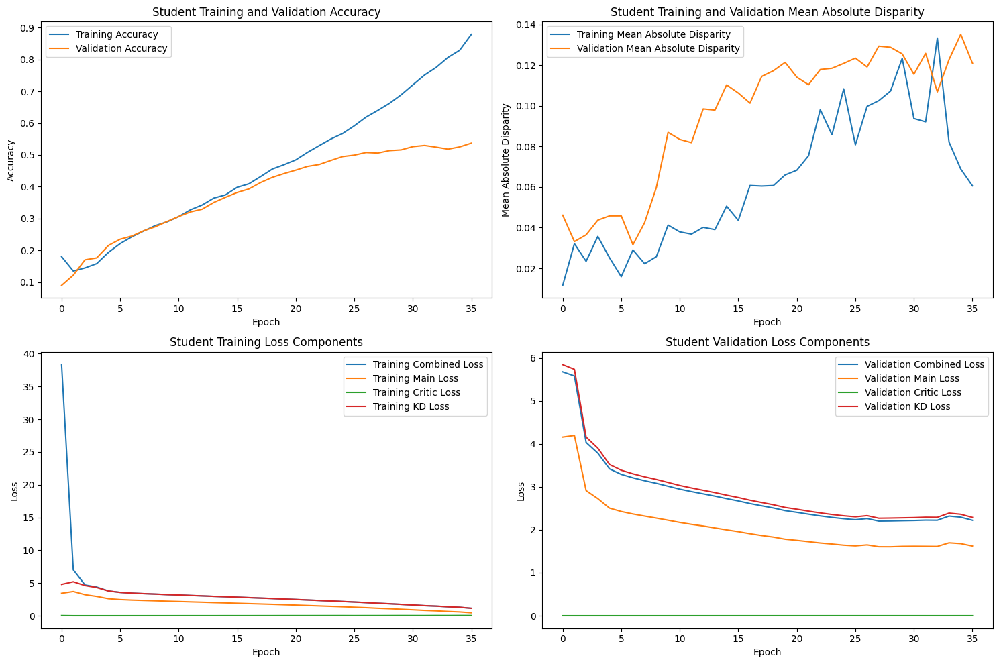

Epoch 37/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 180 - Epoch 37 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.890934, VALIDATION Accuracy: 0.5324
TRAINING Disparity: 0.057171, VALIDATION Disparity: 0.1165
TRAINING Combined Loss: 1.101437, VALIDATION Combined Loss: 2.2736
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.017189233374204527
Class Celebration: Val Disparity = 0.003992318576915288
Class Parade: Val Disparity = 0.08436970864716542
Class Waiter_Or_Waitress: Val Disparity = -0.2864992150706437
Class Individual_Sports: Val Disparity = -0.0500329163923634
Class Surgeons: Val Disparity = -0.03991130820399108
Class Spa: Val Disparity = 0.20567375886524822
Class Law_Enforcement: Val Disparity = 0.23997209626787586
Class Business: Val Disparity = 0.02046035805626606
Class Dresses: Val Disparity = -0.7055214723926381
Class Water_Activities: Val Disparity = 0.03267752148349168
Class Picnic: Val Disparity = 0.05882352941176472
Class Rescue: V

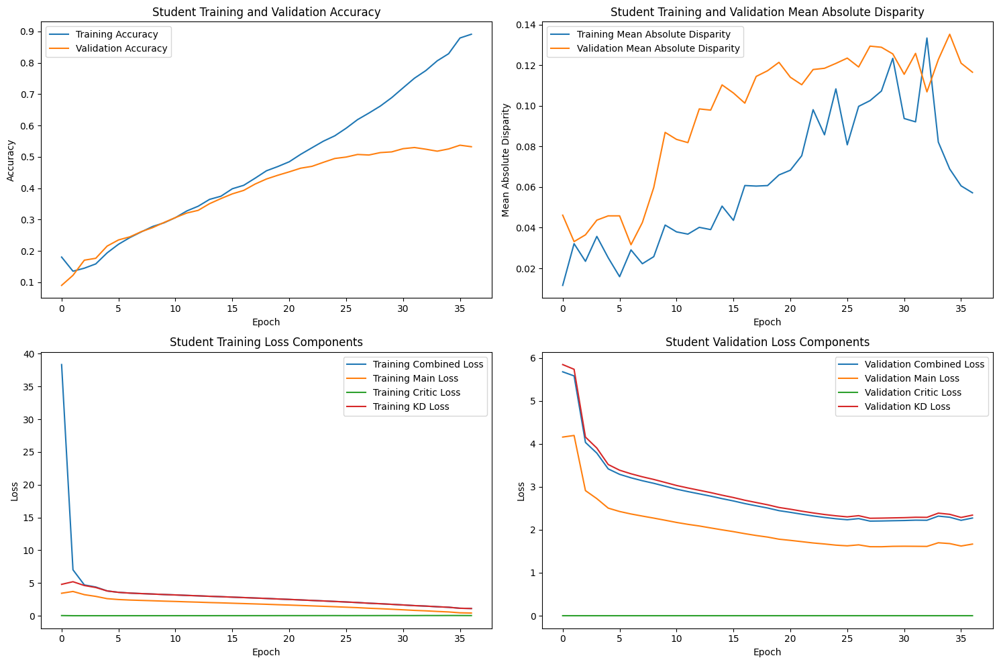

Epoch 38/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]


Early stopping triggered at epoch 38
Finished Training STUDENT with lambda value of 180. Best epoch number: 28
Training Student with Lambda Value of 160


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.71it/s]



STUDENT - Lambda 160 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.099672, VALIDATION Accuracy: 0.1034
TRAINING Disparity: 0.022940, VALIDATION Disparity: 0.0573
TRAINING Combined Loss: 29.049513, VALIDATION Combined Loss: 11.6095
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.0260757867694284
Class Celebration: Val Disparity = 0.0010107135637760258
Class Parade: Val Disparity = 0.05313248087814562
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.0
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.07801418439716312
Class Law_Enforcement: Val Disparity = 0.10242995000581327
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.0
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: Val Disparity = 0.082

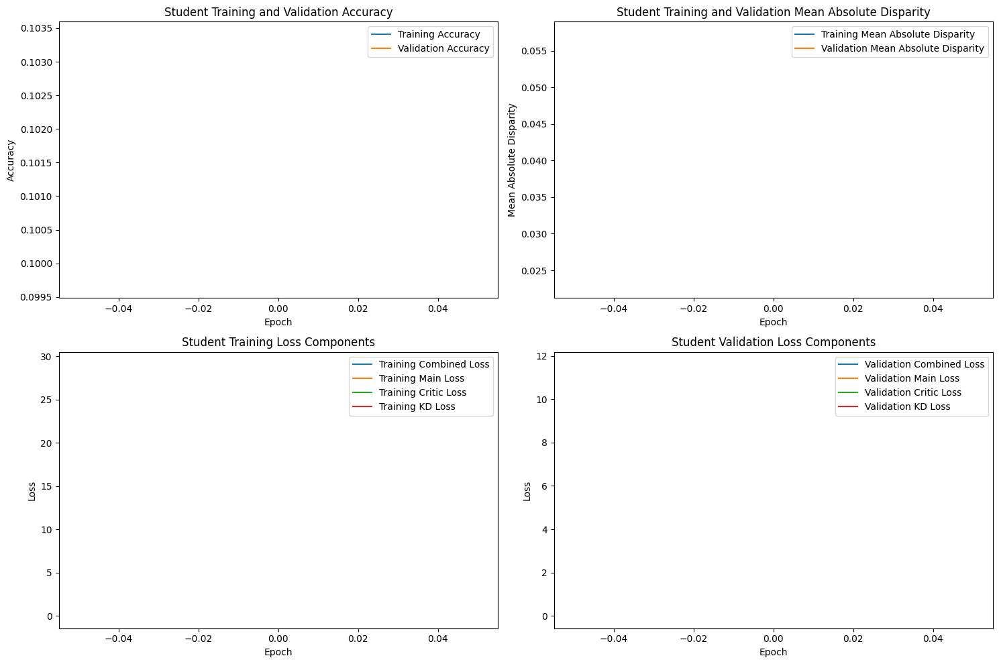

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.75it/s]



STUDENT - Lambda 160 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.050077, VALIDATION Accuracy: 0.0849
TRAINING Disparity: 0.012905, VALIDATION Disparity: 0.0447
TRAINING Combined Loss: 8.058794, VALIDATION Combined Loss: 6.2234
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.025597010568108827
Class Celebration: Val Disparity = -0.031129977764301597
Class Parade: Val Disparity = 0.018625561978163147
Class Waiter_Or_Waitress: Val Disparity = 0.05416012558869703
Class Individual_Sports: Val Disparity = -0.03057567112866652
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.18625741192884548
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = -0.007349615558570779
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.022025316455696192
Class Cheering: Val Disparity = 0.0
Cla

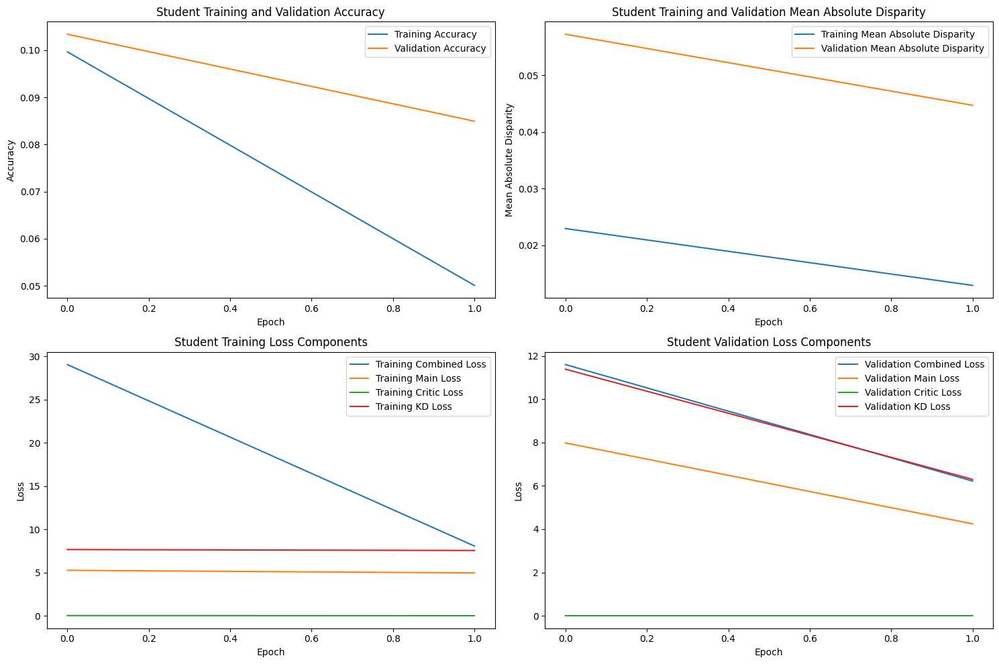

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 160 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.084124, VALIDATION Accuracy: 0.0969
TRAINING Disparity: 0.017890, VALIDATION Disparity: 0.0289
TRAINING Combined Loss: 5.263967, VALIDATION Combined Loss: 4.2155
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.006913061248321362
Class Celebration: Val Disparity = 0.005356781888012918
Class Parade: Val Disparity = -0.011560693641618497
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.0901909150757077
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.0683641437042205
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = -0.049079754601226995
Class Water_Activities: Val Disparity = 0.0
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.018734177215189884
Class Cheering: Val Disparity = 0.009615384615384616
Class

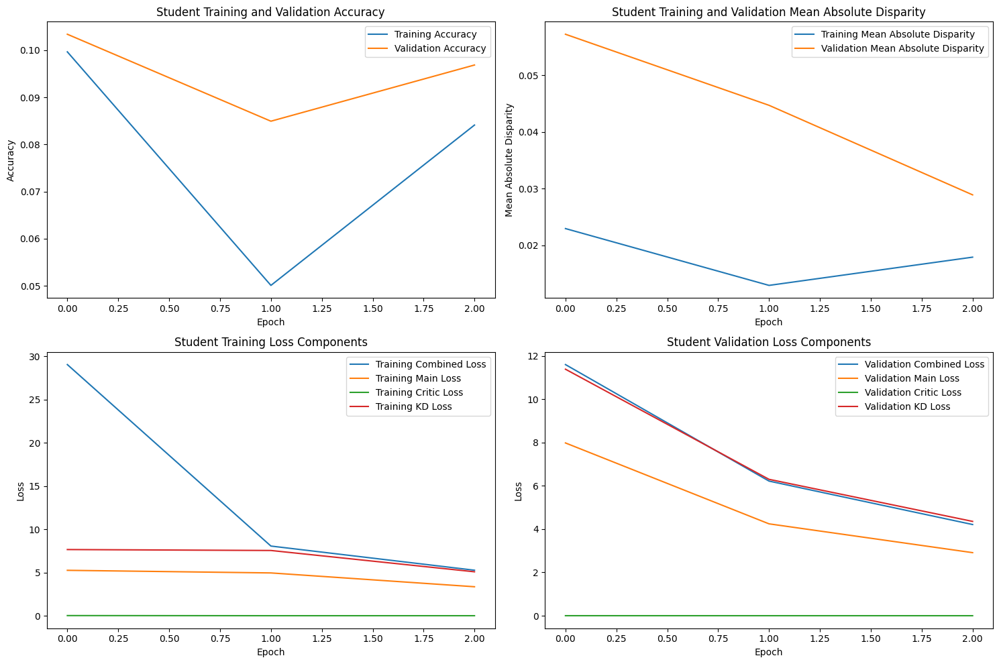

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 160 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.115664, VALIDATION Accuracy: 0.1722
TRAINING Disparity: 0.018913, VALIDATION Disparity: 0.0365
TRAINING Combined Loss: 4.330102, VALIDATION Combined Loss: 3.8481
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.038430548257137875
Class Celebration: Val Disparity = -0.013695168789165147
Class Parade: Val Disparity = 0.0
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.08386365298807695
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = -0.0513893733286827
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.007575757575757576
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = -0.024050632911392394
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: V

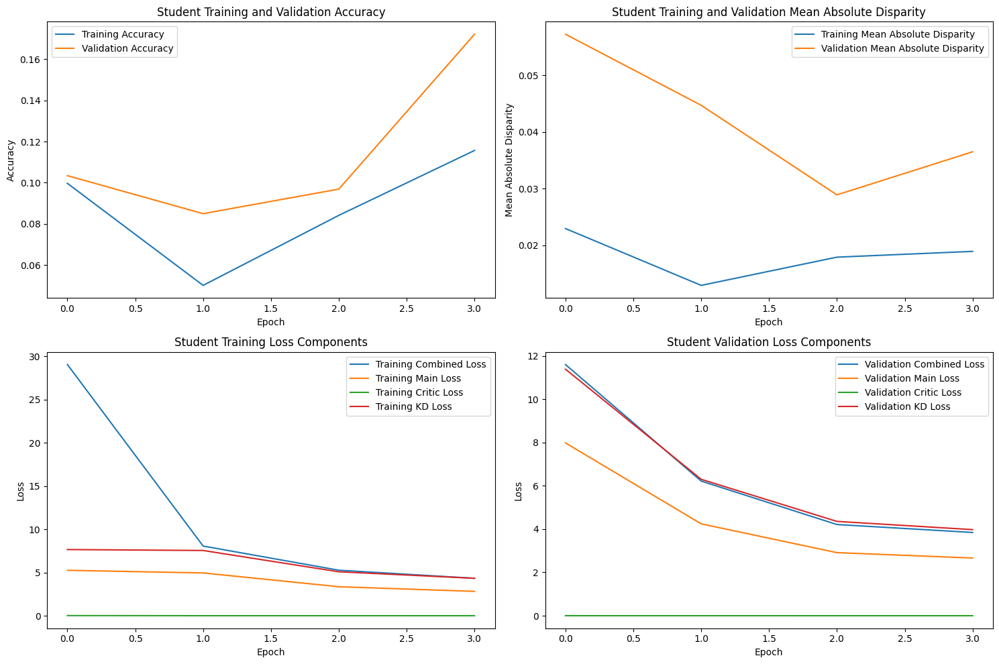

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.74it/s]



STUDENT - Lambda 160 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.187326, VALIDATION Accuracy: 0.1986
TRAINING Disparity: 0.009968, VALIDATION Disparity: 0.0235
TRAINING Combined Loss: 4.037418, VALIDATION Combined Loss: 3.6721
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.005897121504057856
Class Celebration: Val Disparity = -0.01910248635536689
Class Parade: Val Disparity = -0.011560693641618498
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.08967888230561041
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.0070921985815602835
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.007575757575757576
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: V

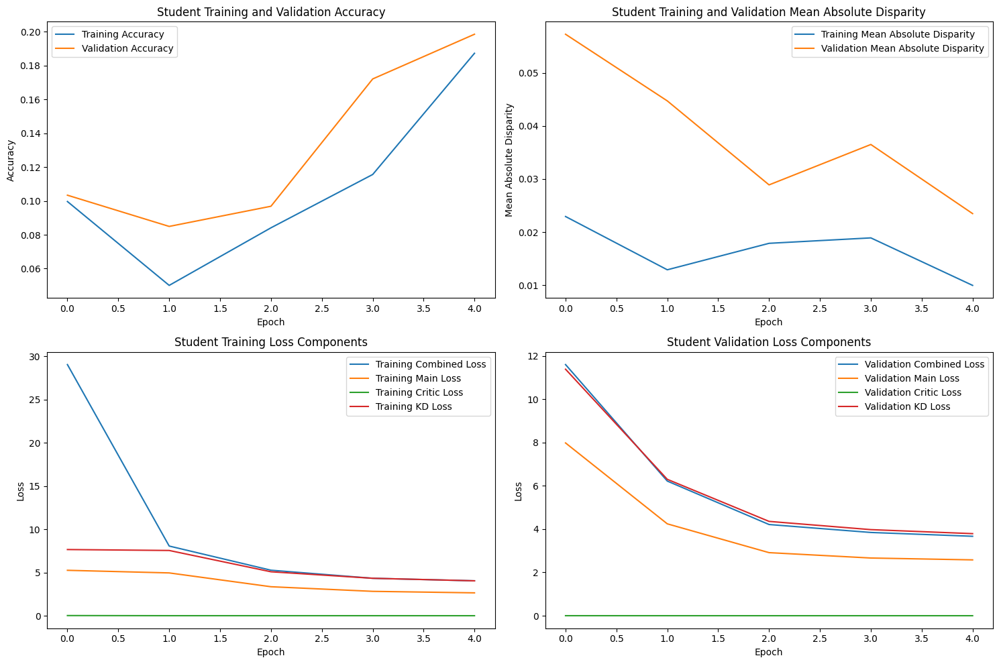

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.72it/s]



STUDENT - Lambda 160 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.197203, VALIDATION Accuracy: 0.2040
TRAINING Disparity: 0.012370, VALIDATION Disparity: 0.0302
TRAINING Combined Loss: 3.885463, VALIDATION Combined Loss: 3.5693
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.003584982775734269
Class Celebration: Val Disparity = -0.02299373357590459
Class Parade: Val Disparity = -0.01880072400303614
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.10624679979518686
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.0070921985815602835
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.022727272727272728
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: V

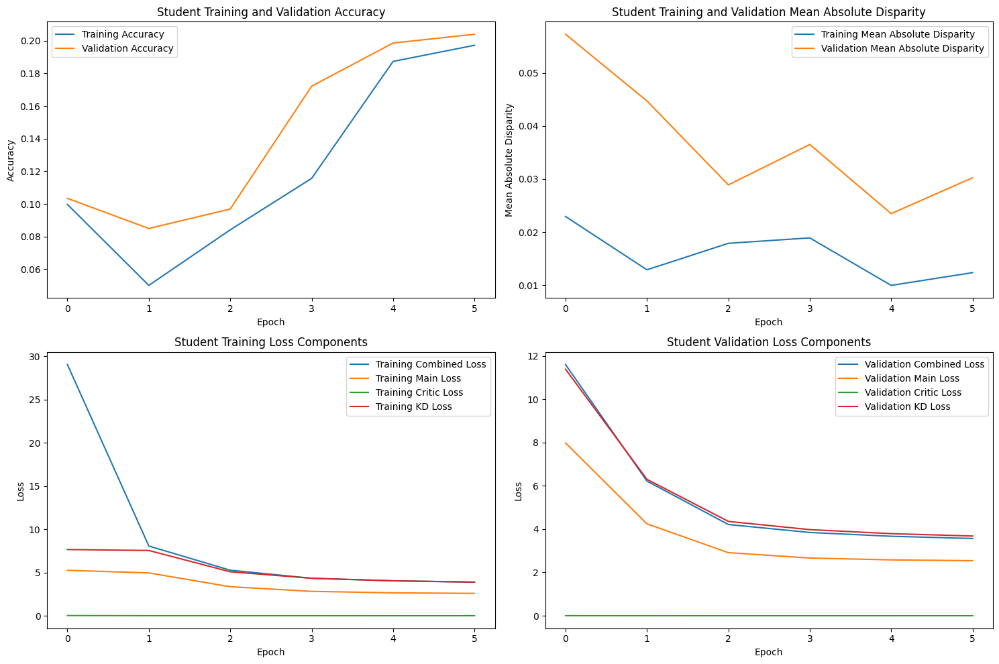

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 160 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.200077, VALIDATION Accuracy: 0.2082
TRAINING Disparity: 0.008585, VALIDATION Disparity: 0.0365
TRAINING Combined Loss: 3.787182, VALIDATION Combined Loss: 3.4833
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.010264494657558298
Class Celebration: Val Disparity = -0.03380836870830807
Class Parade: Val Disparity = -0.001459683540608393
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.12914197937239413
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.0
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.007575757575757577
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: Val Disparity = 0.

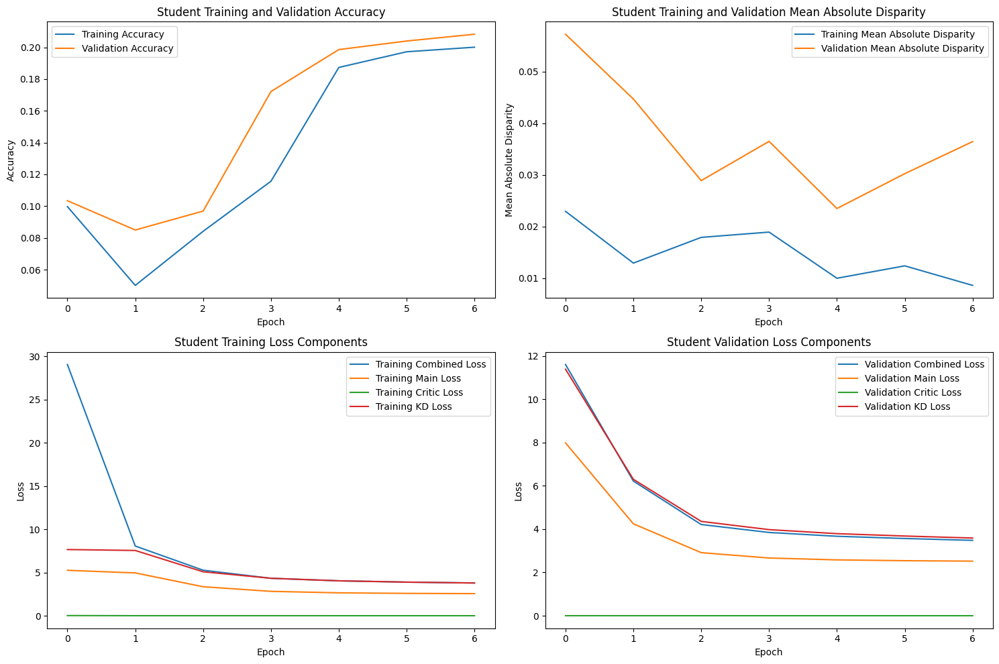

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.73it/s]



STUDENT - Lambda 160 - Epoch 8 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.203376, VALIDATION Accuracy: 0.2068
TRAINING Disparity: 0.010810, VALIDATION Disparity: 0.0437
TRAINING Combined Loss: 3.709872, VALIDATION Combined Loss: 3.4227
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.018847433876335584
Class Celebration: Val Disparity = -0.06322013341419042
Class Parade: Val Disparity = -0.007240030361417642
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.11261063565211032
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.0070921985815602835
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.053030303030303025
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: 

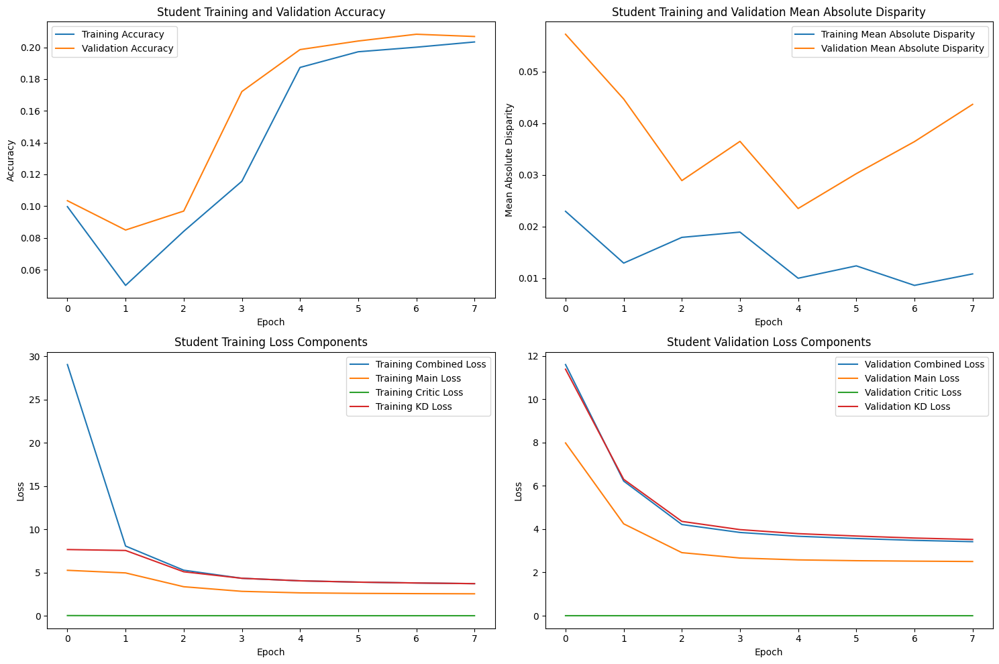

Epoch 9/200, Validation: 100%|█████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 160 - Epoch 9 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.203877, VALIDATION Accuracy: 0.2068
TRAINING Disparity: 0.011255, VALIDATION Disparity: 0.0473
TRAINING Combined Loss: 3.644427, VALIDATION Combined Loss: 3.3698
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.002347171133298298
Class Celebration: Val Disparity = -0.05730745906610066
Class Parade: Val Disparity = 0.008582939218777369
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.1228147172847634
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.0
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.045454545454545456
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: Val Disparity = 0.0


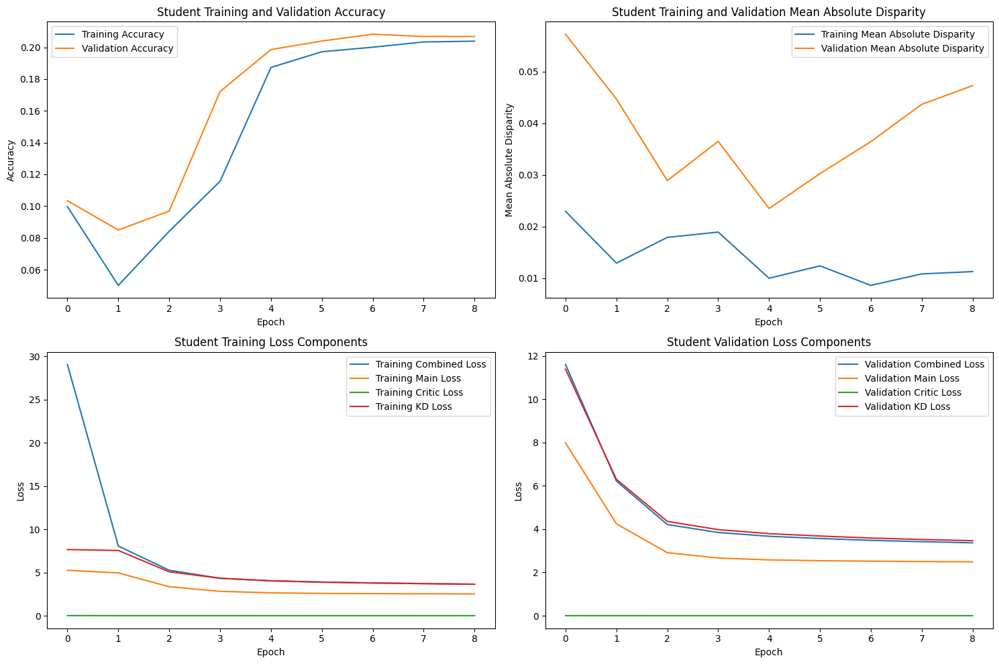

Epoch 10/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.74it/s]



STUDENT - Lambda 160 - Epoch 10 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.204321, VALIDATION Accuracy: 0.2134
TRAINING Disparity: 0.011984, VALIDATION Disparity: 0.0387
TRAINING Combined Loss: 3.588245, VALIDATION Combined Loss: 3.3263
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.01328895895369886
Class Celebration: Val Disparity = -0.06069334950475034
Class Parade: Val Disparity = -0.01891749868628481
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.14819691317387168
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.014184397163120567
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.007801899592944368
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: Va

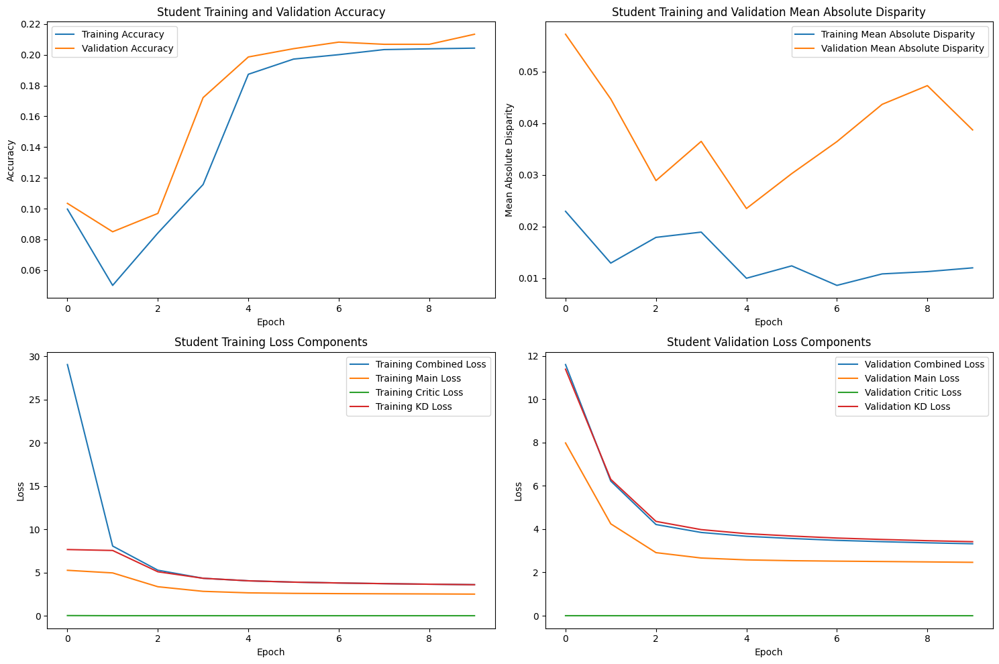

Epoch 11/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 160 - Epoch 11 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.208873, VALIDATION Accuracy: 0.2207
TRAINING Disparity: 0.018025, VALIDATION Disparity: 0.0558
TRAINING Combined Loss: 3.544686, VALIDATION Combined Loss: 3.2906
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.029170315875518216
Class Celebration: Val Disparity = -0.06170406306852639
Class Parade: Val Disparity = -0.018975886027909117
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.17522492868114992
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.011975351703290317
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.09136137494346451
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: V

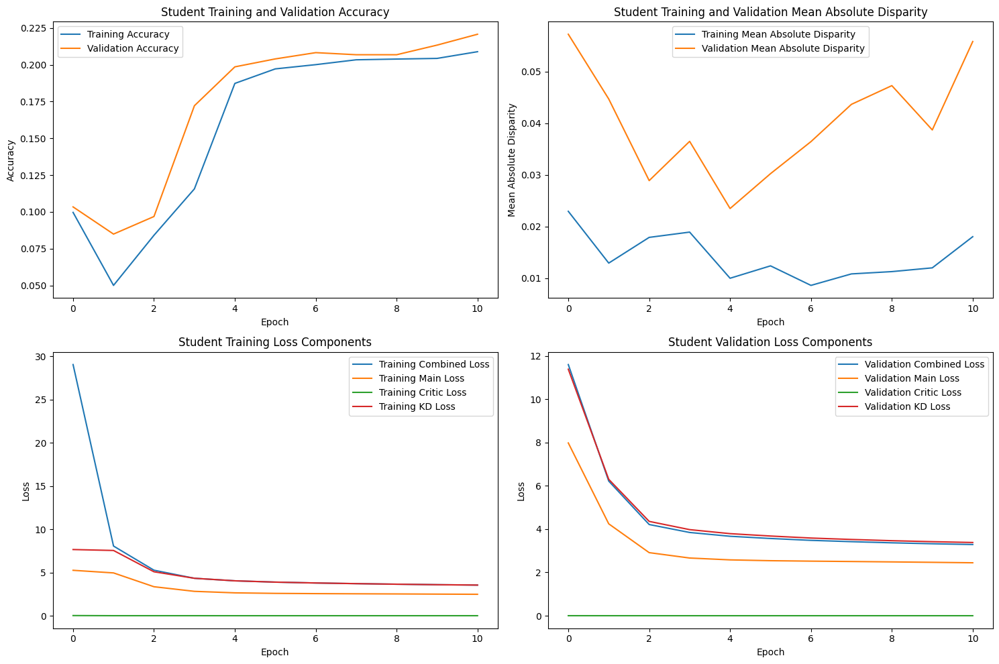

Epoch 12/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 160 - Epoch 12 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.217149, VALIDATION Accuracy: 0.2236
TRAINING Disparity: 0.013328, VALIDATION Disparity: 0.0442
TRAINING Combined Loss: 3.504598, VALIDATION Combined Loss: 3.2482
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.03231155485490744
Class Celebration: Val Disparity = -0.08419243986254295
Class Parade: Val Disparity = 0.007006480994920322
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.16999487967229898
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = -0.0044180909196605
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = 0.0009045680687471691
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: Va

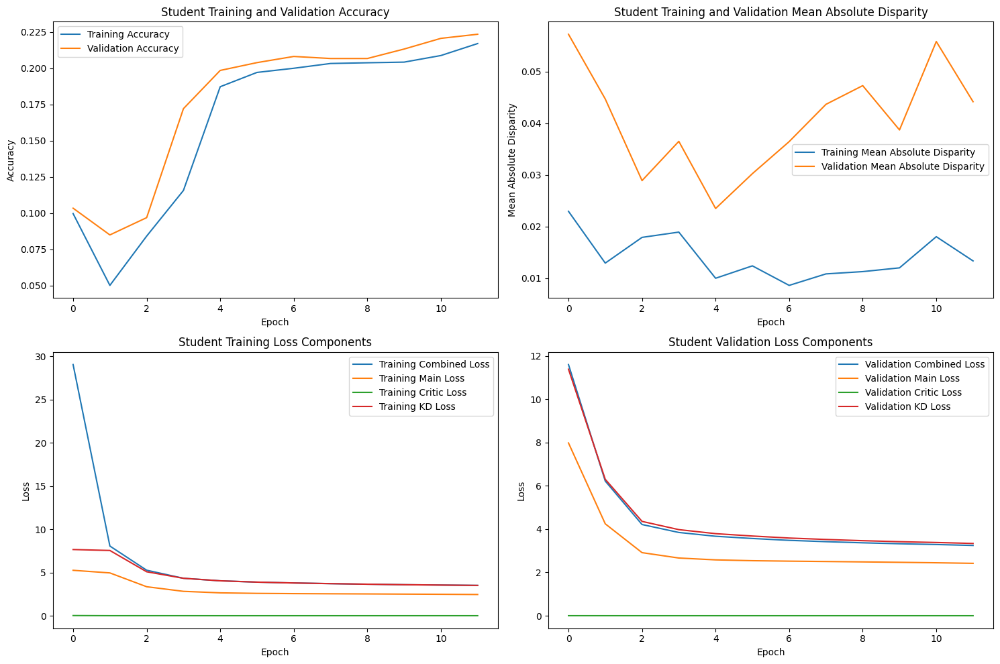

Epoch 13/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.75it/s]



STUDENT - Lambda 160 - Epoch 13 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.225849, VALIDATION Accuracy: 0.2330
TRAINING Disparity: 0.010583, VALIDATION Disparity: 0.0571
TRAINING Combined Loss: 3.463679, VALIDATION Combined Loss: 3.2069
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.04359198925672925
Class Celebration: Val Disparity = -0.043966040024257136
Class Parade: Val Disparity = -0.0579786302329655
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.16447224050910686
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.0452272991512615
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = 0.0
Class Water_Activities: Val Disparity = -0.05766621438263231
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_And_Entertainment: Val 

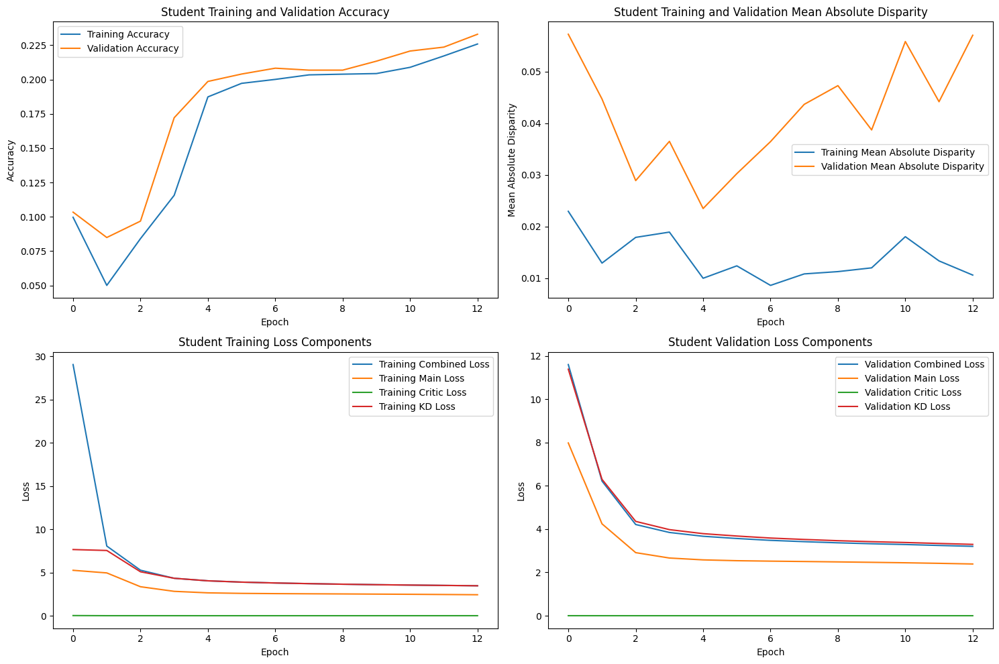

Epoch 14/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 160 - Epoch 14 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.238773, VALIDATION Accuracy: 0.2472
TRAINING Disparity: 0.005793, VALIDATION Disparity: 0.0513
TRAINING Combined Loss: 3.408257, VALIDATION Combined Loss: 3.1491
--------------------------------------------------

Class Team_Sports: Val Disparity = -0.013172184270450082
Class Celebration: Val Disparity = -0.04836264402668285
Class Parade: Val Disparity = -0.026332691072575493
Class Waiter_Or_Waitress: Val Disparity = 0.0
Class Individual_Sports: Val Disparity = 0.13938263477433988
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.06917800255784212
Class Business: Val Disparity = 0.0
Class Dresses: Val Disparity = -0.006134969325153374
Class Water_Activities: Val Disparity = -0.06275440976933522
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Disparity = 0.0
Class Performance_An

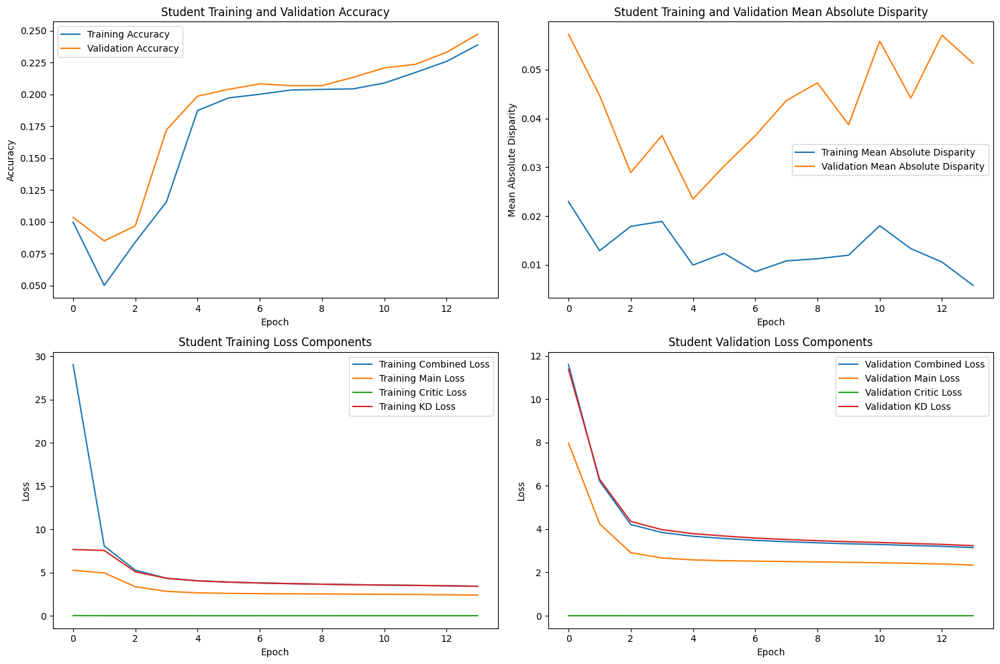

Epoch 15/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.74it/s]



STUDENT - Lambda 160 - Epoch 15 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.252681, VALIDATION Accuracy: 0.2554
TRAINING Disparity: 0.025371, VALIDATION Disparity: 0.0575
TRAINING Combined Loss: 3.349167, VALIDATION Combined Loss: 3.1057
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.008886553395223928
Class Celebration: Val Disparity = -0.13255508388922585
Class Parade: Val Disparity = -0.045250189758860304
Class Waiter_Or_Waitress: Val Disparity = -0.01020408163265306
Class Individual_Sports: Val Disparity = 0.11454904542462141
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.11882339262876412
Class Business: Val Disparity = 0.00980392156862745
Class Dresses: Val Disparity = -0.03680981595092024
Class Water_Activities: Val Disparity = -0.0026006331976480834
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Dis

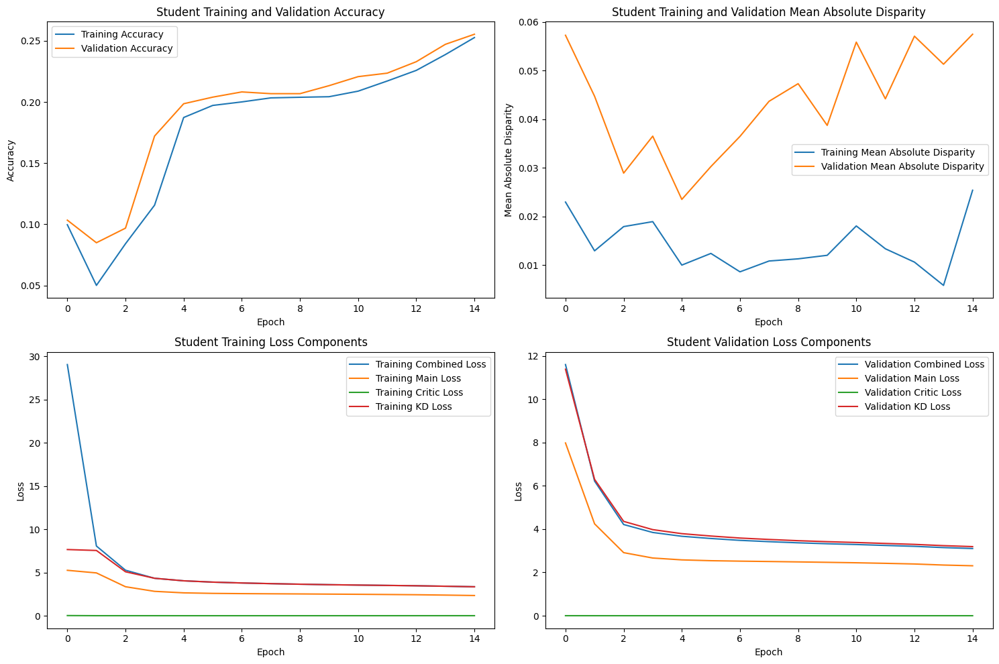

Epoch 16/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.75it/s]



STUDENT - Lambda 160 - Epoch 16 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.266030, VALIDATION Accuracy: 0.2741
TRAINING Disparity: 0.018207, VALIDATION Disparity: 0.0778
TRAINING Combined Loss: 3.289970, VALIDATION Combined Loss: 3.0463
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.032510071816430286
Class Celebration: Val Disparity = -0.1252779462300384
Class Parade: Val Disparity = 0.0009925848076137167
Class Waiter_Or_Waitress: Val Disparity = -0.030612244897959183
Class Individual_Sports: Val Disparity = 0.15536537195523376
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.06080688292059064
Class Business: Val Disparity = 0.00980392156862745
Class Dresses: Val Disparity = -0.07975460122699388
Class Water_Activities: Val Disparity = -0.07700135685210308
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Dispa

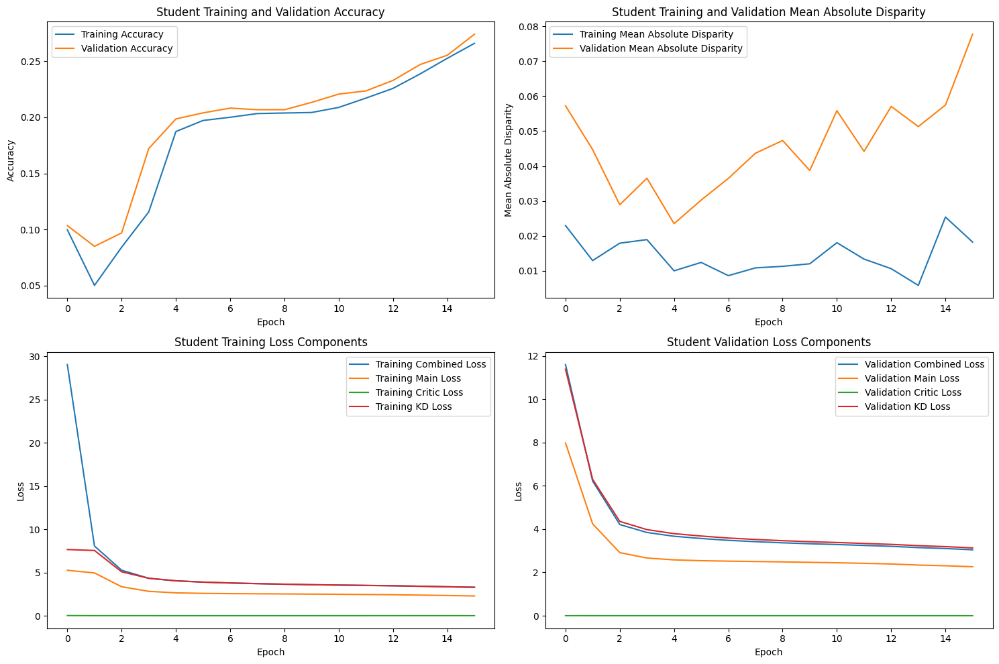

Epoch 17/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 160 - Epoch 17 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.286574, VALIDATION Accuracy: 0.2830
TRAINING Disparity: 0.026457, VALIDATION Disparity: 0.0978
TRAINING Combined Loss: 3.232861, VALIDATION Combined Loss: 3.0007
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.053949903660886256
Class Celebration: Val Disparity = -0.18106933495047506
Class Parade: Val Disparity = 0.01249489110760793
Class Waiter_Or_Waitress: Val Disparity = -0.09419152276295134
Class Individual_Sports: Val Disparity = 0.17906517445687947
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.10824322753168242
Class Business: Val Disparity = -0.001065643648763855
Class Dresses: Val Disparity = -0.1411042944785276
Class Water_Activities: Val Disparity = -0.038444142921754854
Class Picnic: Val Disparity = 0.0
Class Rescue: Val Disparity = 0.0
Class Cheering: Val Dispa

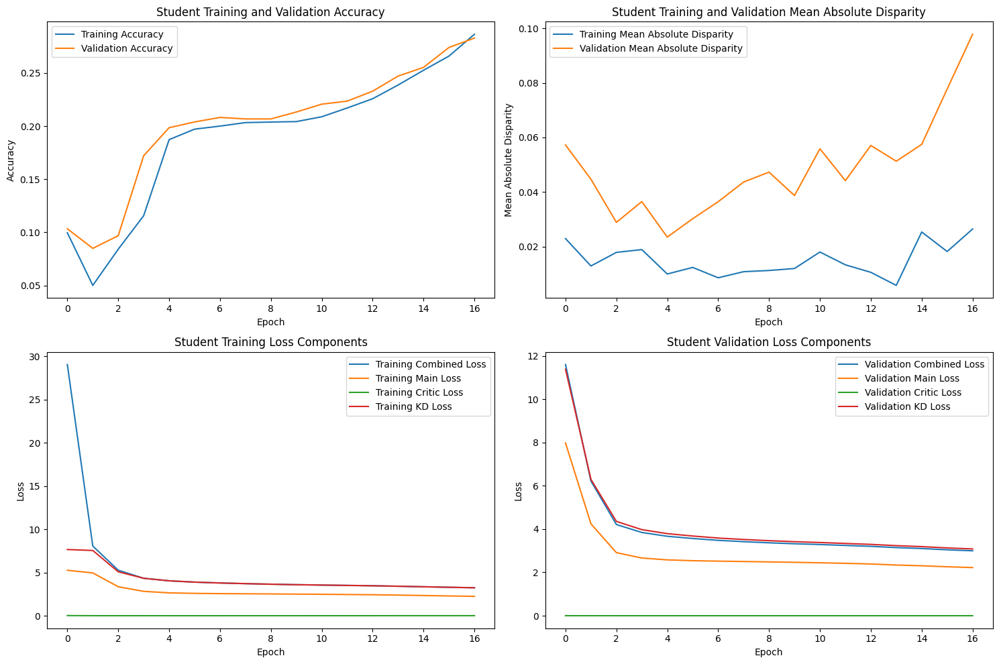

Epoch 18/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.75it/s]



STUDENT - Lambda 160 - Epoch 18 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.295949, VALIDATION Accuracy: 0.2991
TRAINING Disparity: 0.023891, VALIDATION Disparity: 0.0943
TRAINING Combined Loss: 3.179653, VALIDATION Combined Loss: 2.9570
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.03604834471886498
Class Celebration: Val Disparity = -0.10314331918334341
Class Parade: Val Disparity = 0.03263852396800371
Class Waiter_Or_Waitress: Val Disparity = -0.10675039246467818
Class Individual_Sports: Val Disparity = 0.1476483066344818
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.15300546448087426
Class Business: Val Disparity = 0.006606990622335884
Class Dresses: Val Disparity = -0.17791411042944782
Class Water_Activities: Val Disparity = 0.021483491632745433
Class Picnic: Val Disparity = -0.0196078431372549
Class Rescue: Val Disparity = 0.0
Class Cheeri

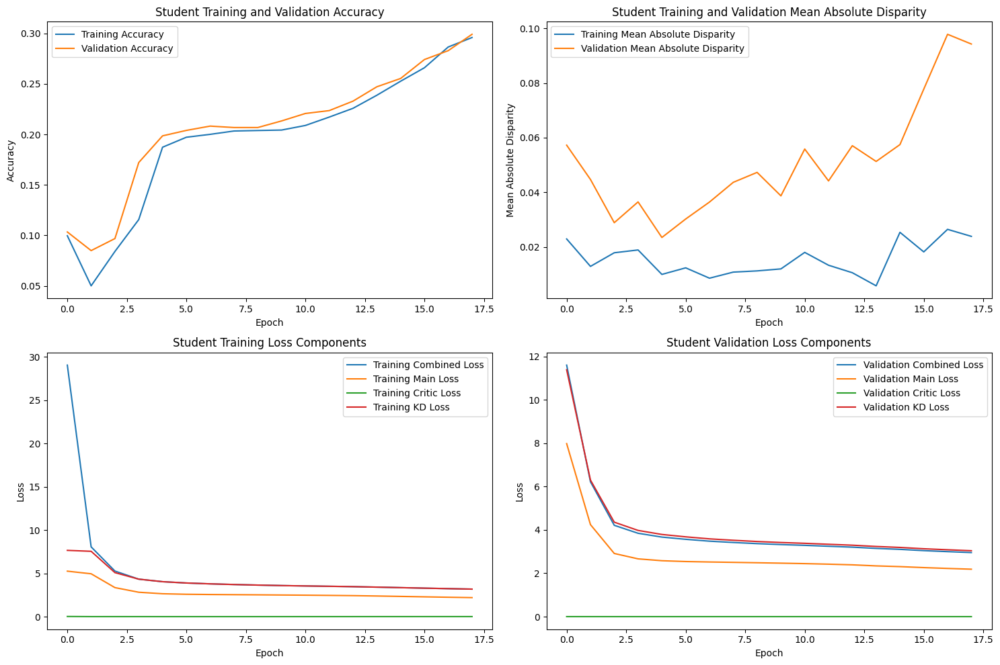

Epoch 19/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.75it/s]



STUDENT - Lambda 160 - Epoch 19 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.308681, VALIDATION Accuracy: 0.3139
TRAINING Disparity: 0.037210, VALIDATION Disparity: 0.0975
TRAINING Combined Loss: 3.124072, VALIDATION Combined Loss: 2.9086
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05714952998189993
Class Celebration: Val Disparity = -0.0668081665655953
Class Parade: Val Disparity = 0.03403982016698781
Class Waiter_Or_Waitress: Val Disparity = -0.09654631083202511
Class Individual_Sports: Val Disparity = 0.17687074829931976
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.09719800023253117
Class Business: Val Disparity = -0.057544757033248066
Class Dresses: Val Disparity = -0.16993865030674846
Class Water_Activities: Val Disparity = 0.09791949344188161
Class Picnic: Val Disparity = -0.0196078431372549
Class Rescue: Val Disparity = 0.0
Class Cheeri

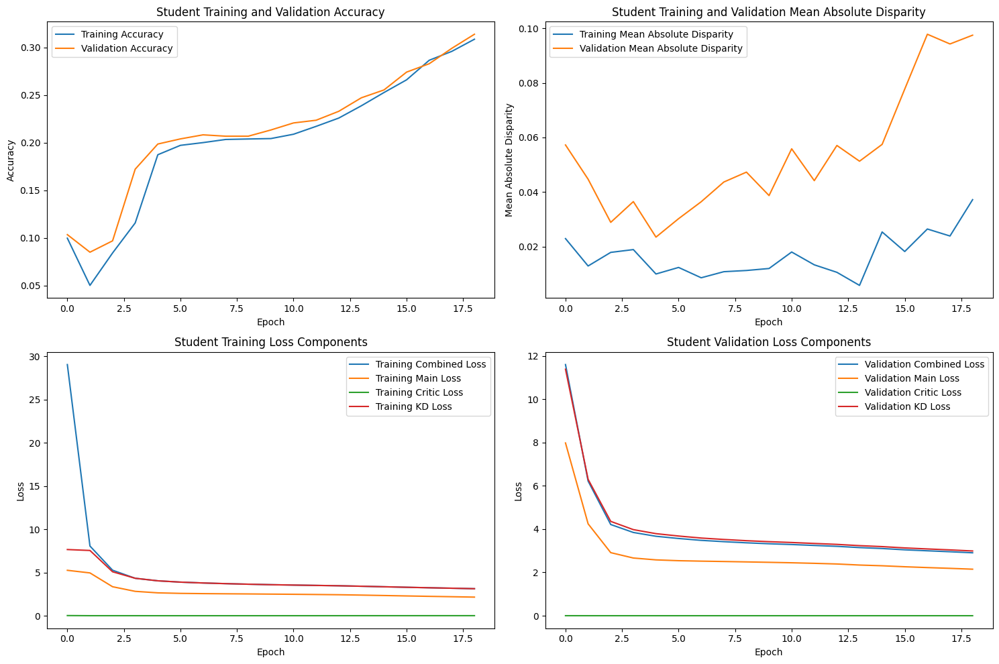

Epoch 20/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.71it/s]



STUDENT - Lambda 160 - Epoch 20 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.327739, VALIDATION Accuracy: 0.3270
TRAINING Disparity: 0.039235, VALIDATION Disparity: 0.1267
TRAINING Combined Loss: 3.067489, VALIDATION Combined Loss: 2.8686
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.03660886319845846
Class Celebration: Val Disparity = -0.10753992318576916
Class Parade: Val Disparity = 0.08162550359082149
Class Waiter_Or_Waitress: Val Disparity = -0.21899529042386184
Class Individual_Sports: Val Disparity = 0.13909004461999847
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.2598535054063481
Class Business: Val Disparity = -0.03900255754475704
Class Dresses: Val Disparity = -0.17607361963190188
Class Water_Activities: Val Disparity = -0.04556761646313873
Class Picnic: Val Disparity = 0.0522875816993464
Class Rescue: Val Disparity = 0.0
Class Cheerin

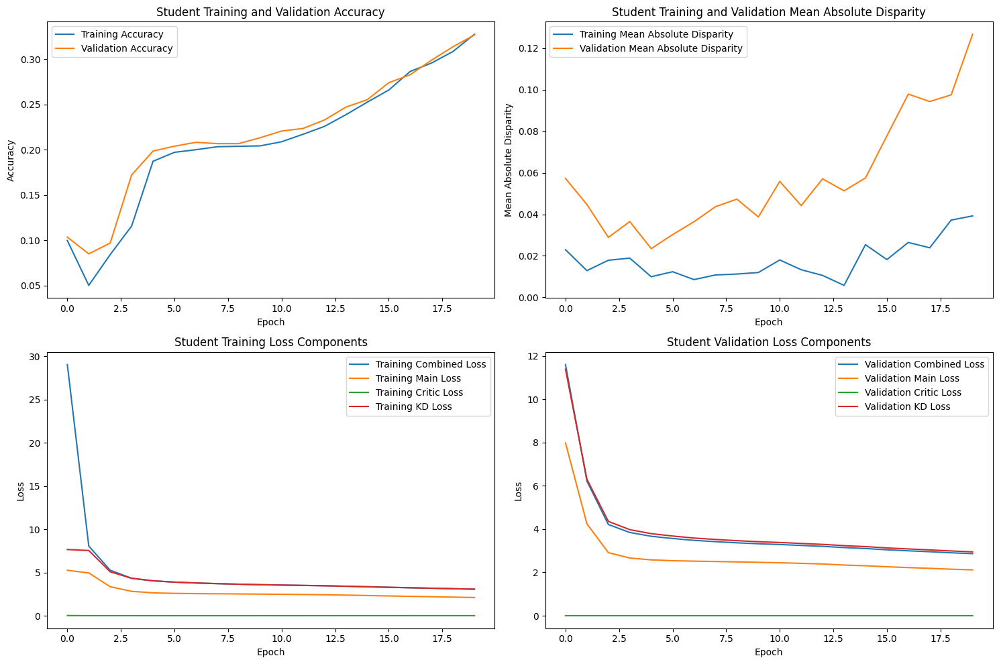

Epoch 21/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.73it/s]



STUDENT - Lambda 160 - Epoch 21 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.337365, VALIDATION Accuracy: 0.3438
TRAINING Disparity: 0.036879, VALIDATION Disparity: 0.1232
TRAINING Combined Loss: 3.025934, VALIDATION Combined Loss: 2.8093
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.027068371577042116
Class Celebration: Val Disparity = -0.09485546796038005
Class Parade: Val Disparity = 0.05850411630758451
Class Waiter_Or_Waitress: Val Disparity = -0.17032967032967028
Class Individual_Sports: Val Disparity = 0.09443347231365667
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.23636786420183706
Class Business: Val Disparity = -0.06926683716965049
Class Dresses: Val Disparity = -0.23926380368098163
Class Water_Activities: Val Disparity = 0.04534147444595216
Class Picnic: Val Disparity = -0.0784313725490196
Class Rescue: Val Disparity = 0.0
Class Cheer

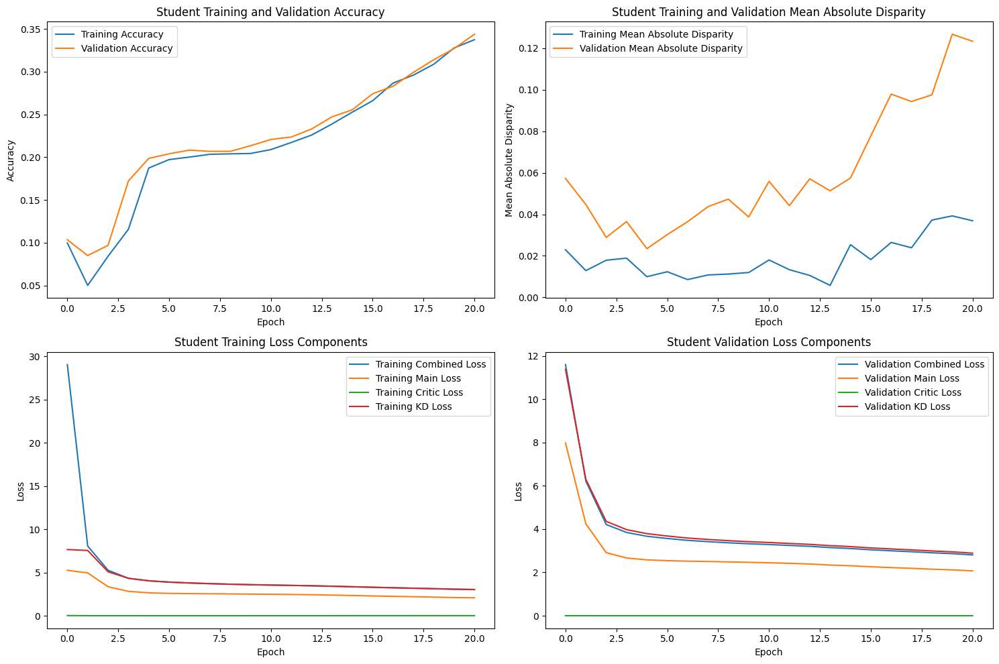

Epoch 22/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.71it/s]



STUDENT - Lambda 160 - Epoch 22 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.358410, VALIDATION Accuracy: 0.3568
TRAINING Disparity: 0.057797, VALIDATION Disparity: 0.1111
TRAINING Combined Loss: 2.961991, VALIDATION Combined Loss: 2.7758
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.04031062065744151
Class Celebration: Val Disparity = -0.05397210430563981
Class Parade: Val Disparity = 0.06434285047001803
Class Waiter_Or_Waitress: Val Disparity = -0.1750392464678179
Class Individual_Sports: Val Disparity = 0.0685026698851583
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.25276130682478787
Class Business: Val Disparity = -0.08120204603580561
Class Dresses: Val Disparity = -0.32515337423312884
Class Water_Activities: Val Disparity = 0.01594301221166905
Class Picnic: Val Disparity = 0.0326797385620915
Class Rescue: Val Disparity = 0.0
Class Cheering:

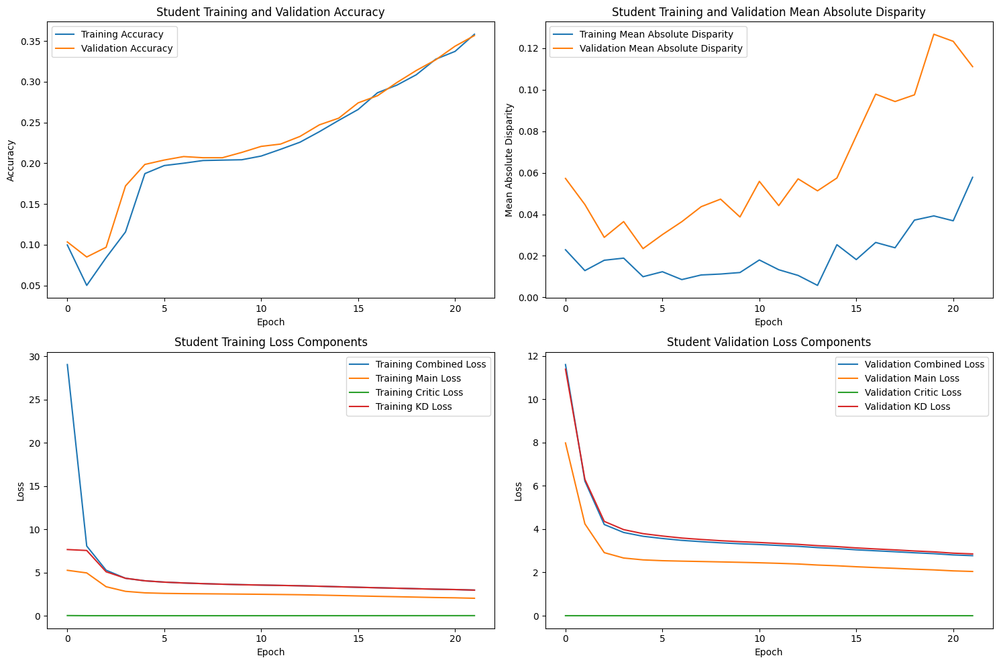

Epoch 23/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 160 - Epoch 23 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.374460, VALIDATION Accuracy: 0.3611
TRAINING Disparity: 0.062779, VALIDATION Disparity: 0.1245
TRAINING Combined Loss: 2.909644, VALIDATION Combined Loss: 2.7216
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06663163426169205
Class Celebration: Val Disparity = -0.010865170810592295
Class Parade: Val Disparity = 0.07158288083143571
Class Waiter_Or_Waitress: Val Disparity = -0.31083202511773944
Class Individual_Sports: Val Disparity = 0.1368956184624387
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.18811766073712366
Class Business: Val Disparity = -0.04624893435635122
Class Dresses: Val Disparity = -0.3558282208588957
Class Water_Activities: Val Disparity = 0.00011307100859359043
Class Picnic: Val Disparity = -0.1372549019607843
Class Rescue: Val Disparity = 0.0
Class Chee

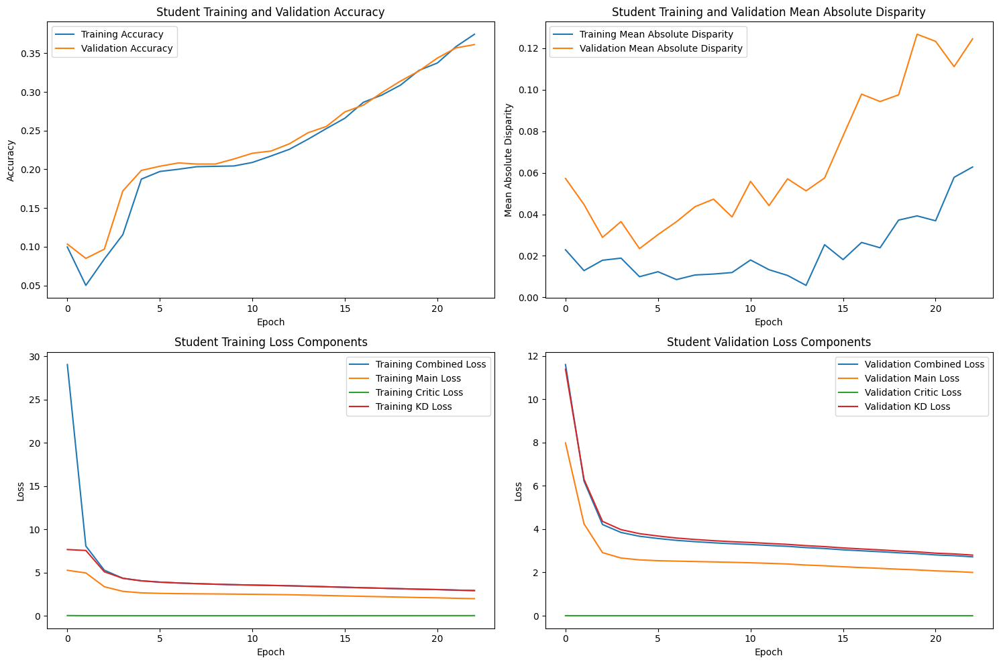

Epoch 24/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 160 - Epoch 24 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.391262, VALIDATION Accuracy: 0.3682
TRAINING Disparity: 0.064454, VALIDATION Disparity: 0.1483
TRAINING Combined Loss: 2.844975, VALIDATION Combined Loss: 2.6830
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.02684649967886965
Class Celebration: Val Disparity = -0.01137052759248025
Class Parade: Val Disparity = 0.110410463011619
Class Waiter_Or_Waitress: Val Disparity = -0.2982731554160125
Class Individual_Sports: Val Disparity = 0.13967522492868117
Class Surgeons: Val Disparity = 0.0
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.3126380653412395
Class Business: Val Disparity = -0.057118499573742515
Class Dresses: Val Disparity = -0.4233128834355828
Class Water_Activities: Val Disparity = -0.12822252374491178
Class Picnic: Val Disparity = 0.065359477124183
Class Rescue: Val Disparity = 0.0
Class Cheering: V

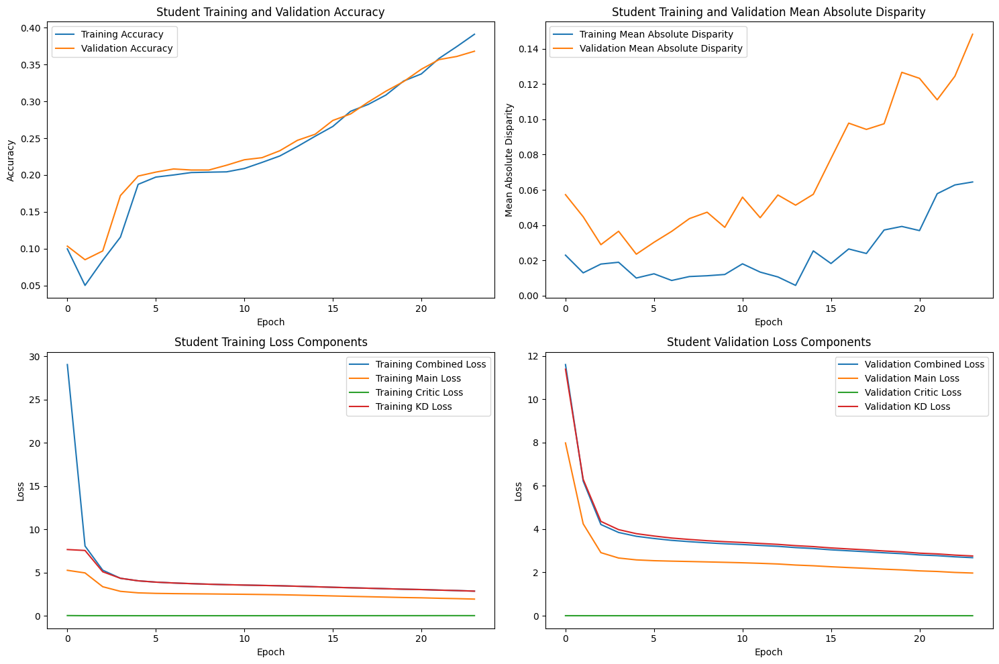

Epoch 25/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.74it/s]



STUDENT - Lambda 160 - Epoch 25 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.405633, VALIDATION Accuracy: 0.3909
TRAINING Disparity: 0.064864, VALIDATION Disparity: 0.1265
TRAINING Combined Loss: 2.777189, VALIDATION Combined Loss: 2.6168
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.03548782623927138
Class Celebration: Val Disparity = -0.028956943602183205
Class Parade: Val Disparity = 0.11041046301161911
Class Waiter_Or_Waitress: Val Disparity = -0.2362637362637363
Class Individual_Sports: Val Disparity = 0.06824665350010978
Class Surgeons: Val Disparity = -0.030303030303030304
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.3165910940588304
Class Business: Val Disparity = -0.09633418584825237
Class Dresses: Val Disparity = -0.49079754601226994
Class Water_Activities: Val Disparity = 0.00836725463591148
Class Picnic: Val Disparity = -0.10457516339869283
Class Rescue: Val Disparity 

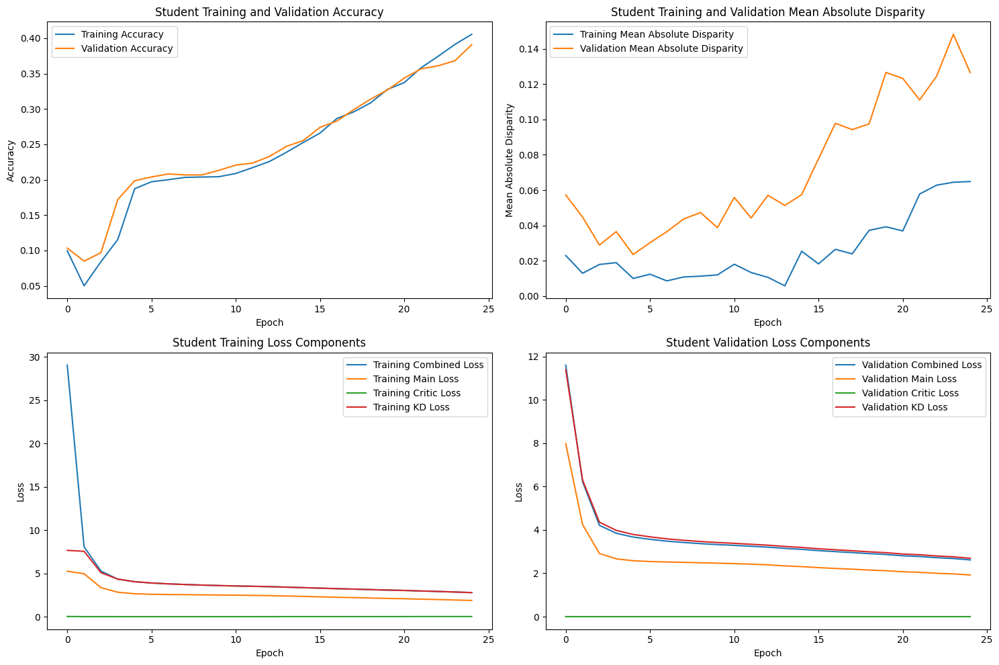

Epoch 26/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 160 - Epoch 26 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.419117, VALIDATION Accuracy: 0.4034
TRAINING Disparity: 0.072870, VALIDATION Disparity: 0.1205
TRAINING Combined Loss: 2.725845, VALIDATION Combined Loss: 2.5610
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.059671863140071224
Class Celebration: Val Disparity = 0.025469981807155873
Class Parade: Val Disparity = 0.09026683015122317
Class Waiter_Or_Waitress: Val Disparity = -0.24646781789638939
Class Individual_Sports: Val Disparity = 0.04564406407724386
Class Surgeons: Val Disparity = 0.006651884700665189
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.2975235437739798
Class Business: Val Disparity = -0.04838022165387898
Class Dresses: Val Disparity = -0.4171779141104294
Class Water_Activities: Val Disparity = -0.006105834464043336
Class Picnic: Val Disparity = -0.10457516339869283
Class Rescue: Val Disparity

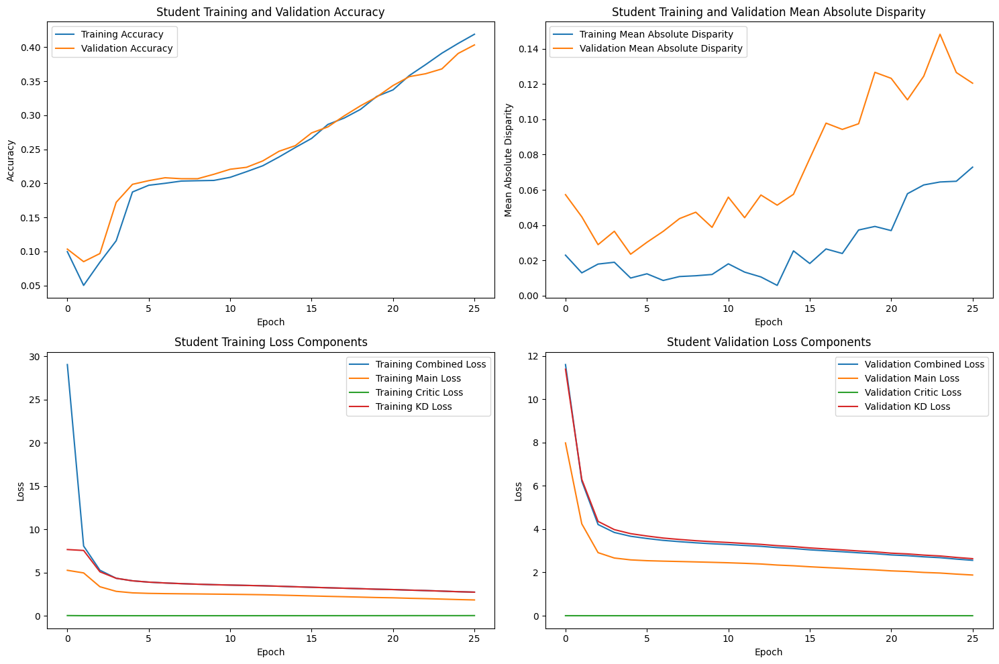

Epoch 27/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.80it/s]



STUDENT - Lambda 160 - Epoch 27 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.435243, VALIDATION Accuracy: 0.4068
TRAINING Disparity: 0.074720, VALIDATION Disparity: 0.1273
TRAINING Combined Loss: 2.657882, VALIDATION Combined Loss: 2.5446
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.004110468850353155
Class Celebration: Val Disparity = -0.08692136648473822
Class Parade: Val Disparity = 0.11198692123547621
Class Waiter_Or_Waitress: Val Disparity = -0.29748822605965464
Class Individual_Sports: Val Disparity = 0.08009655475093264
Class Surgeons: Val Disparity = -0.023651145602365087
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.35472619462853167
Class Business: Val Disparity = -0.07438192668371696
Class Dresses: Val Disparity = -0.3742331288343559
Class Water_Activities: Val Disparity = -0.059588421528719904
Class Picnic: Val Disparity = -0.0326797385620915
Class Rescue: Val Disparit

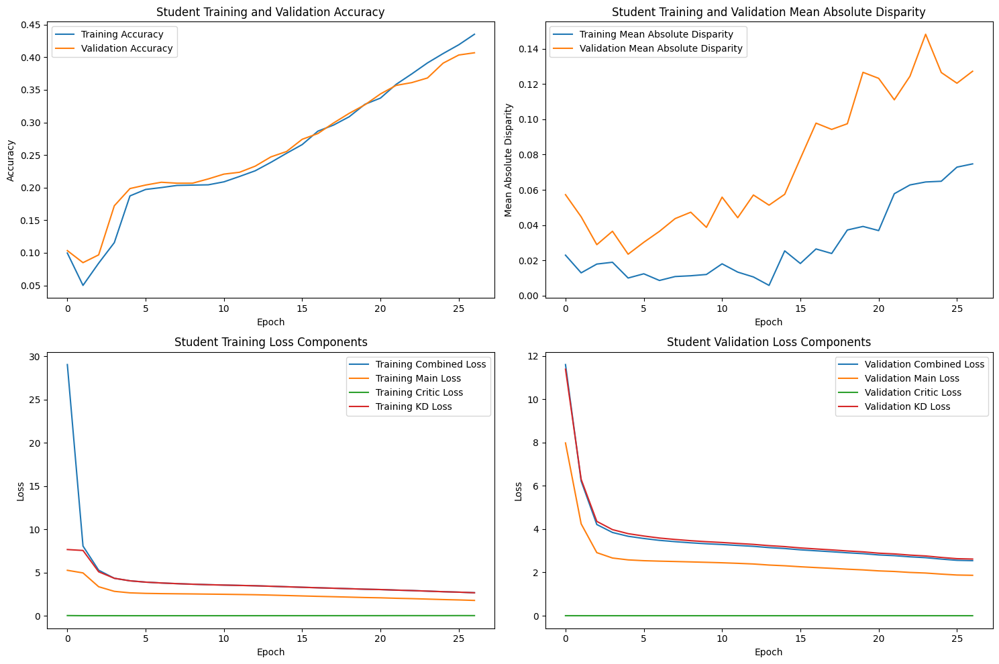

Epoch 28/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.73it/s]



STUDENT - Lambda 160 - Epoch 28 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.456617, VALIDATION Accuracy: 0.4182
TRAINING Disparity: 0.083096, VALIDATION Disparity: 0.1403
TRAINING Combined Loss: 2.589924, VALIDATION Combined Loss: 2.5011
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06551059730250475
Class Celebration: Val Disparity = 0.09525975338589043
Class Parade: Val Disparity = 0.11765049337303674
Class Waiter_Or_Waitress: Val Disparity = -0.28728414442700156
Class Individual_Sports: Val Disparity = 0.030209933435739744
Class Surgeons: Val Disparity = -0.041389504804138944
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.35960934775026165
Class Business: Val Disparity = -0.06351236146632566
Class Dresses: Val Disparity = -0.4539877300613497
Class Water_Activities: Val Disparity = -0.00791497060153784
Class Picnic: Val Disparity = 0.026143790849673193
Class Rescue: Val Disparity

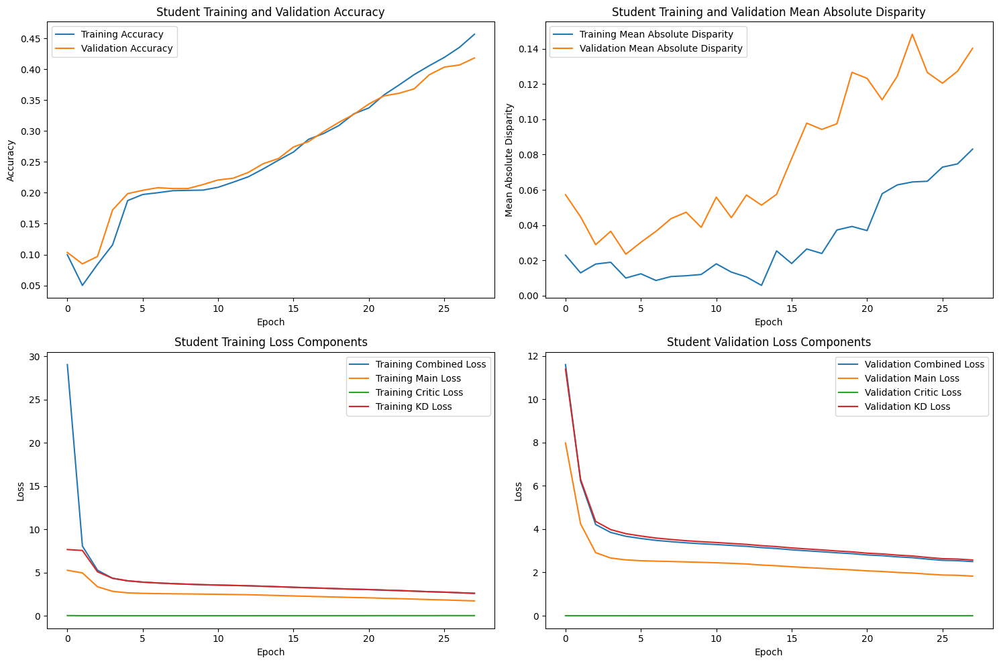

Epoch 29/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 160 - Epoch 29 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.475000, VALIDATION Accuracy: 0.4261
TRAINING Disparity: 0.090177, VALIDATION Disparity: 0.1509
TRAINING Combined Loss: 2.522720, VALIDATION Combined Loss: 2.4533
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.0949144625445203
Class Celebration: Val Disparity = 0.05200121285627657
Class Parade: Val Disparity = 0.10328720733345004
Class Waiter_Or_Waitress: Val Disparity = -0.18995290423861866
Class Individual_Sports: Val Disparity = -0.01971326164874554
Class Surgeons: Val Disparity = -0.07169253510716928
Class Spa: Val Disparity = 0.20567375886524822
Class Law_Enforcement: Val Disparity = 0.30112777584001865
Class Business: Val Disparity = -0.11572890025575444
Class Dresses: Val Disparity = -0.5766871165644171
Class Water_Activities: Val Disparity = -0.03867028493894159
Class Picnic: Val Disparity = -0.01307189542483661
Class Rescue:

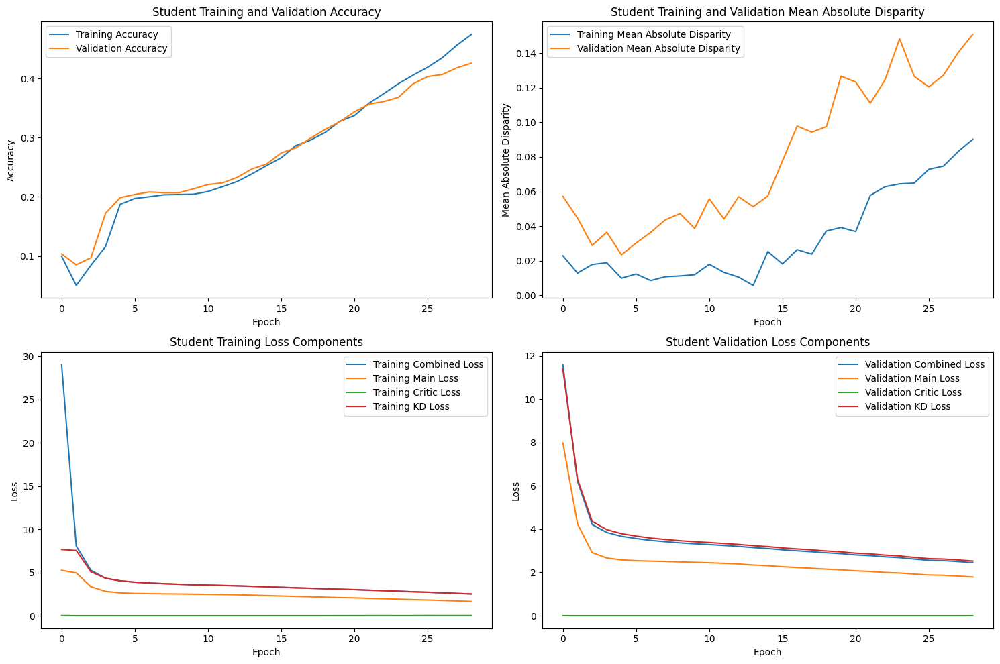

Epoch 30/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 160 - Epoch 30 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.496663, VALIDATION Accuracy: 0.4497
TRAINING Disparity: 0.090333, VALIDATION Disparity: 0.1528
TRAINING Combined Loss: 2.455506, VALIDATION Combined Loss: 2.4118
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07583347930168738
Class Celebration: Val Disparity = 0.03188801293713356
Class Parade: Val Disparity = 0.13487475915221592
Class Waiter_Or_Waitress: Val Disparity = -0.29748822605965464
Class Individual_Sports: Val Disparity = -0.04783849023480358
Class Surgeons: Val Disparity = -0.13229859571322986
Class Spa: Val Disparity = 0.1631205673758865
Class Law_Enforcement: Val Disparity = 0.340541797465411
Class Business: Val Disparity = -0.09612105711849955
Class Dresses: Val Disparity = -0.5030674846625767
Class Water_Activities: Val Disparity = 0.091474445952058
Class Picnic: Val Disparity = 0.03267973856209144
Class Rescue: Val D

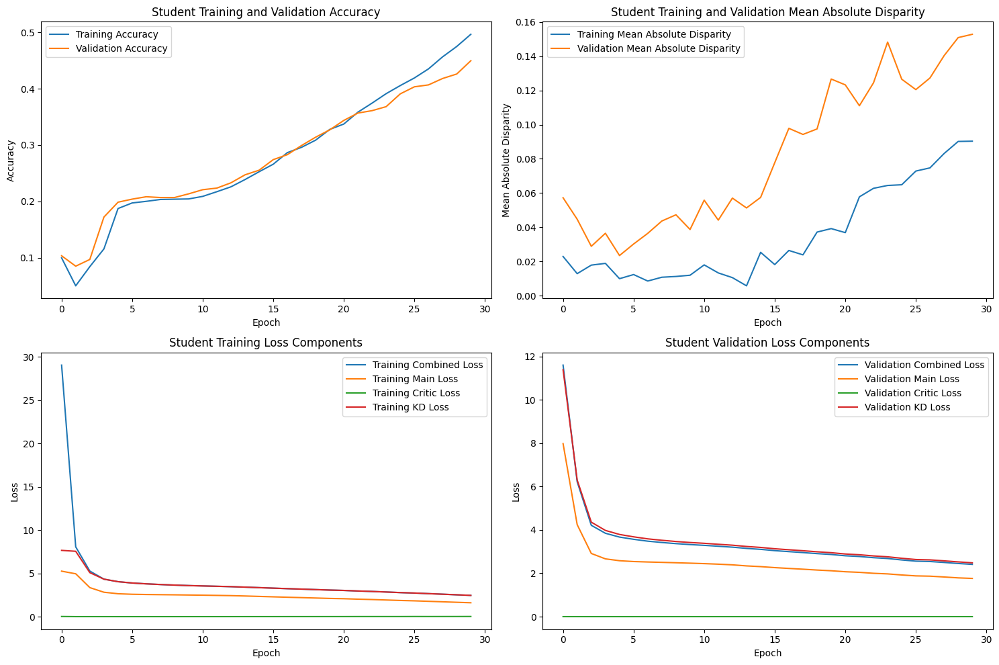

Epoch 31/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.80it/s]



STUDENT - Lambda 160 - Epoch 31 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.515606, VALIDATION Accuracy: 0.4565
TRAINING Disparity: 0.101478, VALIDATION Disparity: 0.1213
TRAINING Combined Loss: 2.374008, VALIDATION Combined Loss: 2.3828
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.01348747591522148
Class Celebration: Val Disparity = -0.00565999595714578
Class Parade: Val Disparity = 0.09166812635020716
Class Waiter_Or_Waitress: Val Disparity = -0.23312401883830464
Class Individual_Sports: Val Disparity = -0.03101455636017858
Class Surgeons: Val Disparity = -0.08351810790835179
Class Spa: Val Disparity = 0.056737588652482296
Class Law_Enforcement: Val Disparity = 0.3339146610859203
Class Business: Val Disparity = -0.07011935208866157
Class Dresses: Val Disparity = -0.5153374233128835
Class Water_Activities: Val Disparity = 0.008819538670284954
Class Picnic: Val Disparity = 0.05882352941176472
Class Rescue

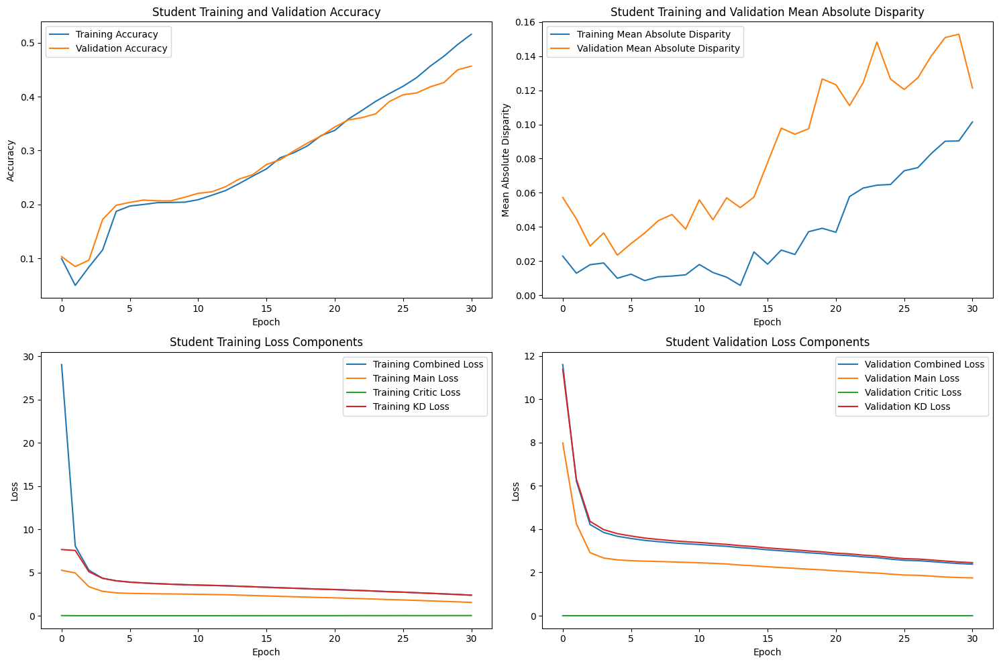

Epoch 32/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.80it/s]



STUDENT - Lambda 160 - Epoch 32 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.535340, VALIDATION Accuracy: 0.4648
TRAINING Disparity: 0.097003, VALIDATION Disparity: 0.1311
TRAINING Combined Loss: 2.307887, VALIDATION Combined Loss: 2.3131
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.023530098674607314
Class Celebration: Val Disparity = 0.026126945623610287
Class Parade: Val Disparity = 0.06708705552636196
Class Waiter_Or_Waitress: Val Disparity = -0.2535321821036107
Class Individual_Sports: Val Disparity = -0.029917343281398612
Class Surgeons: Val Disparity = -0.15594974131559486
Class Spa: Val Disparity = 0.03546099290780147
Class Law_Enforcement: Val Disparity = 0.3339146610859202
Class Business: Val Disparity = -0.06564364876385337
Class Dresses: Val Disparity = -0.5092024539877301
Class Water_Activities: Val Disparity = 0.08435097241067402
Class Picnic: Val Disparity = 0.0784313725490196
Class Rescue: 

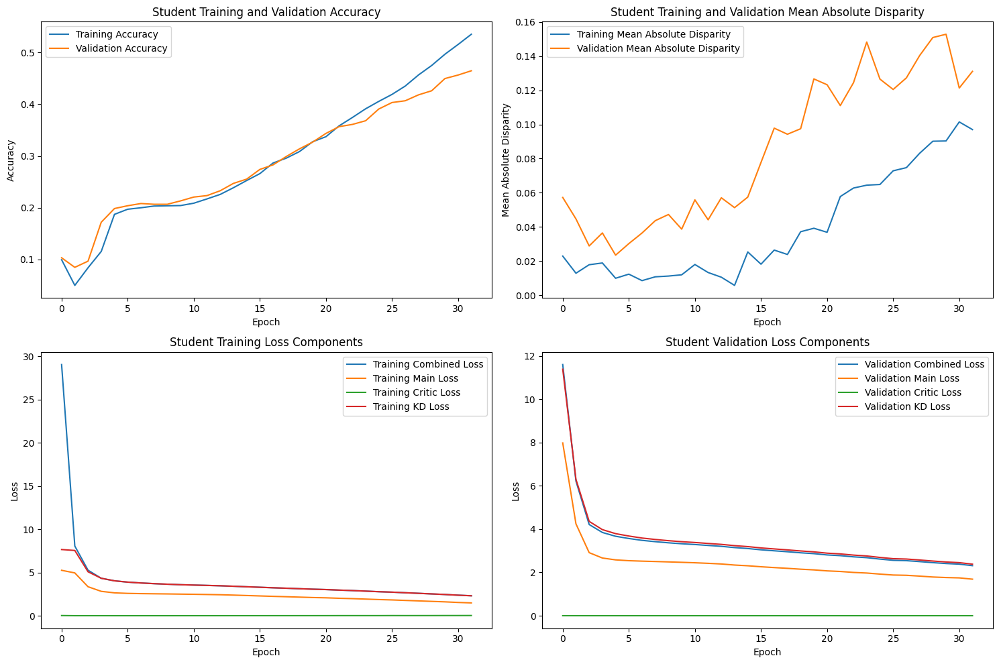

Epoch 33/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.74it/s]



STUDENT - Lambda 160 - Epoch 33 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.548823, VALIDATION Accuracy: 0.4713
TRAINING Disparity: 0.097831, VALIDATION Disparity: 0.1272
TRAINING Combined Loss: 2.241307, VALIDATION Combined Loss: 2.3133
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.023530098674607314
Class Celebration: Val Disparity = 0.026126945623610287
Class Parade: Val Disparity = 0.06708705552636196
Class Waiter_Or_Waitress: Val Disparity = -0.2535321821036107
Class Individual_Sports: Val Disparity = -0.029917343281398612
Class Surgeons: Val Disparity = -0.15594974131559486
Class Spa: Val Disparity = 0.03546099290780147
Class Law_Enforcement: Val Disparity = 0.3339146610859202
Class Business: Val Disparity = -0.06564364876385337
Class Dresses: Val Disparity = -0.5092024539877301
Class Water_Activities: Val Disparity = 0.08435097241067402
Class Picnic: Val Disparity = 0.0784313725490196
Class Rescue: 

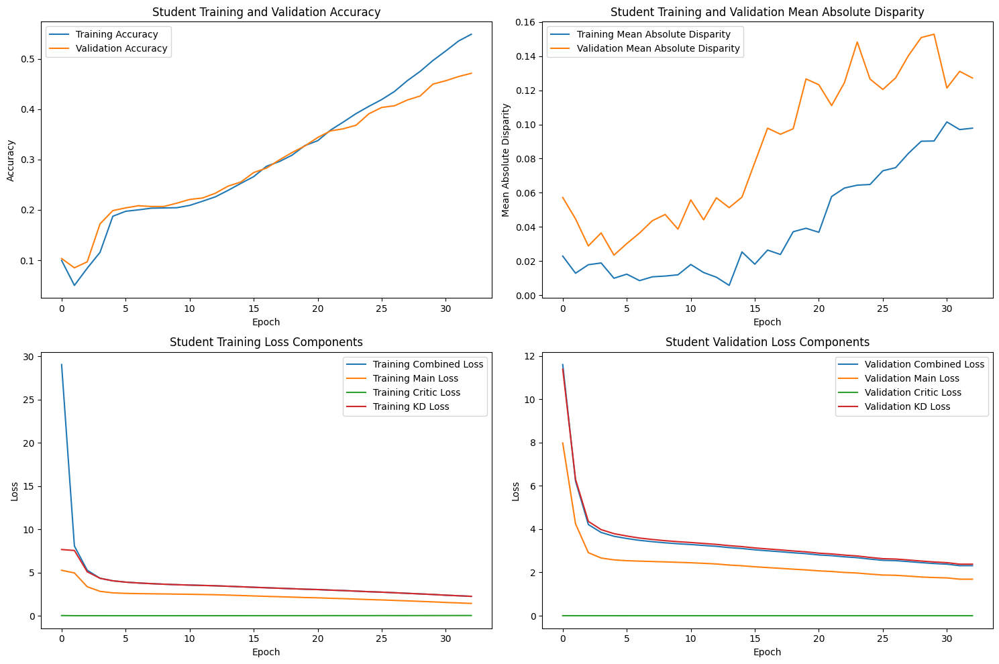

Epoch 34/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 160 - Epoch 34 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.573939, VALIDATION Accuracy: 0.4821
TRAINING Disparity: 0.099481, VALIDATION Disparity: 0.1293
TRAINING Combined Loss: 2.154280, VALIDATION Combined Loss: 2.2719
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.09833596076370643
Class Celebration: Val Disparity = -0.024560339599757453
Class Parade: Val Disparity = 0.0599054125065685
Class Waiter_Or_Waitress: Val Disparity = -0.3226059654631083
Class Individual_Sports: Val Disparity = -0.024650720503255008
Class Surgeons: Val Disparity = -0.1796008869179601
Class Spa: Val Disparity = -0.07092198581560283
Class Law_Enforcement: Val Disparity = 0.268340890594117
Class Business: Val Disparity = 0.03367433930093777
Class Dresses: Val Disparity = -0.5030674846625767
Class Water_Activities: Val Disparity = -0.043758480325644444
Class Picnic: Val Disparity = 0.052287581699346386
Class Rescue:

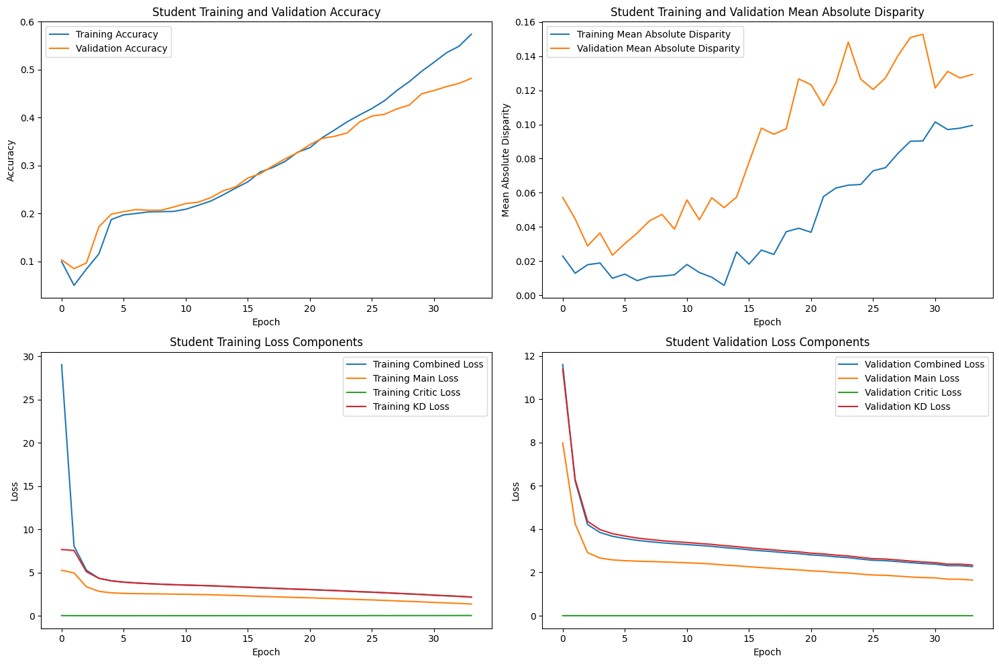

Epoch 35/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 160 - Epoch 35 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.595197, VALIDATION Accuracy: 0.4903
TRAINING Disparity: 0.107214, VALIDATION Disparity: 0.1085
TRAINING Combined Loss: 2.082605, VALIDATION Combined Loss: 2.2537
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.043732118876627646
Class Celebration: Val Disparity = 0.024105518496058242
Class Parade: Val Disparity = 0.10463011619080992
Class Waiter_Or_Waitress: Val Disparity = -0.24018838304552587
Class Individual_Sports: Val Disparity = -0.04092604783849019
Class Surgeons: Val Disparity = -0.039911308203991136
Class Spa: Val Disparity = 0.014184397163120588
Class Law_Enforcement: Val Disparity = 0.2585745843506569
Class Business: Val Disparity = -0.1123188405797102
Class Dresses: Val Disparity = -0.49079754601227005
Class Water_Activities: Val Disparity = 0.03912256897331523
Class Picnic: Val Disparity = 0.052287581699346386
Class Resc

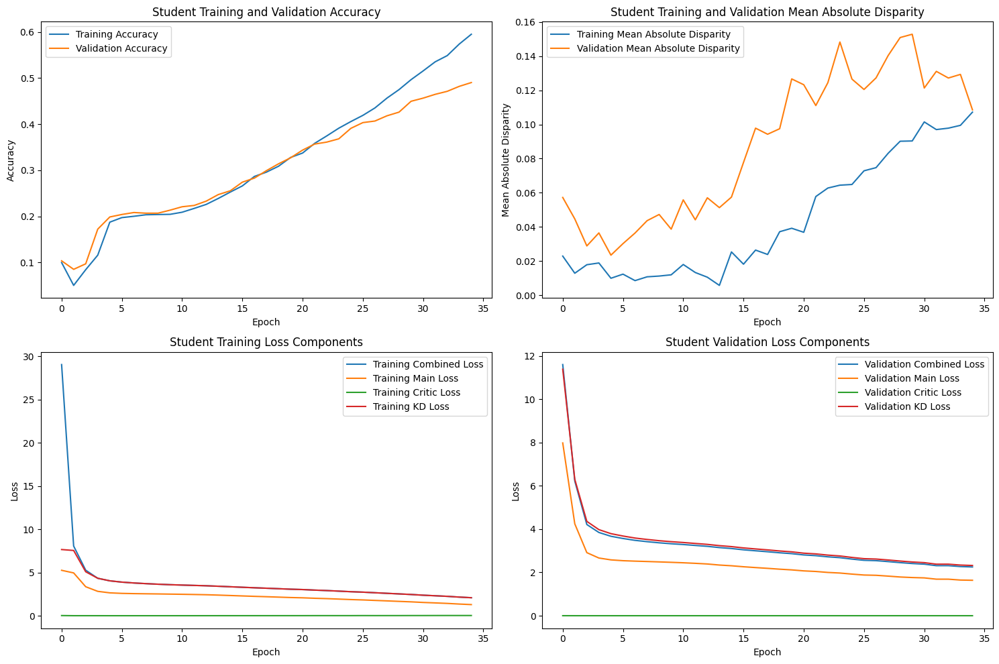

Epoch 36/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 160 - Epoch 36 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.611208, VALIDATION Accuracy: 0.4912
TRAINING Disparity: 0.103194, VALIDATION Disparity: 0.1250
TRAINING Combined Loss: 2.017355, VALIDATION Combined Loss: 2.2582
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.043732118876627646
Class Celebration: Val Disparity = 0.024105518496058242
Class Parade: Val Disparity = 0.10463011619080992
Class Waiter_Or_Waitress: Val Disparity = -0.24018838304552587
Class Individual_Sports: Val Disparity = -0.04092604783849019
Class Surgeons: Val Disparity = -0.039911308203991136
Class Spa: Val Disparity = 0.014184397163120588
Class Law_Enforcement: Val Disparity = 0.2585745843506569
Class Business: Val Disparity = -0.1123188405797102
Class Dresses: Val Disparity = -0.49079754601227005
Class Water_Activities: Val Disparity = 0.03912256897331523
Class Picnic: Val Disparity = 0.052287581699346386
Class Resc

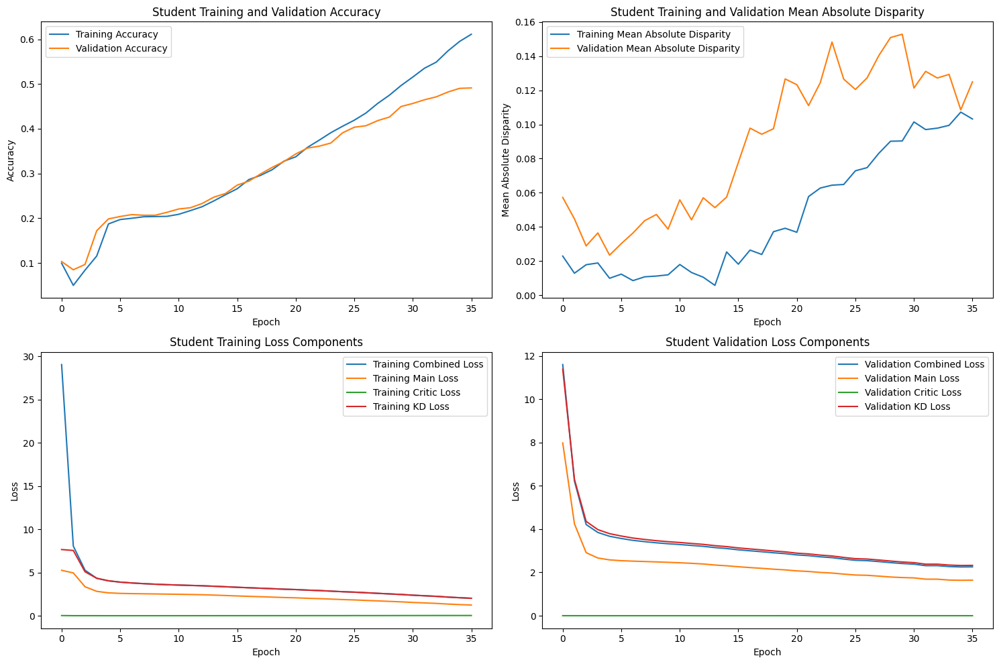

Epoch 37/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.71it/s]



STUDENT - Lambda 160 - Epoch 37 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.638194, VALIDATION Accuracy: 0.4991
TRAINING Disparity: 0.109787, VALIDATION Disparity: 0.1071
TRAINING Combined Loss: 1.919767, VALIDATION Combined Loss: 2.2350
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06219419629824252
Class Celebration: Val Disparity = 0.032544976753588084
Class Parade: Val Disparity = 0.11613242249080391
Class Waiter_Or_Waitress: Val Disparity = -0.2276295133437991
Class Individual_Sports: Val Disparity = -0.013056835637480724
Class Surgeons: Val Disparity = 0.033259423503326
Class Spa: Val Disparity = -0.09219858156028371
Class Law_Enforcement: Val Disparity = 0.25636553889082664
Class Business: Val Disparity = -0.05477408354646207
Class Dresses: Val Disparity = -0.5889570552147239
Class Water_Activities: Val Disparity = 0.008593396653098218
Class Picnic: Val Disparity = 0.013071895424836555
Class Rescue:

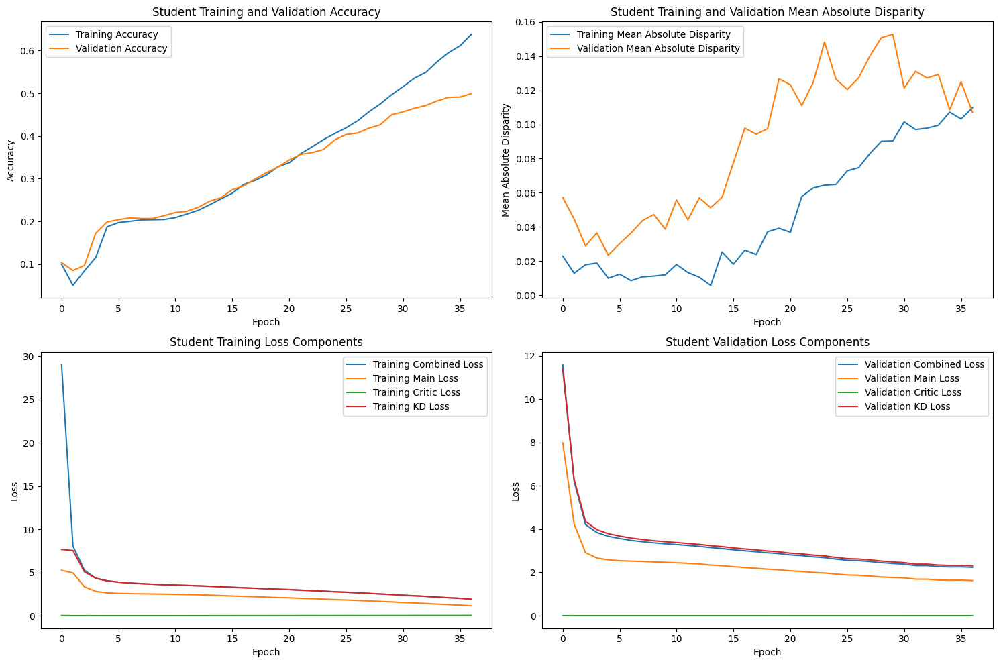

Epoch 38/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.80it/s]



STUDENT - Lambda 160 - Epoch 38 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.659915, VALIDATION Accuracy: 0.5051
TRAINING Disparity: 0.092299, VALIDATION Disparity: 0.1210
TRAINING Combined Loss: 1.839676, VALIDATION Combined Loss: 2.2373
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06219419629824252
Class Celebration: Val Disparity = 0.032544976753588084
Class Parade: Val Disparity = 0.11613242249080391
Class Waiter_Or_Waitress: Val Disparity = -0.2276295133437991
Class Individual_Sports: Val Disparity = -0.013056835637480724
Class Surgeons: Val Disparity = 0.033259423503326
Class Spa: Val Disparity = -0.09219858156028371
Class Law_Enforcement: Val Disparity = 0.25636553889082664
Class Business: Val Disparity = -0.05477408354646207
Class Dresses: Val Disparity = -0.5889570552147239
Class Water_Activities: Val Disparity = 0.008593396653098218
Class Picnic: Val Disparity = 0.013071895424836555
Class Rescue:

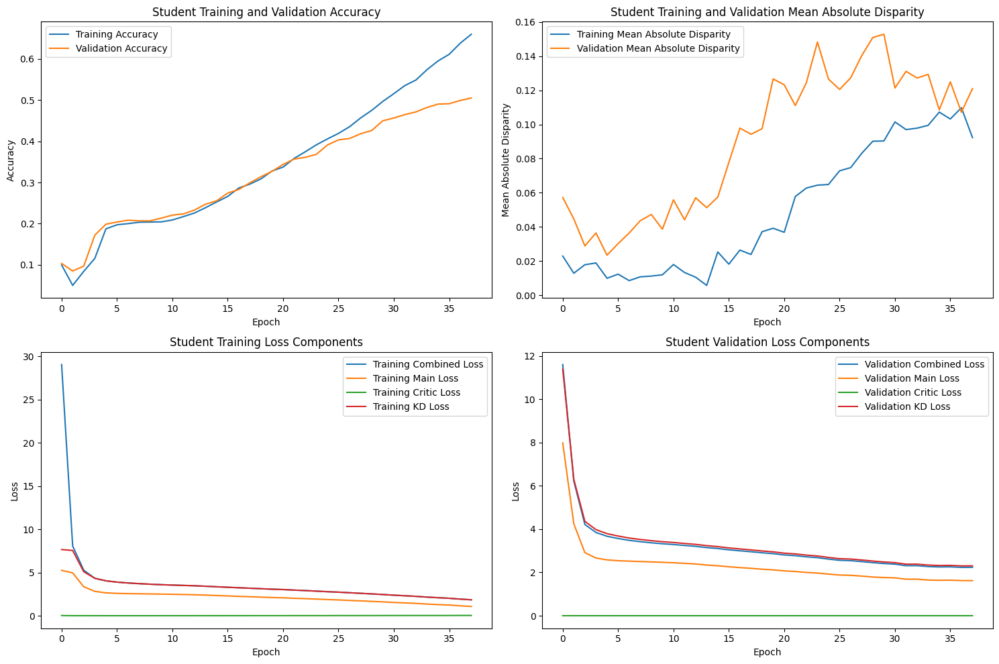

Epoch 39/200, Validation: 100%|████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 160 - Epoch 39 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.687211, VALIDATION Accuracy: 0.5136
TRAINING Disparity: 0.090606, VALIDATION Disparity: 0.1177
TRAINING Combined Loss: 1.757522, VALIDATION Combined Loss: 2.2584
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06219419629824252
Class Celebration: Val Disparity = 0.032544976753588084
Class Parade: Val Disparity = 0.11613242249080391
Class Waiter_Or_Waitress: Val Disparity = -0.2276295133437991
Class Individual_Sports: Val Disparity = -0.013056835637480724
Class Surgeons: Val Disparity = 0.033259423503326
Class Spa: Val Disparity = -0.09219858156028371
Class Law_Enforcement: Val Disparity = 0.25636553889082664
Class Business: Val Disparity = -0.05477408354646207
Class Dresses: Val Disparity = -0.5889570552147239
Class Water_Activities: Val Disparity = 0.008593396653098218
Class Picnic: Val Disparity = 0.013071895424836555
Class Rescue:

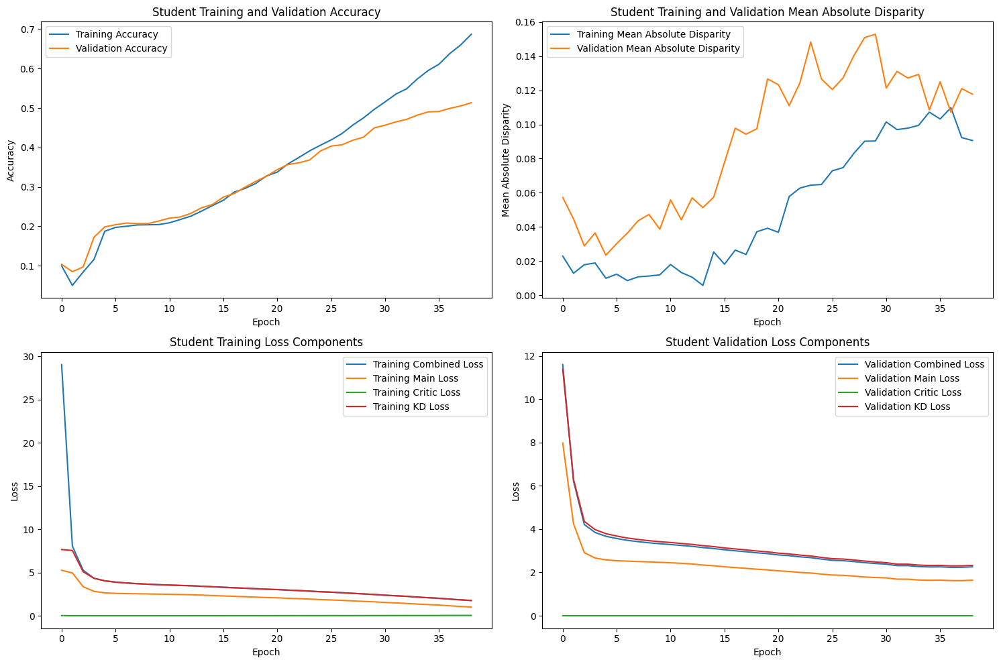

Epoch 40/200, Training:  82%|████████████████████████████████████████████████████▌           | 133/162 [01:36<00:20,  1.40it/s]

In [ ]:
# # STUDENT
# Create dict to store best model states
student_model_states_best = {}

# Specify the lambda_factor for the teacher model to load
lambda_factor = 0

# Define the path to the saved model file for this lambda_factor
lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lambda_factor}')
teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lambda_factor}.pth')

# Initialize the EfficientNet model without pre-trained weights
teacher = models.efficientnet_b3(pretrained=False)

# Adjust the classifier layer to match your number of classes
num_ftrs = teacher.classifier[1].in_features
teacher.classifier[1] = nn.Linear(num_ftrs, num_classes)

# Load the model state
teacher_best_model_state = torch.load(teacher_path)
teacher.load_state_dict(teacher_best_model_state['teacher_state_dict'])


# Loop through the lambda_factor_list
for lambda_factor in student_lambda_factor_list:
    # Load EfficientNet B0 model for Student
    student = models.efficientnet_b0(pretrained=True)
    
    # Determine the number of output features from the feature extractor part of EfficientNet B0
    num_ftrs = student.classifier[1].in_features  # This is the correct number of input features for your adversarial classifier
    
    # Modify the classifier layer of the EfficientNet model to match your number of classes
    student.classifier[1] = nn.Linear(num_ftrs, num_classes)
    

    # Initialize the Critic model
    critic = Critic(input_size=num_classes) # Adjust the input size based on your model's output
    critic_optimizer = optim.Adam(critic.parameters(), lr=student_learning_rate, weight_decay=weight_decay)
    critic_scheduler = lr_scheduler.ReduceLROnPlateau(critic_optimizer, mode='min', factor=0.2, patience=5, min_lr=0.0001)
    critic_loss_fn = torch.nn.MSELoss()
    
    # Redefine your main model optimizer if needed
    student_optimizer = optim.Adam(student.parameters(), lr=student_learning_rate, weight_decay=weight_decay)
    student_scheduler = lr_scheduler.ReduceLROnPlateau(student_optimizer, mode='min', factor=0.2, patience=5, min_lr=0.00001)
    student_loss_fn = nn.CrossEntropyLoss()

    # Train the model
    student_best_model_state = train_student(student, teacher, student_optimizer, student_loss_fn, critic, critic_optimizer, critic_loss_fn,
                                   lambda_factor, temperature, alpha, epsilon, margin, student_patience, student_epochs, device, base_save_dir=base_save_dir, 
                                    student_scheduler=student_scheduler, critic_scheduler=critic_scheduler)
    student_model_states_best[lambda_factor] = student_best_model_state

# Save the collective best model states to a file
student_collective_save_path = os.path.join(base_save_dir, 'student_model_states_best.pth')
torch.save(student_model_states_best, student_collective_save_path)

In [ ]:
# # load models
# collective_save_path = os.path.join(base_save_dir, 'student_model_states_best.pth')

# # Load the saved model states
# teacher_model_states_best = torch.load(collective_save_path)

# # Example: Accessing the best_val_accuracy for a specific lambda value
# lambda_value = 50
# if lambda_value in teacher_model_states_best:
#     best_model_state = teacher_model_states_best[lambda_value]
#     best_val_accuracy = best_model_state['best_val_accuracy']
#     print(f"Best validation accuracy for lambda {lambda_value}: {best_val_accuracy}")
# else:
#     print(f"No model state found for lambda {lambda_value}")

### PLOTTING

In [ ]:
def compare_performance_metrics(teacher, student, dataloader):
    teacher.eval()
    student.eval()
    
    all_labels = []
    all_teacher_preds = []
    all_student_preds = []

    for batch in dataloader:
        inputs = batch['img'].to(device)
        labels = batch['label'].to(device)
        
        with torch.no_grad():
            teacher_outputs = teacher(inputs)
            student_outputs = student(inputs)
            
        teacher_preds = torch.argmax(teacher_outputs, dim=1).cpu().numpy()
        student_preds = torch.argmax(student_outputs, dim=1).cpu().numpy()
        
        all_labels.append(labels.cpu().numpy())
        all_teacher_preds.append(teacher_preds)
        all_student_preds.append(student_preds)

    all_labels = np.concatenate(all_labels)
    all_teacher_preds = np.concatenate(all_teacher_preds)
    all_student_preds = np.concatenate(all_student_preds)
    
    metrics = {
        'accuracy': (accuracy_score(all_labels, all_teacher_preds), accuracy_score(all_labels, all_student_preds)),
        'precision': (precision_score(all_labels, all_teacher_preds, average='weighted', zero_division=0), precision_score(all_labels, all_student_preds, average='weighted', zero_division=0)),
        'recall': (recall_score(all_labels, all_teacher_preds, average='weighted'), recall_score(all_labels, all_student_preds, average='weighted')),
        'f1': (f1_score(all_labels, all_teacher_preds, average='weighted'), f1_score(all_labels, all_student_preds, average='weighted'))
    }

    return {
        'metrics': metrics,
        'all_labels': all_labels,
        'all_teacher_preds': all_teacher_preds,
        'all_student_preds': all_student_preds
    }

def compare_model_size(teacher, student):
    teacher_params = sum(p.numel() for p in teacher.parameters())
    student_params = sum(p.numel() for p in student.parameters())
    return teacher_params, student_params

def compare_inference_time(teacher, student, dataloader):
    dataiter = iter(dataloader)
    data = next(dataiter)
    inputs = data['img']
    inputs = inputs.to(device)

    teacher_time, student_time = 0, 0

    if teacher is not None:
        teacher = teacher.to(device)
        start_time = time.time()
        with torch.no_grad():
            teacher_outputs = teacher(inputs)
        teacher_time = time.time() - start_time

    if student is not None:
        student = student.to(device)
        start_time = time.time()
        with torch.no_grad():
            student_outputs = student(inputs)
        student_time = time.time() - start_time
    
    return teacher_time, student_time

In [ ]:
lambda_results = {}

# Loop through each lambda value
for lmda_teacher in teacher_lambda_factor_list:
    for lmda_student in student_lambda_factor_list:

        # Define the path to the saved model file for this lambda_factor
        lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lmda_teacher}')
        teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lmda_teacher}.pth')
        
        # Initialize the EfficientNet model without pre-trained weights
        teacher_model = models.efficientnet_b3(pretrained=False)
        
        # Adjust the classifier layer to match your number of classes
        num_ftrs = teacher.classifier[1].in_features
        teacher_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
        
        # Load the model state
        teacher_best_model_state = torch.load(teacher_path)
        teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
        teacher_model = teacher_model.to(device)
        
        # Define the path to the saved model file for this lambda_factor
        lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lmda_student}')
        student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lmda_student}.pth')
        
        # Initialize the EfficientNet model without pre-trained weights
        student_model = models.efficientnet_b0(pretrained=False)
        
        # Adjust the classifier layer to match your number of classes
        num_ftrs = student_model.classifier[1].in_features
        student_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
        
        # Load the model state
        student_best_model_state = torch.load(student_path)
        student_model.load_state_dict(student_best_model_state['student_state_dict'])
        student_model = student_model.to(device)
        
        # Compute performance metrics
        performance_metrics = compare_performance_metrics(teacher_model, student_model, testloader)
    
        # Compute model sizes
        teacher_params, student_params = compare_model_size(teacher_model, student_model)
    
        # Construct a unique key for the current combination of lambda values
        lambda_key = (lmda_teacher, lmda_student)

        # Update results for the current lambda value
        if lambda_key in lambda_results:
            lambda_results[lambda_key].update({
                'performance_metrics': performance_metrics,
                'teacher_params': teacher_params,
                'student_params': student_params
            })
        else:
            lambda_results[lambda_key] = {
                'performance_metrics': performance_metrics,
                'teacher_params': teacher_params,
                'student_params': student_params
            }

In [ ]:
# Initialize lists to store accuracies
teacher_accuracies = []
student_accuracies = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Access the performance metrics for each pair
    teacher_accuracy = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['accuracy'][0]
    student_accuracy = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['accuracy'][1]

    # Append accuracies to the lists
    teacher_accuracies.append((lmda_teacher, teacher_accuracy))
    student_accuracies.append((lmda_student, student_accuracy))

# To plot, you might need to separate the lambda values and accuracies
teacher_lambdas, teacher_acc = zip(*teacher_accuracies)
student_lambdas, student_acc = zip(*student_accuracies)

# Plotting only with markers and no lines
plt.scatter(teacher_lambdas, teacher_acc, label='Teacher Accuracy', marker='o')
plt.scatter(student_lambdas, student_acc, label='Student Accuracy', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison Across Lambdas')
plt.legend()

# Show plot
plt.show()

In [ ]:
# Initialize lists to store precisions
teacher_precisions = []
student_precisions = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the precision metrics for each pair
        teacher_precision = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['precision'][0]
        student_precision = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['precision'][1]
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append precisions to the lists along with lambda values
    teacher_precisions.append((lmda_teacher, teacher_precision))
    student_precisions.append((lmda_student, student_precision))

# Extracting lambda values and precisions
teacher_lambdas, teacher_prec = zip(*teacher_precisions)
student_lambdas, student_prec = zip(*student_precisions)

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_prec, label='Teacher Precision', marker='o')
plt.scatter(student_lambdas, student_prec, label='Student Precision', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Precision')
plt.title('Precision Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

In [ ]:
# Initialize lists to store recalls
teacher_recalls = []
student_recalls = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the recall metrics for each pair
        teacher_recall = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['recall'][0]
        student_recall = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['recall'][1]
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append recalls to the lists along with lambda values
    teacher_recalls.append((lmda_teacher, teacher_recall))
    student_recalls.append((lmda_student, student_recall))

# Extracting lambda values and recalls
teacher_lambdas, teacher_rec = zip(*teacher_recalls)
student_lambdas, student_rec = zip(*student_recalls)

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_rec, label='Teacher Recall', marker='o')
plt.scatter(student_lambdas, student_rec, label='Student Recall', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Recall')
plt.title('Recall Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

In [ ]:
# Initialize lists to store F1 scores
teacher_f1s = []
student_f1s = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the F1 scores for each pair
        teacher_f1 = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['f1'][0]
        student_f1 = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['f1'][1]
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append F1 scores to the lists along with lambda values
    teacher_f1s.append((lmda_teacher, teacher_f1))
    student_f1s.append((lmda_student, student_f1))

# Extracting lambda values and F1 scores
teacher_lambdas, teacher_f1_scores = zip(*teacher_f1s)
student_lambdas, student_f1_scores = zip(*student_f1s)

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_f1_scores, label='Teacher F1 Score', marker='o')
plt.scatter(student_lambdas, student_f1_scores, label='Student F1 Score', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

In [ ]:
# Initialize lists to store model sizes
teacher_sizes = []
student_sizes = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the model sizes for each pair
        teacher_size = lambda_results[(lmda_teacher, lmda_student)]['teacher_params'] / 1e6  # Convert to millions
        student_size = lambda_results[(lmda_teacher, lmda_student)]['student_params'] / 1e6
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append model sizes to the lists along with lambda values
    teacher_sizes.append((lmda_teacher, teacher_size))
    student_sizes.append((lmda_student, student_size))

# Extracting lambda values and model sizes
teacher_lambdas, teacher_model_sizes = zip(*teacher_sizes)
student_lambdas, student_model_sizes = zip(*student_sizes)

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_model_sizes, label='Teacher Model Size', marker='o')
plt.scatter(student_lambdas, student_model_sizes, label='Student Model Size', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Model Size (Millions of Parameters)')
plt.title('Model Size Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

In [ ]:
        # Define the path to the saved model file for this lambda_factor
        lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lmda_teacher}')
        teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lmda_teacher}.pth')
        
        # Initialize the EfficientNet model without pre-trained weights
        teacher_model = models.efficientnet_b3(pretrained=False)
        
        # Adjust the classifier layer to match your number of classes
        num_ftrs = teacher.classifier[1].in_features
        teacher_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
        
        # Load the model state
        teacher_best_model_state = torch.load(teacher_path)
        teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
        teacher_model = teacher_model.to(device)
        
        # Define the path to the saved model file for this lambda_factor
        lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lmda_student}')
        student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lmda_student}.pth')
        
        # Initialize the EfficientNet model without pre-trained weights
        student_model = models.efficientnet_b0(pretrained=False)
        
        # Adjust the classifier layer to match your number of classes
        num_ftrs = student_model.classifier[1].in_features
        student_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
        
        # Load the model state
        student_best_model_state = torch.load(student_path)
        student_model.load_state_dict(student_best_model_state['student_state_dict'])
        student_model = student_model.to(device)

In [ ]:
# Initialize dictionaries to store inference times for each lambda value
teacher_times = {}
student_times = {}

# Loop through each lambda value
for lmda_teacher in teacher_lambda_factor_list:
    # Define the path to the saved model file for this lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lmda_teacher}')
    teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lmda_teacher}.pth')
    
    # Initialize the EfficientNet model without pre-trained weights
    teacher_model = models.efficientnet_b3(pretrained=False)
    
    # Adjust the classifier layer to match your number of classes
    num_ftrs = teacher.classifier[1].in_features
    teacher_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
    
    # Load the model state
    teacher_best_model_state = torch.load(teacher_path)
    teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
    teacher_model = teacher_model.to(device)

    teacher_time, _ = compare_inference_time(teacher_model, None, testloader)
    teacher_times[lmda_teacher] = teacher_time  # Store the inference time for the teacher model

for lmda_student in student_lambda_factor_list:
    # Define the path to the saved model file for this lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lmda_student}')
    student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lmda_student}.pth')
    
    # Initialize the EfficientNet model without pre-trained weights
    student_model = models.efficientnet_b0(pretrained=False)
    
    # Adjust the classifier layer to match your number of classes
    num_ftrs = student_model.classifier[1].in_features
    student_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
    
    # Load the model state
    student_best_model_state = torch.load(student_path)
    student_model.load_state_dict(student_best_model_state['student_state_dict'])
    student_model = student_model.to(device)

    _, student_time = compare_inference_time(None, student_model, testloader)
    student_times[lmda_student] = student_time  # Store the inference time for the student model

# Extracting lambda values and inference times
teacher_lambdas, teacher_inference_times = zip(*teacher_times.items())
student_lambdas, student_inference_times = zip(*student_times.items())

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_inference_times, label='Teacher Inference Time', marker='o')
plt.scatter(student_lambdas, student_inference_times, label='Student Inference Time', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Inference Time (s)')
plt.title('Inference Time Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

In [ ]:
teacher_disparities = []
student_disparities = []

# Loop through each lambda_factor in the teacher_lambda_factor_list and extract the disparity values for the teacher
for lambda_factor in teacher_lambda_factor_list:
    # Load teacher model
    teacher_path = os.path.join(base_save_dir, f'TEACHER_lambda_{lambda_factor}', f'TEACHER_best_model_lambda_{lambda_factor}.pth')
    teacher_best_model_state = torch.load(teacher_path)
    teacher_disparities.append((lambda_factor, teacher_best_model_state['best_val_mean_abs_disparity']))

# Loop through each lambda_factor in the student_lambda_factor_list and extract the disparity values for the student
for lambda_factor in student_lambda_factor_list:
    # Load student model
    student_path = os.path.join(base_save_dir, f'STUDENT_lambda_{lambda_factor}', f'STUDENT_best_model_lambda_{lambda_factor}.pth')
    student_best_model_state = torch.load(student_path)
    student_disparities.append((lambda_factor, student_best_model_state['best_val_mean_abs_disparity']))

# Unpack the lambda factors and disparities for plotting
teacher_lambdas, teacher_disp_values = zip(*teacher_disparities)
student_lambdas, student_disp_values = zip(*student_disparities)

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_disp_values, label='Teacher', color='blue')
plt.scatter(student_lambdas, student_disp_values, label='Student', color='red')
plt.xlabel('Lambda Factor')
plt.ylabel('Best Val Mean Abs Disparity')
plt.title('Best Validation Mean Absolute Disparity vs Lambda Factor')
plt.legend()
plt.show()


In [ ]:
def plot_distribution(predictions, class_names, title):
    plt.figure(figsize=(6, 4))
    sns.countplot(x=predictions)
    plt.title(title)
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(range(len(class_names)), class_names, rotation=45)
    plt.tight_layout()
    plt.show()

def plot_confusion_matrix(all_labels, predictions, class_names, title):
    cm = confusion_matrix(all_labels, predictions)
    plt.figure(figsize=(6, 6))
    sns.heatmap(pd.DataFrame(cm, index=class_names, columns=class_names), annot=True, fmt='g')
    plt.title(title)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Function to generate predictions and compute metrics
def generate_predictions_and_metrics(model, dataloader):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for batch in dataloader:
            inputs = batch['img'].to(device)
            labels = batch['label'].to(device)
            
            outputs = model(inputs)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            
            all_labels.append(labels.cpu().numpy())
            all_preds.append(preds)

    all_labels = np.concatenate(all_labels)
    all_preds = np.concatenate(all_preds)

    return all_labels, all_preds

# Loop over each lambda value for the teacher model
for lmda_teacher in teacher_lambda_factor_list:
    # Define the path to the saved model file for this lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lmda_teacher}')
    teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lmda_teacher}.pth')
    
    # Initialize the EfficientNet model without pre-trained weights
    teacher_model = models.efficientnet_b3(pretrained=False)
    
    # Adjust the classifier layer to match your number of classes
    num_ftrs = teacher.classifier[1].in_features
    teacher_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
    
    # Load the model state
    teacher_best_model_state = torch.load(teacher_path)
    teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
    teacher_model = teacher_model.to(device)
    
    # Generate predictions for the teacher model
    all_labels, all_teacher_preds = generate_predictions_and_metrics(teacher_model, testloader)

    # Plot distribution and confusion matrix for the teacher model
    plot_distribution(all_teacher_preds, class_names_new, f'Teacher Model Predictions (Lambda={lmda_teacher})')
    plot_confusion_matrix(all_labels, all_teacher_preds, class_names_new, f'Teacher Confusion Matrix (Lambda={lmda_teacher})')

    # Print classification report for the teacher model
    teacher_report = classification_report(all_labels, all_teacher_preds, target_names=class_names_new, zero_division=0)
    print(f'Classification Report - Teacher Model (Lambda={lmda_teacher})')
    print(teacher_report)

# Loop over each lambda value for the student model
for lmda_student in student_lambda_factor_list:
    # Define the path to the saved model file for this lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lmda_student}')
    student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lmda_student}.pth')
    
    # Initialize the EfficientNet model without pre-trained weights
    student_model = models.efficientnet_b0(pretrained=False)
    
    # Adjust the classifier layer to match your number of classes
    num_ftrs = student_model.classifier[1].in_features
    student_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
    
    # Load the model state
    student_best_model_state = torch.load(student_path)
    student_model.load_state_dict(student_best_model_state['student_state_dict'])
    student_model = student_model.to(device)

    # Generate predictions for the student model
    all_labels, all_student_preds = generate_predictions_and_metrics(student_model, testloader)

    # Plot distribution and confusion matrix for the student model
    plot_distribution(all_student_preds, class_names_new, f'Student Model Predictions (Lambda={lmda_student})')
    plot_confusion_matrix(all_labels, all_student_preds, class_names_new, f'Student Confusion Matrix (Lambda={lmda_student})')

    # Print classification report for the student model
    student_report = classification_report(all_labels, all_student_preds, target_names=class_names_new, zero_division=0)
    print(f'Classification Report - Student Model (Lambda={lmda_student})')
    print(student_report)

In [ ]:
def plot_bias_variance_tradeoff(base_save_dir, model_type, lambda_list):
    bias_values = []
    accuracy_values = []

    for lambda_factor in lambda_list:
        model_path = os.path.join(base_save_dir, f'{model_type.upper()}_lambda_{lambda_factor}', f'{model_type.upper()}_best_model_lambda_{lambda_factor}.pth')
        if os.path.exists(model_path):
            model_state = torch.load(model_path)

            disparity = model_state['best_val_mean_abs_disparity']
            accuracy = model_state['best_val_accuracy']
            bias_values.append(disparity)
            accuracy_values.append(accuracy)

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.scatter(bias_values, accuracy_values, label=f'{model_type.title()} Model')
    plt.xlabel('Mean Absolute Disparity')
    plt.ylabel('Validation Accuracy')
    plt.title(f'{model_type.title()} Model Accuracy vs Disparity')
    for i, lambda_factor in enumerate(lambda_list):
        plt.annotate(f'λ={lambda_factor}', (bias_values[i], accuracy_values[i]), textcoords="offset points", xytext=(0,10), ha='center')
    plt.legend()
    plt.show()

# Plot for Teacher
plot_bias_variance_tradeoff(base_save_dir, 'teacher', teacher_lambda_factor_list)

# Plot for Student
plot_bias_variance_tradeoff(base_save_dir, 'student', student_lambda_factor_list)

In [ ]:
def compare_performance_metrics_for_demo(teacher, student, dataloader):
    teacher.eval()
    student.eval()

    detailed_info = []

    for batch in dataloader:
        inputs = batch['img'].to(device)
        labels = batch['label'].to(device)
        # Assuming gender or other attributes are part of 'target'
        attributes = batch['target'].to(device)  

        with torch.no_grad():
            teacher_outputs = teacher(inputs)
            student_outputs = student(inputs)

        teacher_preds = torch.argmax(teacher_outputs, dim=1)
        student_preds = torch.argmax(student_outputs, dim=1)

        for i in range(inputs.size(0)):
            if teacher_preds[i] != labels[i] and student_preds[i] == labels[i]:
                info = {
                    'image': inputs[i],
                    'actual_class': labels[i].item(),
                    'teacher_pred_class': teacher_preds[i].item(),
                    'student_pred_class': student_preds[i].item(),
                    'actual_attribute': attributes[i].item(),  # Modify based on your dataset
                    # If your model also predicts attributes, include them here
                }
                detailed_info.append(info)

    return detailed_info

In [ ]:
def plot_images_with_class_filter(info_list, display_class, new_label_mapping, rows=10, cols=5):
    # Filter the info list based on the specified class, student correct and teacher incorrect predictions
    filtered_info = [info for info in info_list if info['actual_class'] == display_class and 
                     info['student_pred_class'] == display_class and 
                     info['teacher_pred_class'] != display_class]

    # Calculate the number of images to display based on the length of the filtered list
    num_images = len(filtered_info)
    if num_images == 0:
        print(f"No images to display for class {display_class}.")
        return  # Skip this class as there are no images to display

    total_plots = min(rows * cols, num_images)  # Ensure we don't exceed the number of filtered images

    # Determine the number of rows needed based on the number of images
    rows = (total_plots + cols - 1) // cols

    # Create a figure with the adjusted number of rows and columns
    fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    axes = axes.ravel()

    for i in range(total_plots):
        data = filtered_info[i]
        image = data['image']
        actual_class = new_label_mapping[data['actual_class']]  # Get class name from the mapping
        teacher_pred_class = new_label_mapping[data['teacher_pred_class']]  # Get class name from the mapping
        student_pred_class = new_label_mapping[data['student_pred_class']]  # Get class name from the mapping
        actual_attribute = round(data['actual_attribute'], 3)
    
        # Normalize the image for display
        image_display = image.cpu().numpy().transpose(1, 2, 0)
        image_display = (image_display - image_display.min()) / (image_display.max() - image_display.min())
    
        # Set the title with the class and attribute information
        title = f'Attr: {actual_attribute}\nTrue: {actual_class}\nTeacher: {teacher_pred_class}\nStudent: {student_pred_class}'
    
        axes[i].imshow(image_display)
        axes[i].set_title(title, fontsize=12, pad=4)
        axes[i].axis('off')

    # Turn off any unused axes
    for i in range(total_plots, len(axes)):
        axes[i].axis('off')

    # Adjust layout for clarity
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.5, hspace=0.6)
    plt.show()


In [ ]:
# Load the Teacher Model for a specific lambda value
def load_teacher_model(lambda_factor):
    lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lambda_factor}')
    teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lambda_factor}.pth')

    teacher_model = models.efficientnet_b3(pretrained=False)
    num_ftrs = teacher_model.classifier[1].in_features
    teacher_model.classifier[1] = torch.nn.Linear(num_ftrs, num_classes)

    teacher_best_model_state = torch.load(teacher_path)
    teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
    teacher_model = teacher_model.to(device)
    return teacher_model

# Load the Student Model for a specific lambda value
def load_student_model(lambda_factor):
    lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lambda_factor}')
    student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lambda_factor}.pth')

    student_model = models.efficientnet_b0(pretrained=False)
    num_ftrs = student_model.classifier[1].in_features
    student_model.classifier[1] = torch.nn.Linear(num_ftrs, num_classes)

    student_best_model_state = torch.load(student_path)
    student_model.load_state_dict(student_best_model_state['student_state_dict'])
    student_model = student_model.to(device)
    return student_model

# Load models for a specific lambda value
teacher_lambda_factor = 0 
student_lambda_factor = 50

teacher_model = load_teacher_model(teacher_lambda_factor)
student_model = load_student_model(student_lambda_factor)

# Assuming 'testloader', 'new_label_mapping', and 'num_classes' are defined
# Get detailed info where student is correct and teacher is wrong
detailed_info = compare_performance_metrics_for_demo(teacher_model, student_model, testloader)

# Plot images
for i in range(num_classes):
    print('='*60)
    print(f'CLASS {i}: {new_label_mapping[i]}')
    print('='*60)
    plot_images_with_class_filter(detailed_info, display_class=i, new_label_mapping=new_label_mapping, rows=100, cols=5)
